In [ ]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Alternative: direct upload of zip file
import zipfile
import os

zip_path = "/content/fairytale_corpus.zip"
extract_dir = "/content/files_unzipped"

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_dir)

print("All files were unzipped to ", extract_dir, ".")

Alle Dateien wurden nach /content/files_entpackt entpackt.


# Sentiment Analysis

## Text level

In [ ]:
import os
import pandas as pd

# Base directory in Google Drive
base_path = "/content/drive/MyDrive/Märchen-Seminar/Korpus"

rows = []

for root, dirs, files in os.walk(base_path):
    for file in files:
        if not file.endswith(".txt"):
            continue

        path = os.path.join(root, file)

        # Folder structure:
        # .../Korpus/Andersen/Original/FILE.txt
        parts = root.split(os.sep)

        # Author (Andersen / Grimm)
        author = parts[-2] if len(parts) >= 2 else "Unknown"

        # Type (Original / Copilot / Wikipedia)
        text_type = parts[-1] if len(parts) >= 1 else "Other"

        # Parse filename
        # Format: Year_OriginalAuthor_Source_Author_Title.txt
        name = file.replace(".txt", "")
        parts_file = name.split("_")

        year = parts_file[0] if parts_file[0].isdigit() else None
        original_author = parts_file[1] if len(parts_file) > 1 else None
        source = parts_file[2] if len(parts_file) > 2 else None
        author2 = parts_file[3] if len(parts_file) > 3 else None

        # Title = everything from index 4 onward
        title = " ".join(parts_file[4:]) if len(parts_file) > 4 else name

        # Load text
        with open(path, "r", encoding="utf-8") as f:
            text = f.read()

        rows.append({
            "Author": author,
            "Type": text_type,
            "Year": year,
            "OriginalAuthor": original_author,
            "Source": source,
            "Author2": author2,
            "Title": title,
            "Text": text,
            "Filename": file,
            "Path": path
        })

df = pd.DataFrame(rows)
df.to_csv("/content/drive/MyDrive/Märchen-Seminar/Korpus/fairy_tale_corpus_complete.csv", index=False, encoding="utf-8-sig")
df.head()


,Author,Type,Year,OriginalAuthor,Source,Author2,Title,Text,Filename,Path
0,Andersen,Wikipedia,1987,Andersen,Wikipedia,Fleischer,Der kleine und der große Klaus,Der kleine und der große Klaus\n\nIn einem kle...,1987_Andersen_Wikipedia_Fleischer_Der_kleine_u...,/content/drive/MyDrive/Märchen-Seminar/Korpus/...
1,Andersen,Wikipedia,1987,Andersen,Wikipedia,Burrell,Das Mädchen mit den Wunderhölzern,Das Mädchen mit den Wunderhölzern\n\nMolly möc...,1987_Andersen_Wikipedia_Burrell_Das_Mädchen_m...,/content/drive/MyDrive/Märchen-Seminar/Korpus/...
2,Andersen,Wikipedia,1986,Andersen,Wikipedia,Hartzell,Die Schneekönigin,"Die Schneekönigin\n\nEine Prophezeiung besagt,...",1986_Andersen_Wikipedia_Hartzell_Die_Schneekö...,/content/drive/MyDrive/Märchen-Seminar/Korpus/...
3,Andersen,Wikipedia,1968,Andersen,Wikipedia,Dunski,Ein uraltes Märchen,Ein uraltes Märchen\n\nEin armer Puppenspieler...,1968_Andersen_Wikipedia_Dunski_Ein_uraltes_Mä...,/content/drive/MyDrive/Märchen-Seminar/Korpus/...
4,Andersen,Wikipedia,1971,Andersen,Wikipedia,Küchenmeister,Der kleine und der große Klaus,Der kleine und der große Klaus\n\nDer kleine K...,1971_Andersen_Wikipedia_Küchenmeister_Der_kle...,/content/drive/MyDrive/Märchen-Seminar/Korpus/...


In [ ]:
df_grimm = df[df["OriginalAuthor"] == "Grimm"]
df_andersen = df[df["OriginalAuthor"] == "Andersen"]

df_grimm.to_csv("/content/drive/MyDrive/Märchen-Seminar/Korpus/fairytale_corpus_grimm.csv", index=False, encoding="utf-8-sig")
df_andersen.to_csv("/content/drive/MyDrive/Märchen-Seminar/Korpus/fairytale_corpus_andersen.csv", index=False, encoding="utf-8-sig")

In [ ]:
df = pd.read_csv("/content/drive/MyDrive/Märchen-Seminar/Korpus/fairytale_corpus_grimm.csv", sep=",")
print(df.columns)
df.head()

Index(['Author', 'Type', 'Year', 'OriginalAuthor', 'Source', 'Author2',
       'Title', 'Text', 'Filename', 'Path'],
      dtype='object')


,Author,Type,Year,OriginalAuthor,Source,Author2,Title,Text,Filename,Path
0,Grimm,Wikipedia,2014,Grimm,Wikipedia,Turhan,Die drei Federn,"Die drei Federn\n\nFürst Gundolf, des Regieren...",2014_Grimm_Wikipedia_Turhan_Die_drei_Federn.txt,/content/drive/MyDrive/Märchen-Seminar/Korpus/...
1,Grimm,Wikipedia,2025,Grimm,Wikipedia,Wilson,Schneewittchen,Schneewittchen\n\nIn einem friedlichen Königre...,2025_Grimm_Wikipedia_Wilson_Schneewittchen.txt,/content/drive/MyDrive/Märchen-Seminar/Korpus/...
2,Grimm,Wikipedia,2015,Grimm,Wikipedia,Bongartz,Hans im Glück,Hans im Glück\n\nNach sieben Jahren Lehre bei ...,2015_Grimm_Wikipedia_Bongartz_Hans_im_Glück.txt,/content/drive/MyDrive/Märchen-Seminar/Korpus/...
3,Grimm,Wikipedia,1962,Grimm,Wikipedia,Stobrawa,König Drosselbart,"König Drosselbart\n\nEine hübsche, etwas hochm...",1962_Grimm_Wikipedia_Stobrawa_König_Drosselba...,/content/drive/MyDrive/Märchen-Seminar/Korpus/...
4,Grimm,Wikipedia,1980,Grimm,Wikipedia,Hübner,Gevatter Tod,Gevatter Tod\n\nGörlitz um 1500: Der arme Baue...,1980_Grimm_Wikipedia_Hübner_Gevatter_Tod.txt,/content/drive/MyDrive/Märchen-Seminar/Korpus/...


In [ ]:
from transformers import pipeline
import pandas as pd
from tqdm import tqdm

# Load model
sentiment_pipeline = pipeline("sentiment-analysis", model="oliverguhr/german-sentiment-bert")

# Load corpus
df = pd.read_csv("/content/drive/MyDrive/Märchen-Seminar/Korpus/fairytale_corpus_grimm.csv", sep=",")

# Progress bar when scrolling through texts
sentiments = []
for text in tqdm(df["Text"], desc="Analysiere Texte"):
    result = sentiment_pipeline(text[:512])[0]["label"]
    sentiments.append(result)

df["Sentiment"] = sentiments

# Save to CSV
df.to_csv("/content/drive/MyDrive/Märchen-Seminar/Sentiment Analyse   Emotion Detection/grimm_fairytale_corpus_sentiment.csv", sep="\t", index=False, encoding="utf-8")

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/665 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/436M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/201 [00:00<?, ?it/s]

tokenizer_config.json:   0%|          | 0.00/161 [00:00<?, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

Analysiere Texte: 100%|██████████| 214/214 [00:02<00:00, 81.88it/s] 


Sentiment  negative  neutral  positive
Type                                  
Copilot           1       86         0
Original          6       34         0
Wikipedia         5       81         1


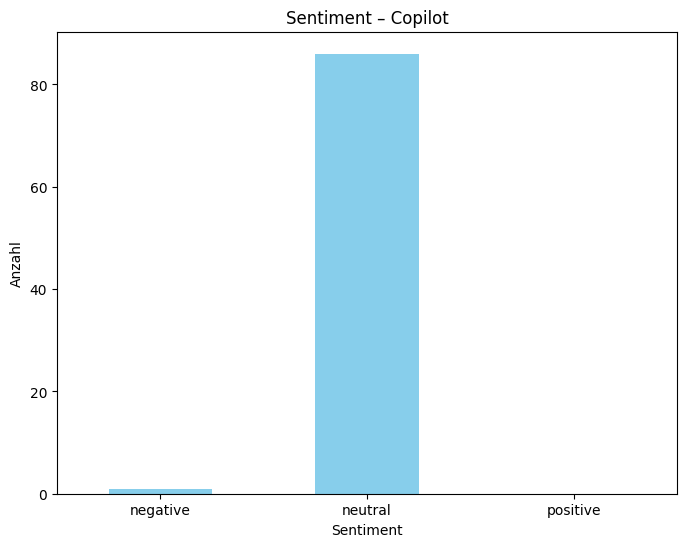

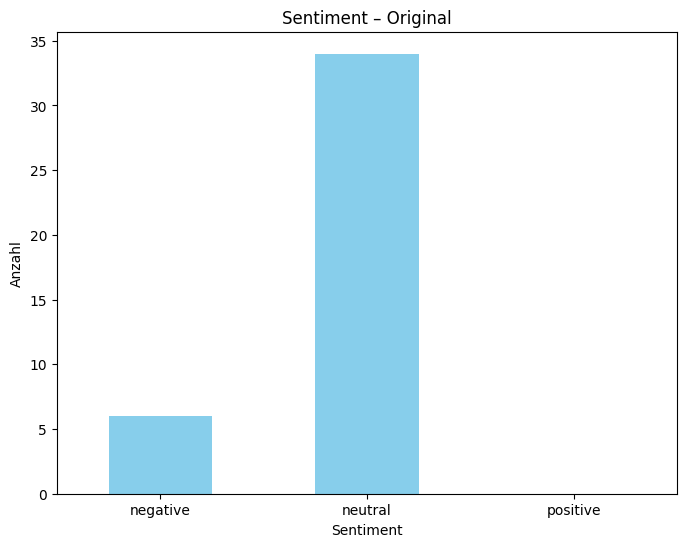

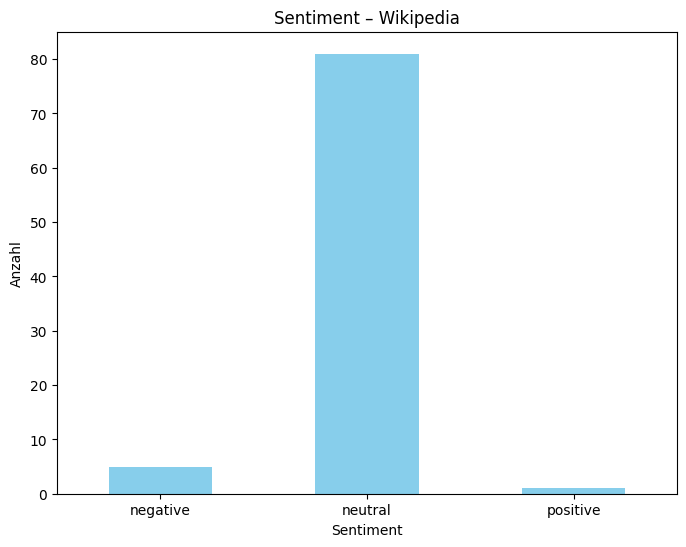

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

df = pd.read_csv("/content/drive/MyDrive/Märchen-Seminar/Sentiment Analyse   Emotion Detection/grimm_fairytale_corpus_sentiment.csv", sep="\t", encoding="utf-8")

# Group by type and sentiment
grouped = df.groupby(["Type", "Sentiment"]).size().unstack(fill_value=0)

print(grouped)

# Diagram per type
for typ, row in grouped.iterrows():
    fig, ax = plt.subplots(figsize=(8, 6))
    row.plot(kind="bar", ax=ax, title=f"Sentiment – {typ}", color="skyblue")
    ax.set_ylabel("Anzahl")
    ax.set_xlabel("Sentiment")
    ax.set_xticklabels(ax.get_xticklabels(), rotation=0)
    fig.savefig(f"/content/drive/MyDrive/Märchen-Seminar/Sentiment Analyse   Emotion Detection/Images/figure_grimm_text_sentiment_{typ}.jpg", dpi=300, bbox_inches='tight')
    plt.show()

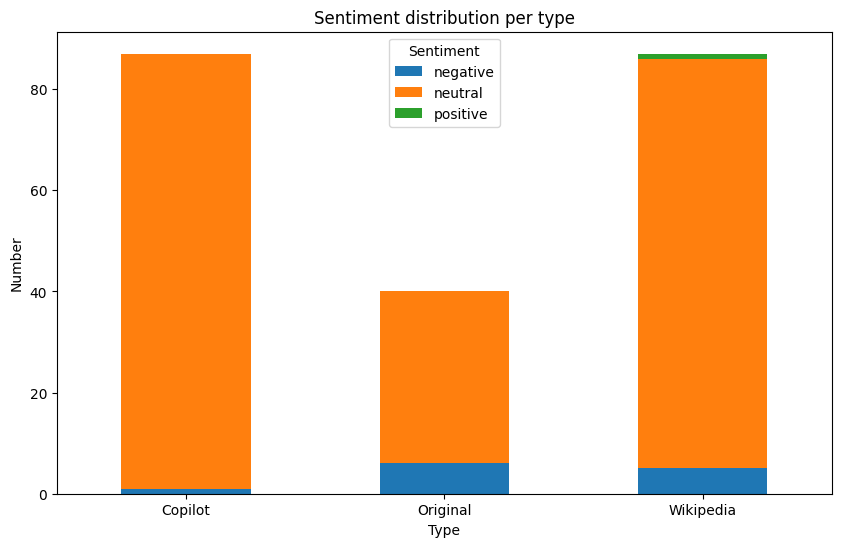

In [ ]:
fig, ax = plt.subplots(figsize=(10, 6))
grouped.plot(kind="bar", stacked=True, ax=ax)
ax.set_title("Sentiment distribution per type")
ax.set_ylabel("Number")
ax.set_xlabel("Type")
ax.set_xticklabels(ax.get_xticklabels(), rotation=0)
fig.savefig("/content/drive/MyDrive/Märchen-Seminar/Sentiment Analyse   Emotion Detection/Images/figure_grimm_sentiment_distribution.jpg", dpi=300, bbox_inches='tight')
plt.show()

## Sentence level

In [ ]:
import nltk
from transformers import pipeline
from tqdm import tqdm
import pandas as pd

# Download sentence tokenizer
nltk.download("punkt")
nltk.download("punkt_tab")

# Load German sentiment model
sentiment_pipeline = pipeline(
    "sentiment-analysis",
    model="oliverguhr/german-sentiment-bert"
)

rows = []

# Iterate through all rows in your corpus DataFrame
for _, row in tqdm(df.iterrows(), total=len(df), desc="Analyzing sentences"):
    text = row["Text"]

    # Split text into sentences
    sentences = nltk.sent_tokenize(text, language="german")

    # Analyze each sentence
    for i, s in enumerate(sentences, start=1):
        sentiment = sentiment_pipeline(s[:512])[0]["label"]
        rows.append({
            "Author": row["Author"],
            "Type": row["Type"],
            "Title": row["Title"],
            "SentenceNr": i,
            "Sentence": s,
            "Sentiment": sentiment
        })

# Create DataFrame with sentence-level sentiment
df_sentences = pd.DataFrame(rows)

# Save to file
df_sentences.to_csv(
    "/content/drive/MyDrive/Märchen-Seminar/Sentiment Analyse   Emotion Detection/grimm_fairy_tales_sentence_sentiment.csv",
    sep="\t",
    index=False,
    encoding="utf-8-sig"
)

df_sentences.head()


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt_tab.zip.


Loading weights:   0%|          | 0/201 [00:00<?, ?it/s]

Analyzing sentences: 100%|██████████| 214/214 [01:29<00:00,  2.40it/s]


,Author,Type,Title,SentenceNr,Sentence,Sentiment
0,Grimm,Wikipedia,Die drei Federn,1,"Die drei Federn\n\nFürst Gundolf, des Regieren...",neutral
1,Grimm,Wikipedia,Die drei Federn,2,"Er verspricht seinem Hofmeister Julius, nur de...",neutral
2,Grimm,Wikipedia,Die drei Federn,3,Seine älteren Söhne Gerhard und Gebhard sind f...,neutral
3,Grimm,Wikipedia,Die drei Federn,4,Von den Fähigkeiten ihres jüngeren Bruders Gus...,neutral
4,Grimm,Wikipedia,Die drei Federn,5,Damit die Brüder nicht in derselben Richtung s...,neutral


In [ ]:
agg_typ = (
    df_sentences
    .groupby(["Author", "Type", "Sentiment"])
    .size()
    .unstack(fill_value=0)
)

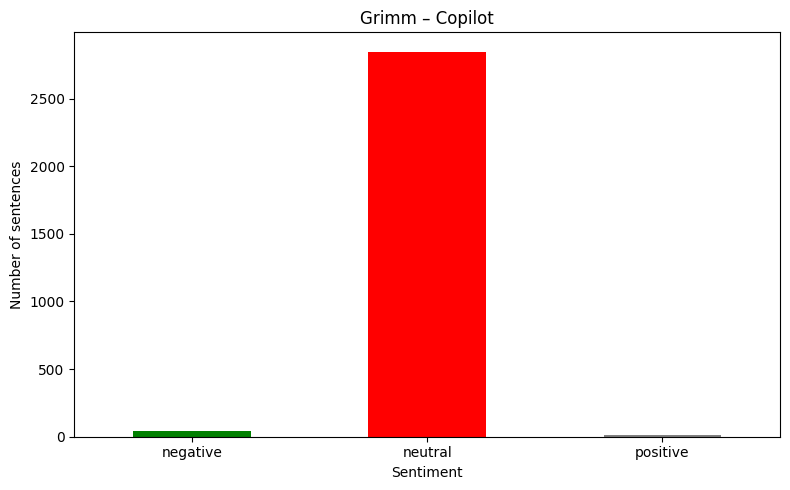

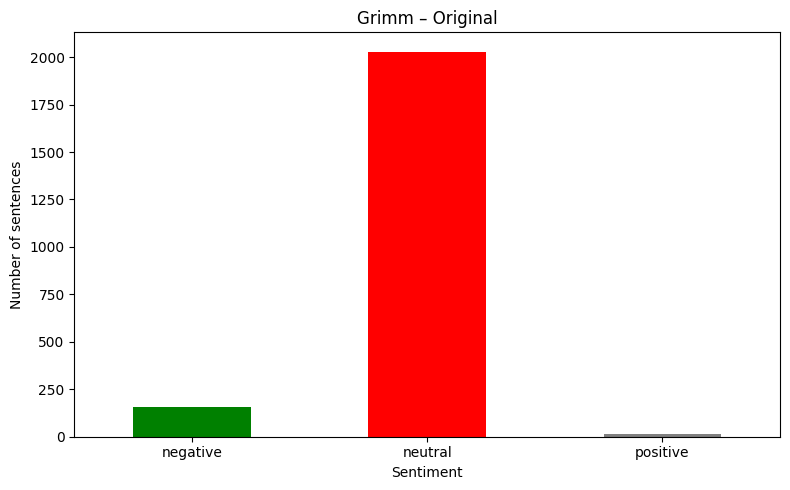

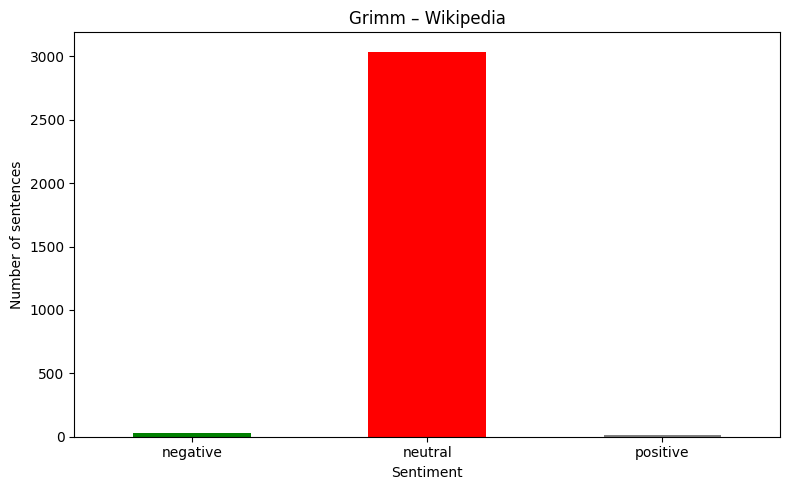

In [ ]:
for (author, text_type), row in agg_typ.iterrows():
    fig, ax = plt.subplots(figsize=(8, 5))
    row.plot(kind="bar", color=["green", "red", "gray"], ax=ax,
             title=f"{author} – {text_type}")
    ax.set_ylabel("Number of sentences")
    ax.set_xticklabels(ax.get_xticklabels(), rotation=0)
    plt.tight_layout()
    fig.savefig(f"/content/drive/MyDrive/Märchen-Seminar/Sentiment Analyse   Emotion Detection/Images/figure_grimm_sentence_sentiment_{text_type}.jpg", dpi=300, bbox_inches='tight')
    plt.show()

In [ ]:
agg_text = (
    df_sentences
    .groupby(["Author", "Type", "Title", "Sentiment"])
    .size()
    .unstack(fill_value=0)
    .reindex(columns=["positive", "negative", "neutral"], fill_value=0)
)

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


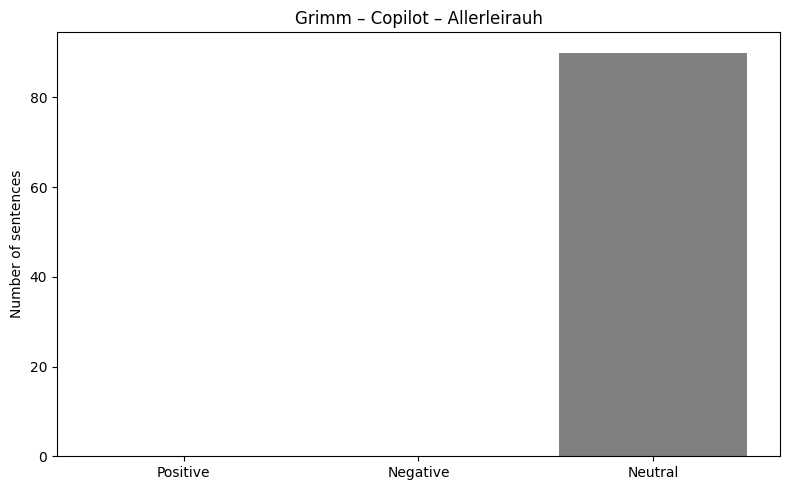

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


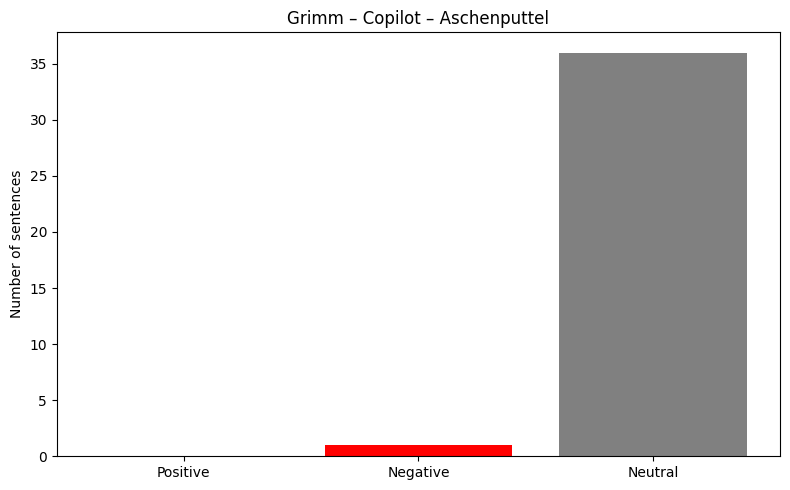

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


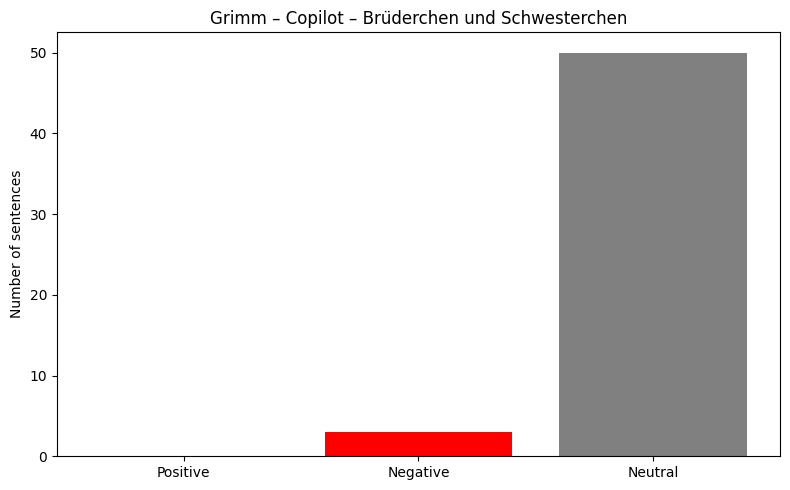

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


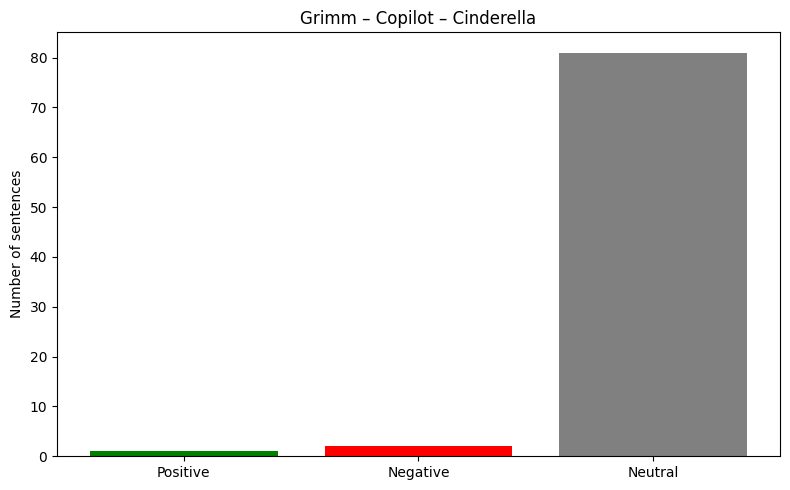

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


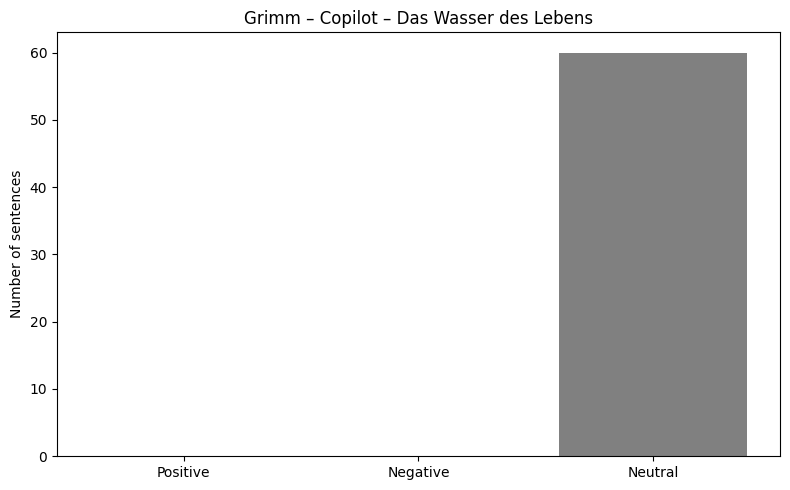

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


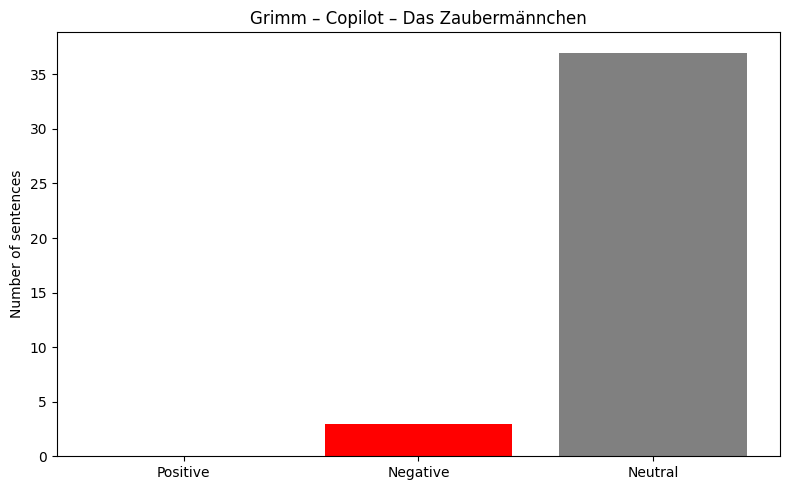

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


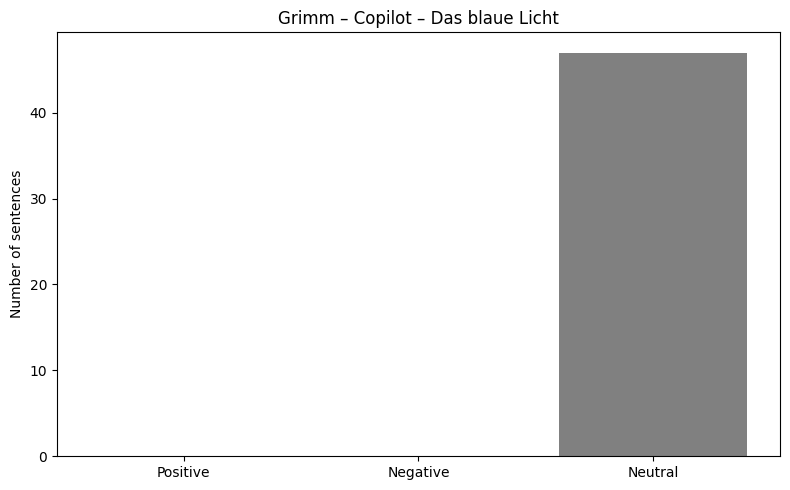

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


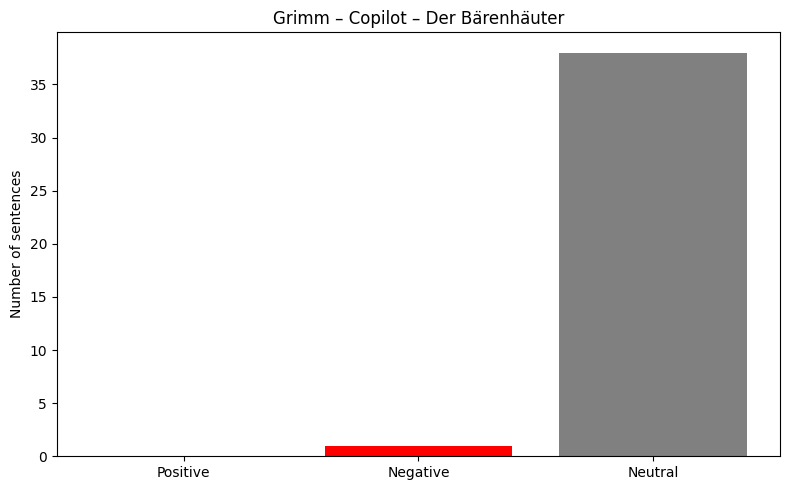

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


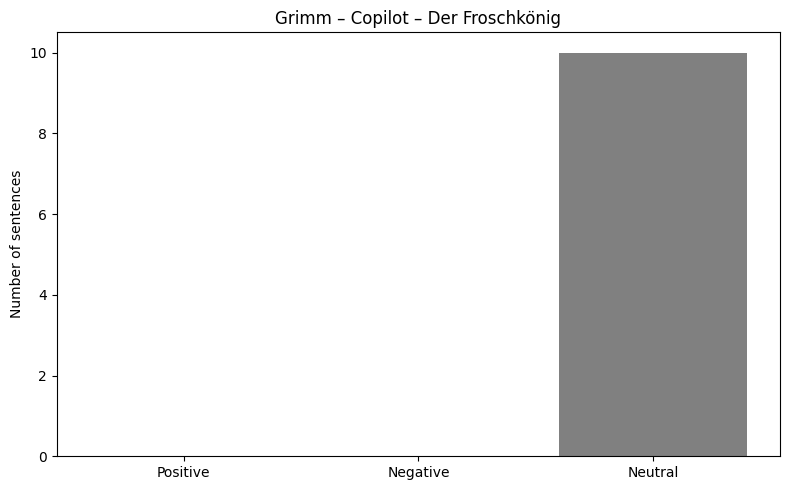

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


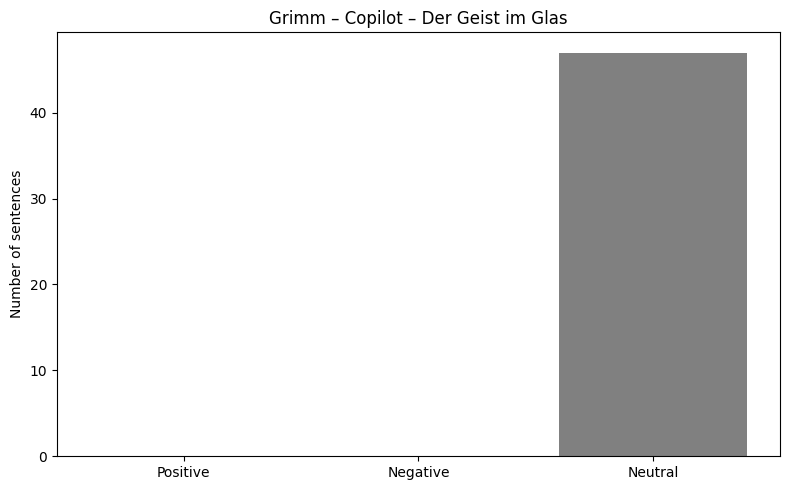

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


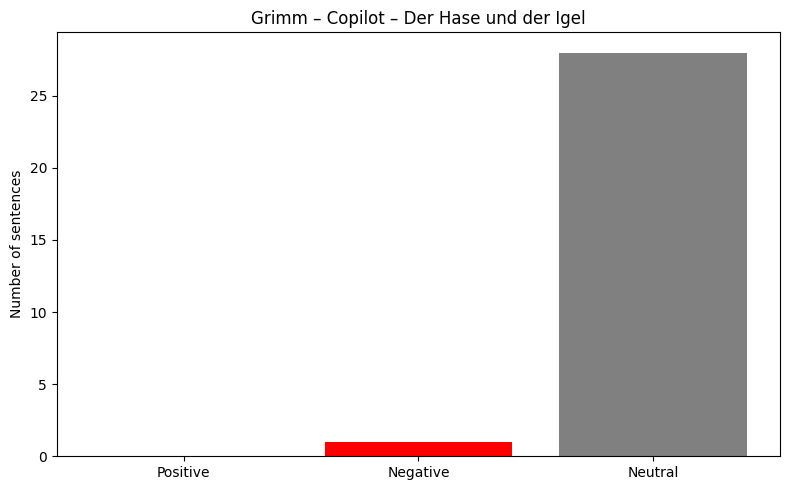

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


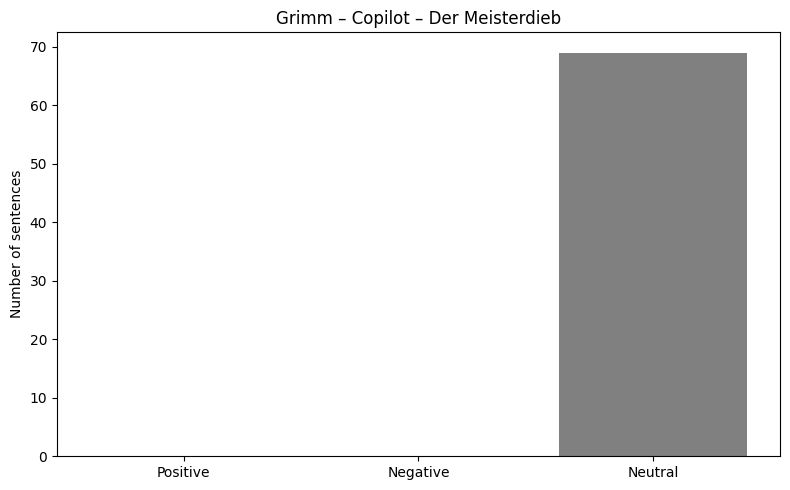

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


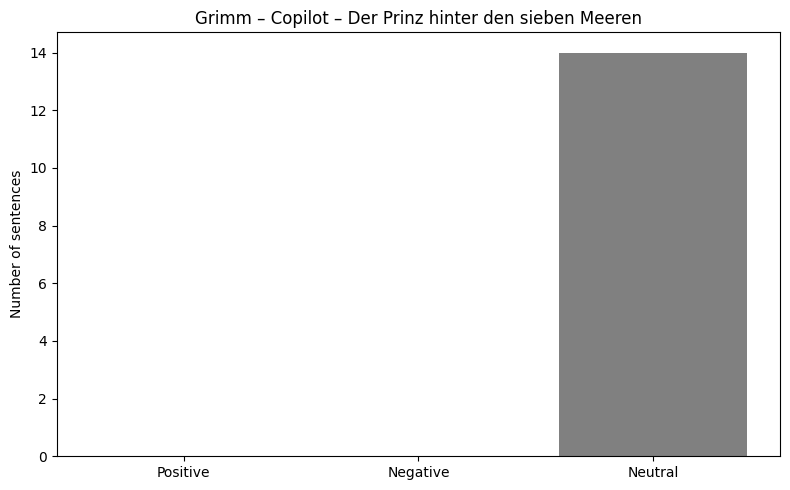

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


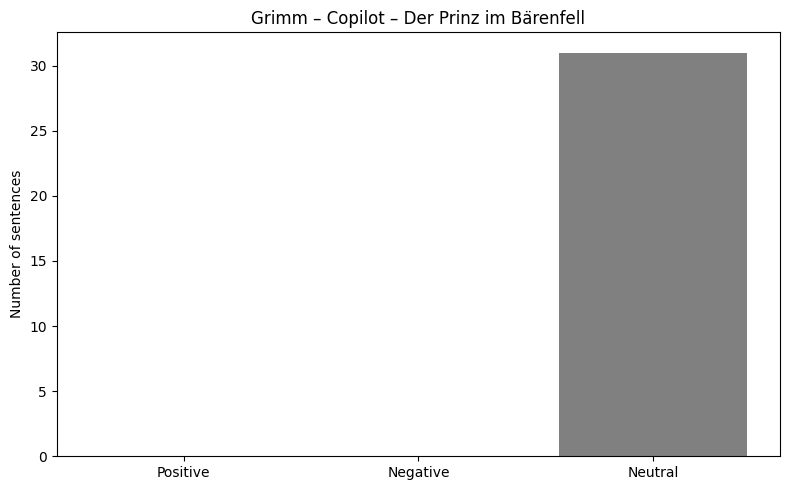

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


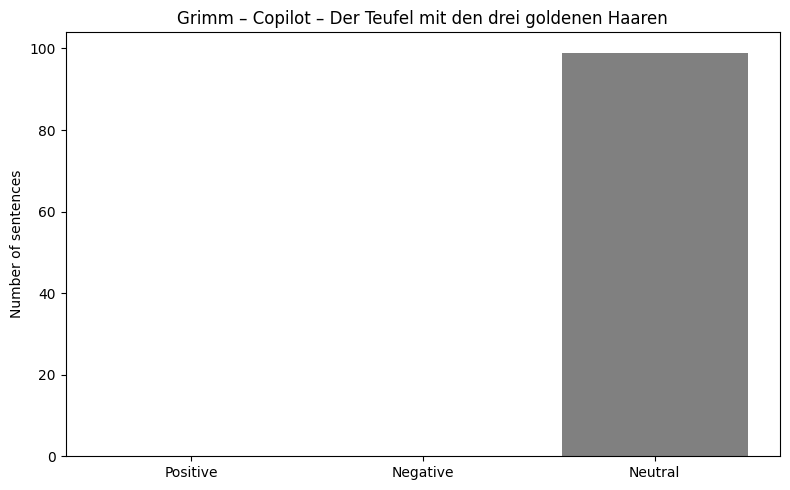

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


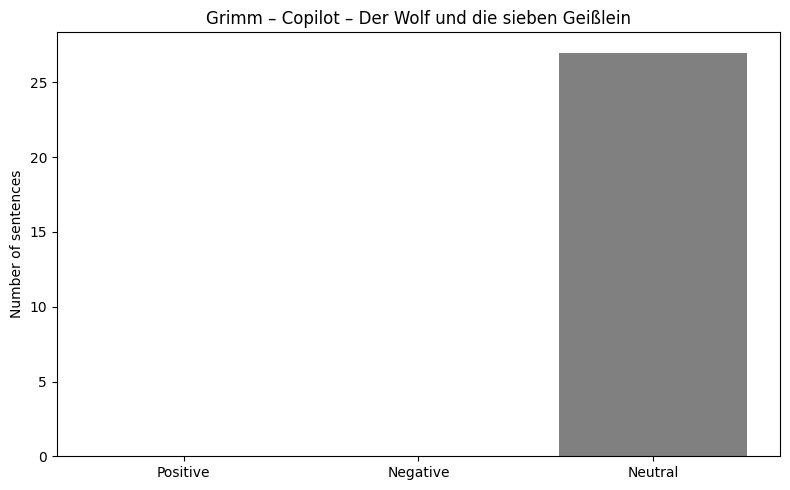

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


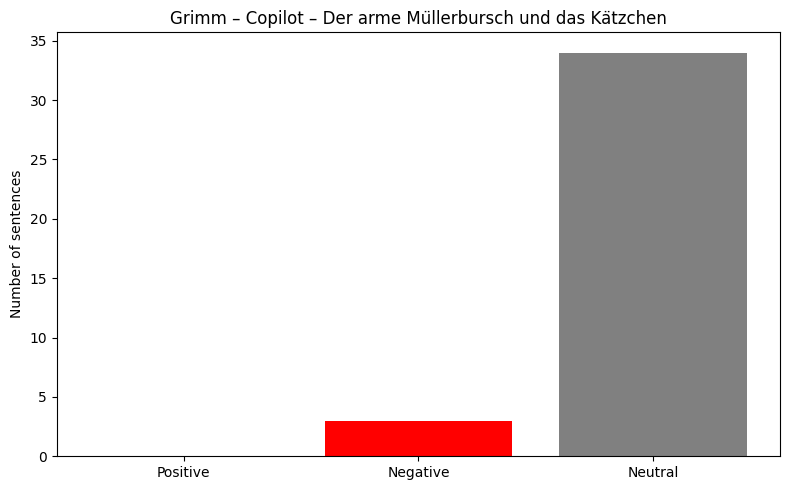

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


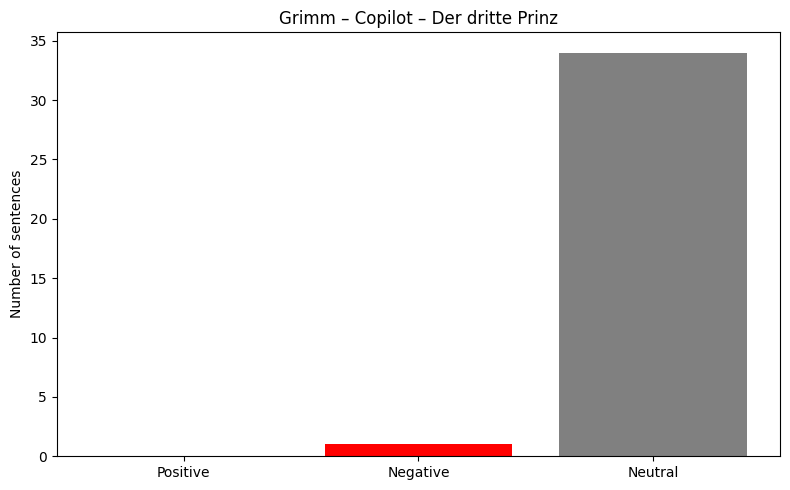

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


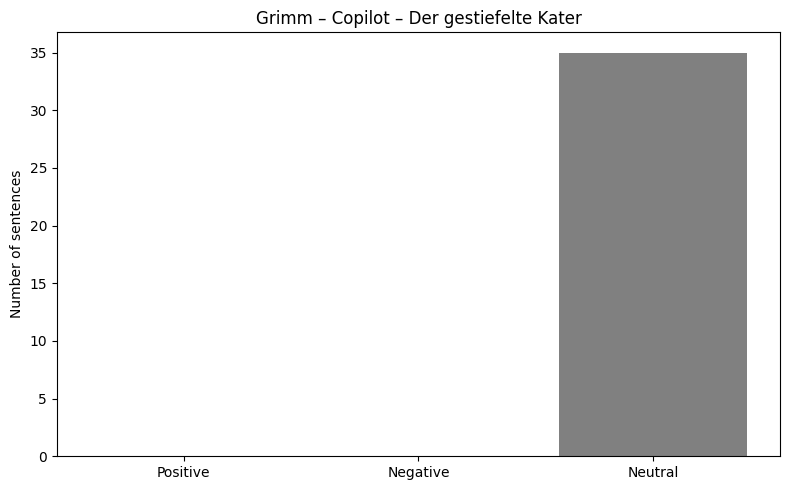

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


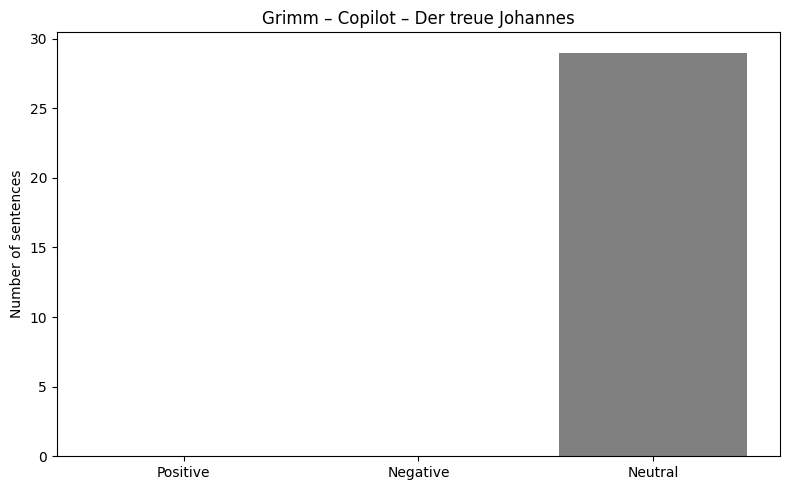

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


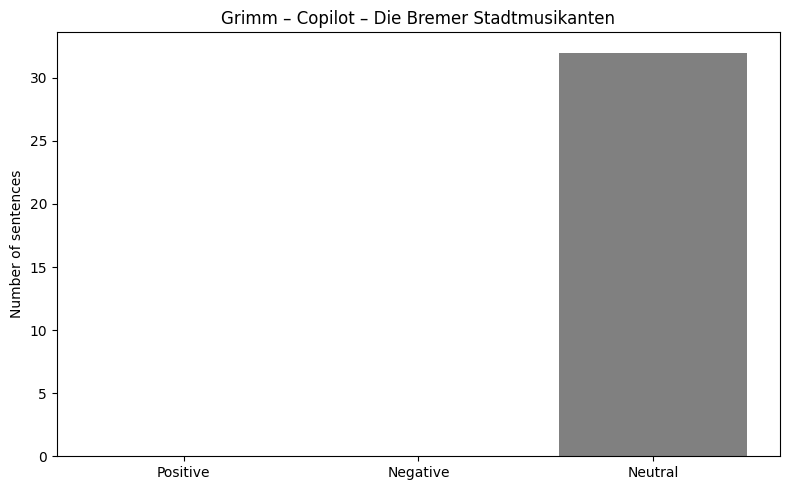

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


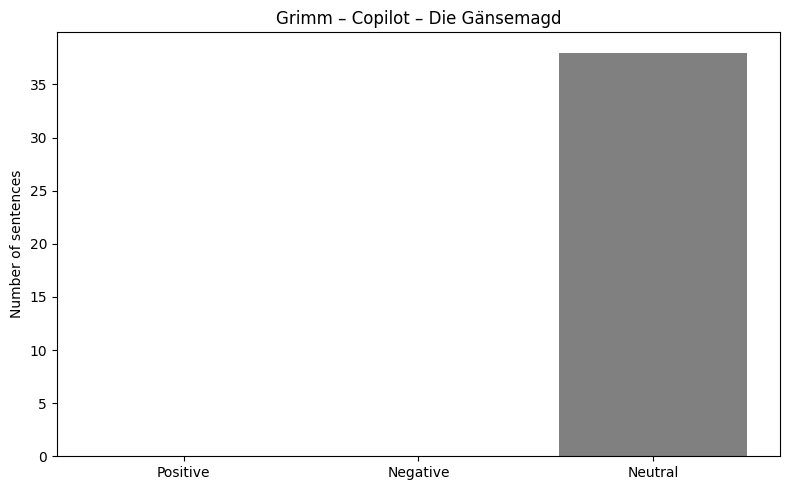

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


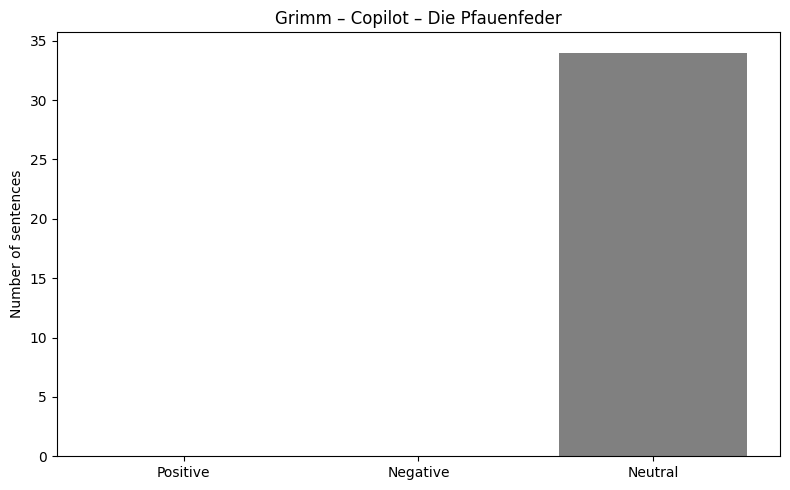

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


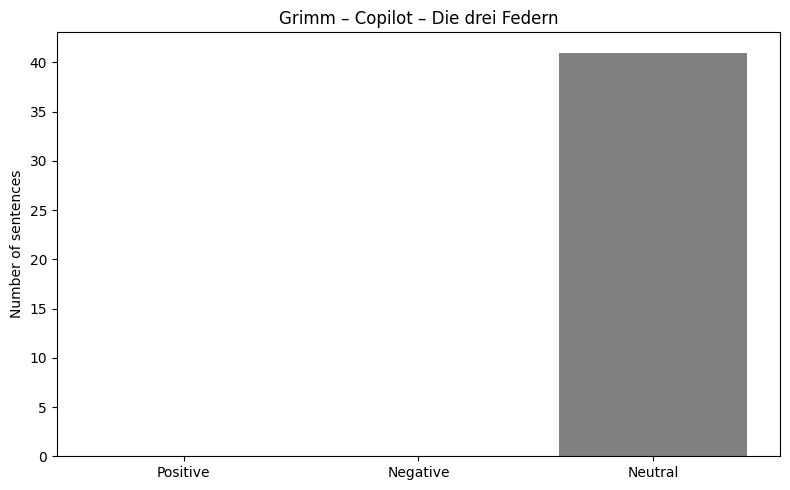

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


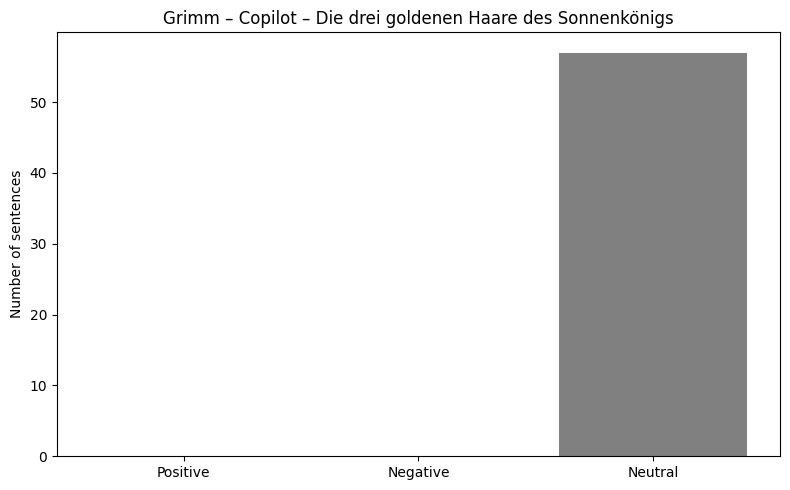

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


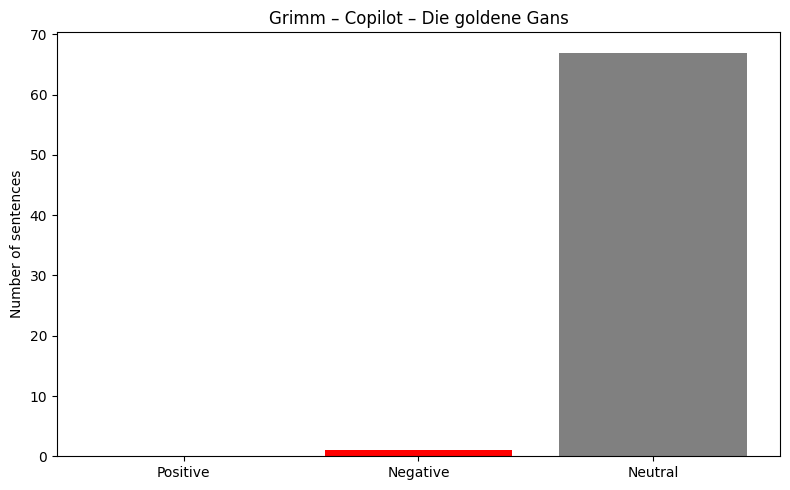

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


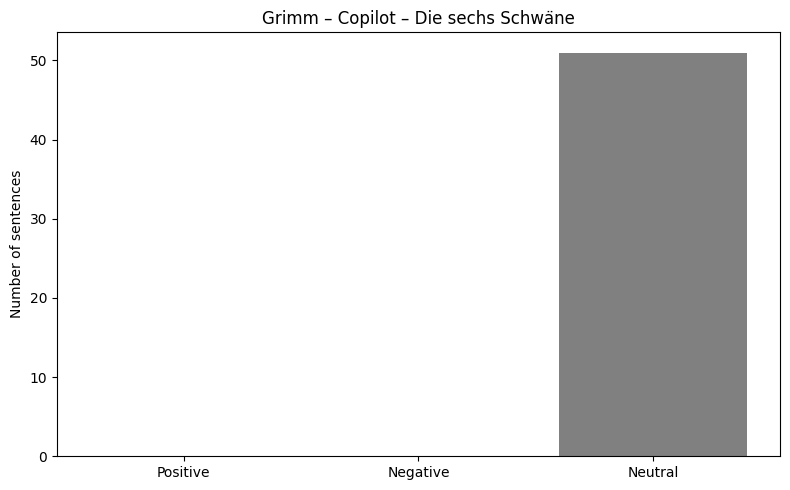

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


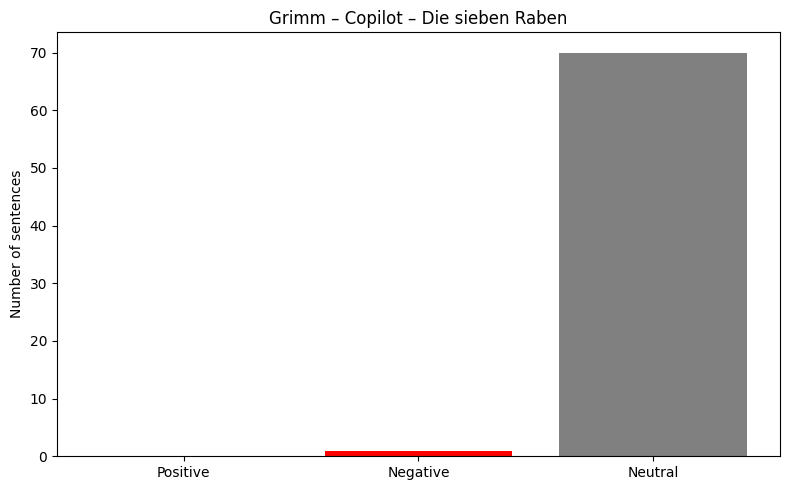

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


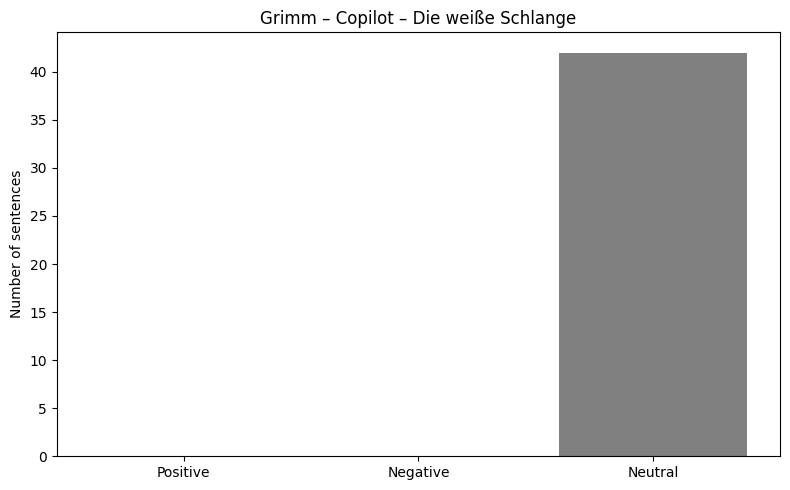

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


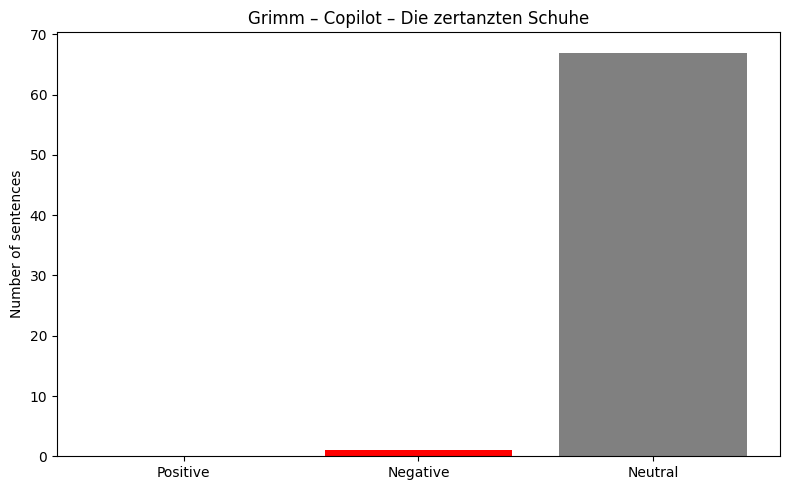

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


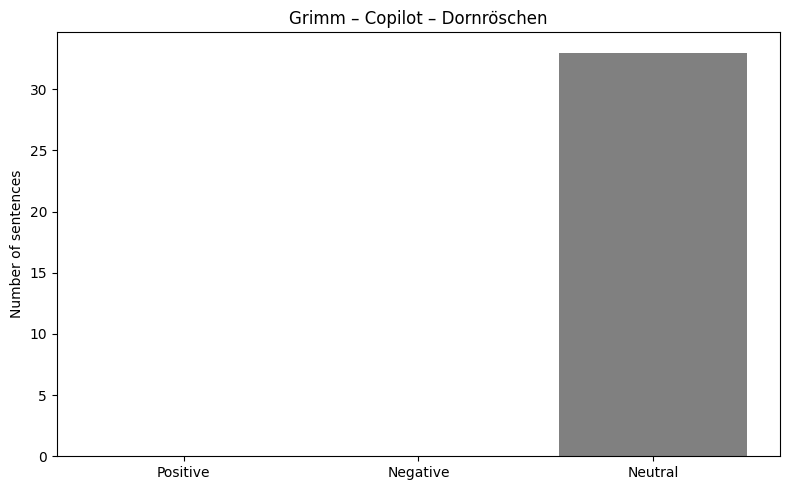

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


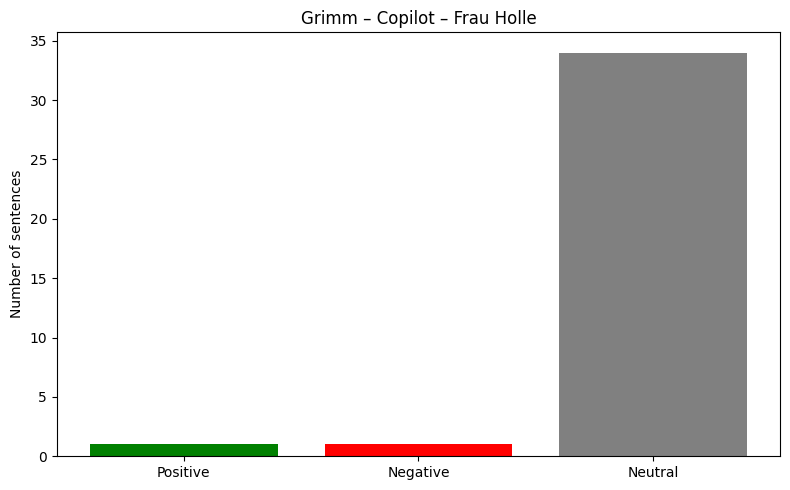

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


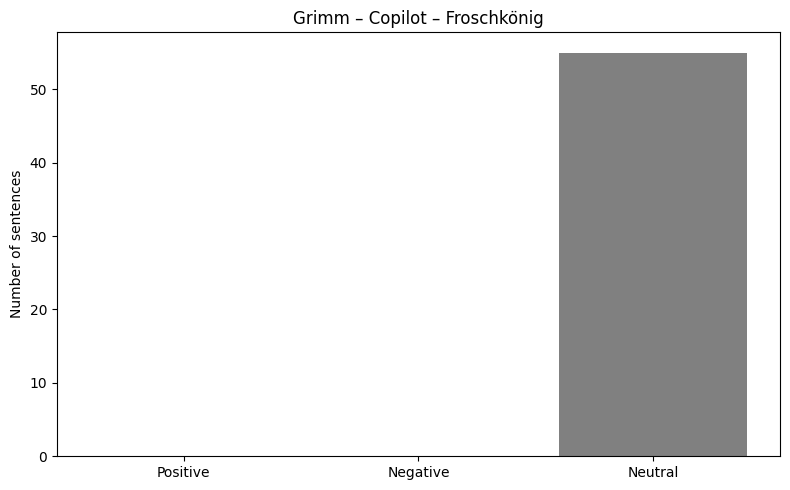

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


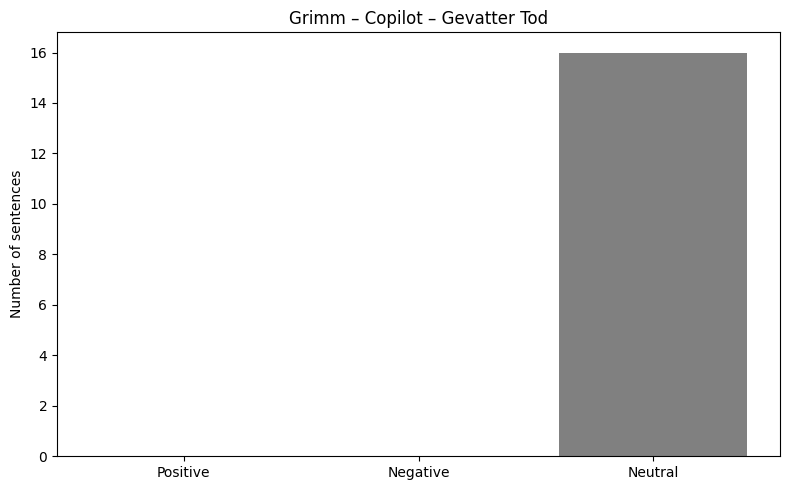

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


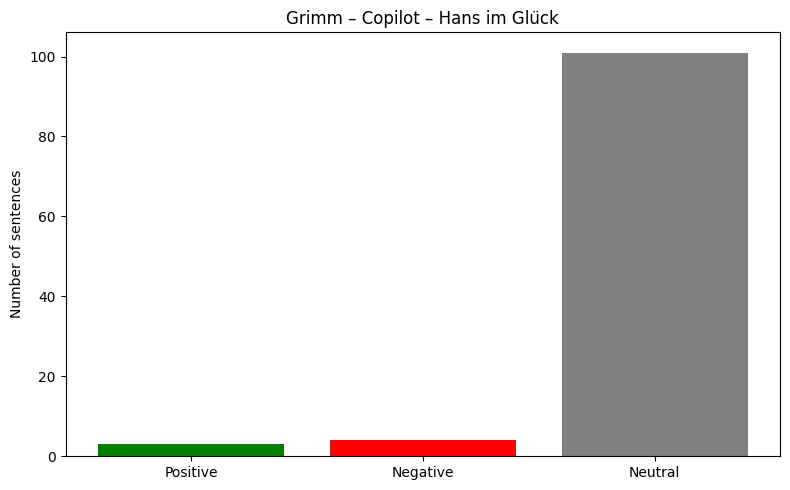

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


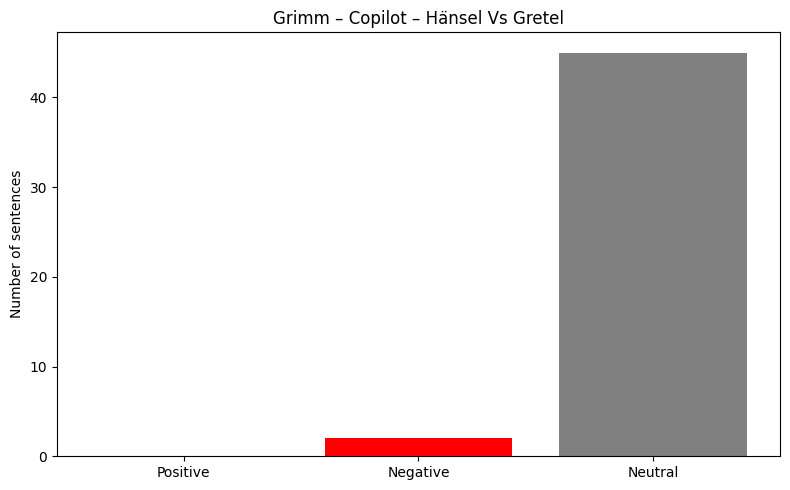

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


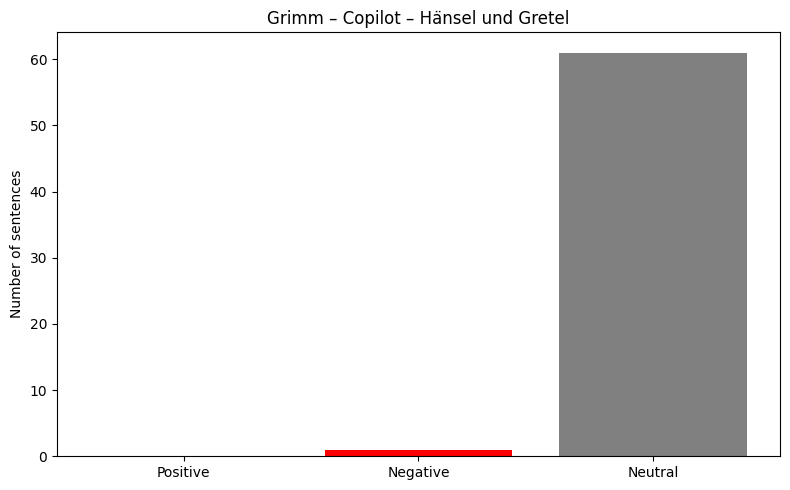

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


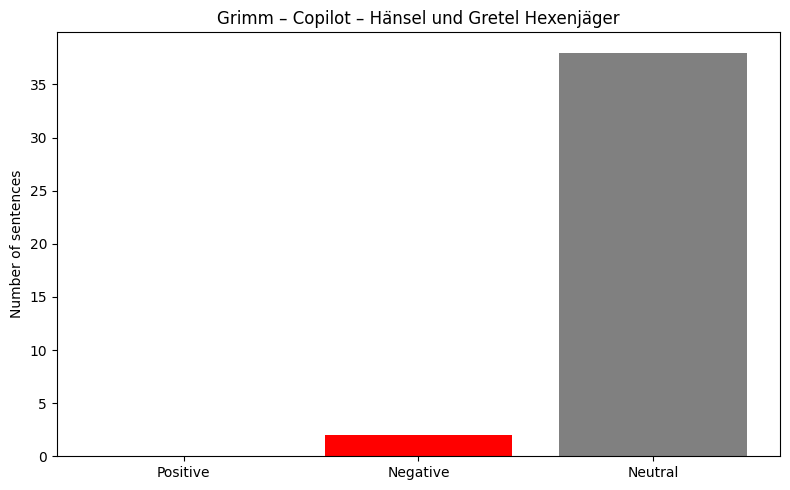

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


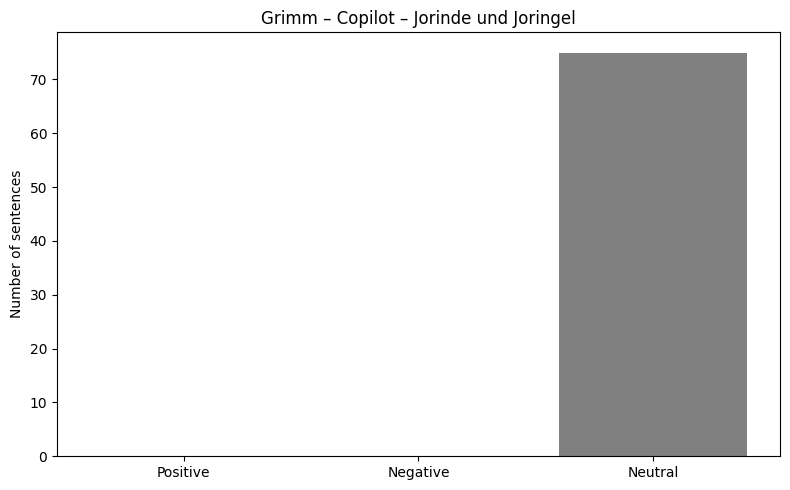

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


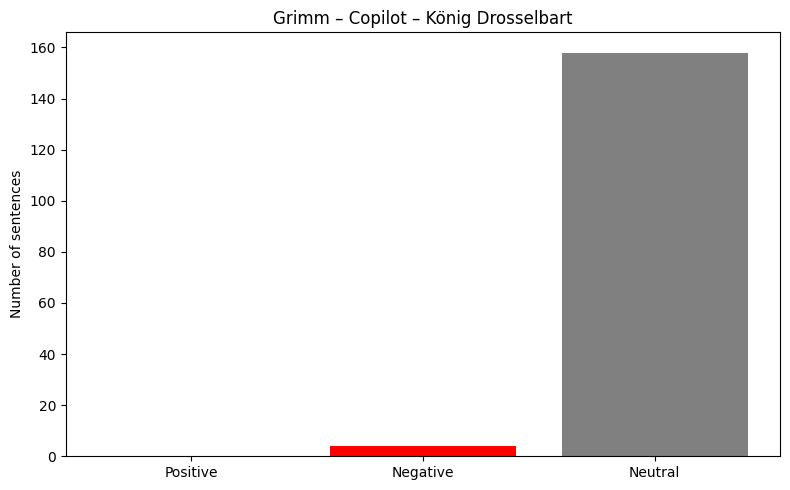

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


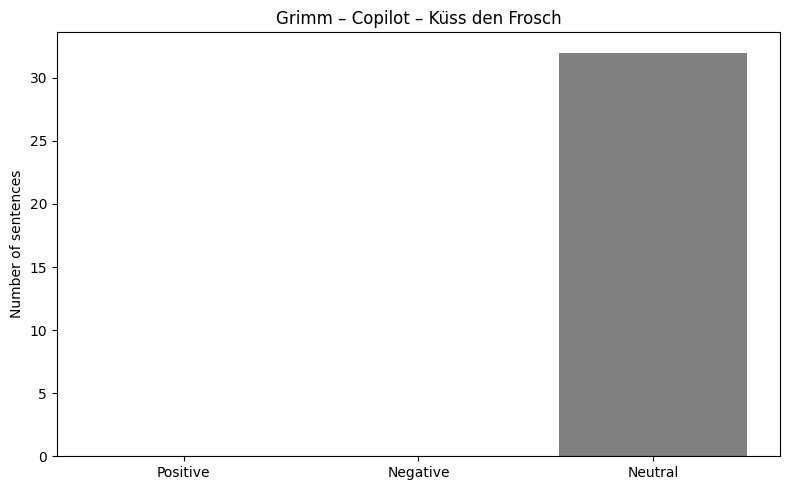

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


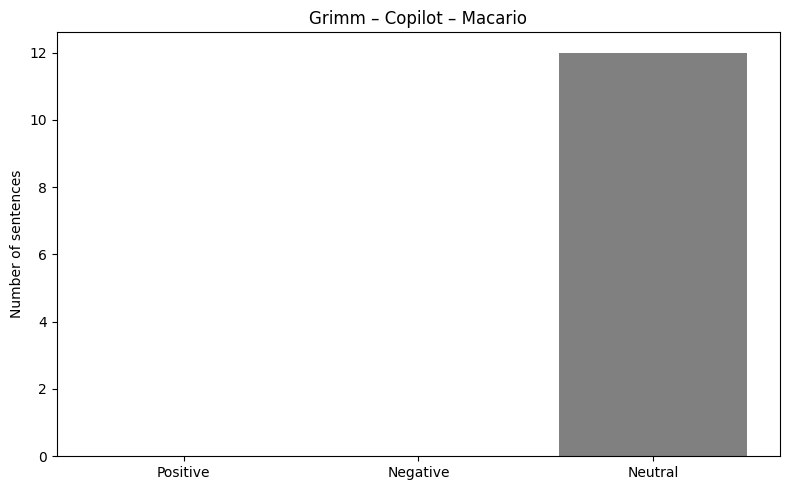

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


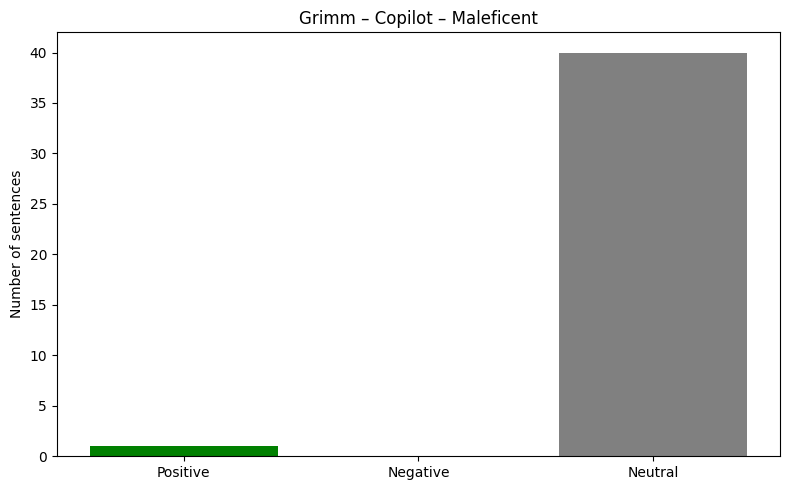

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


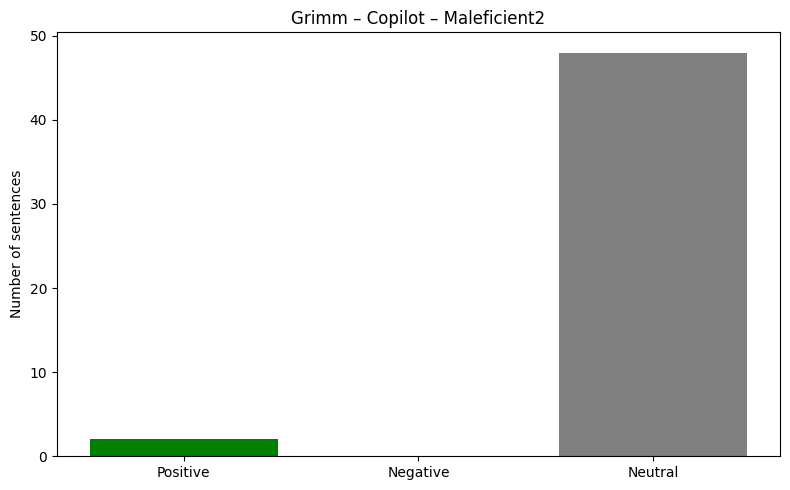

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


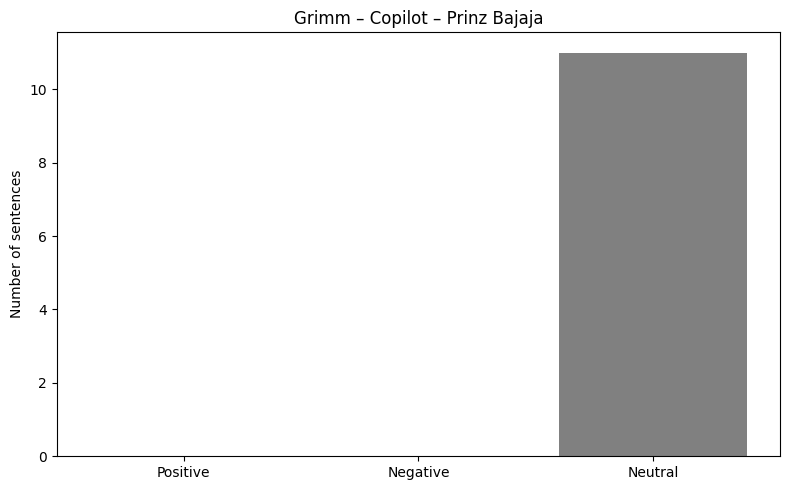

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


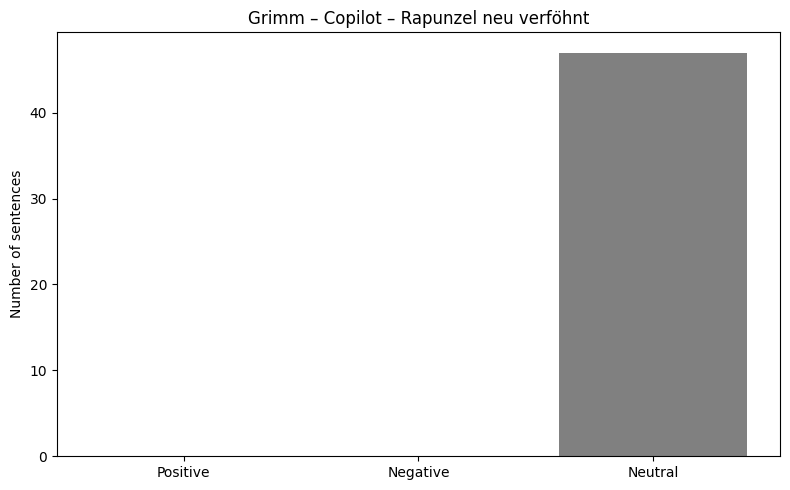

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


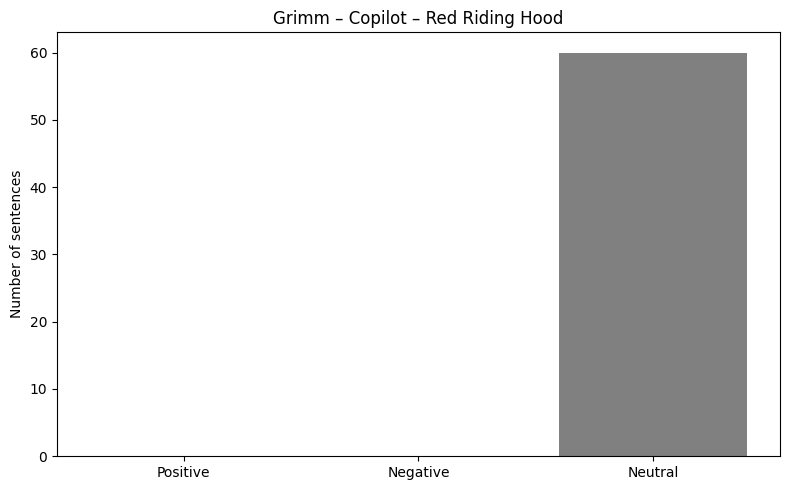

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


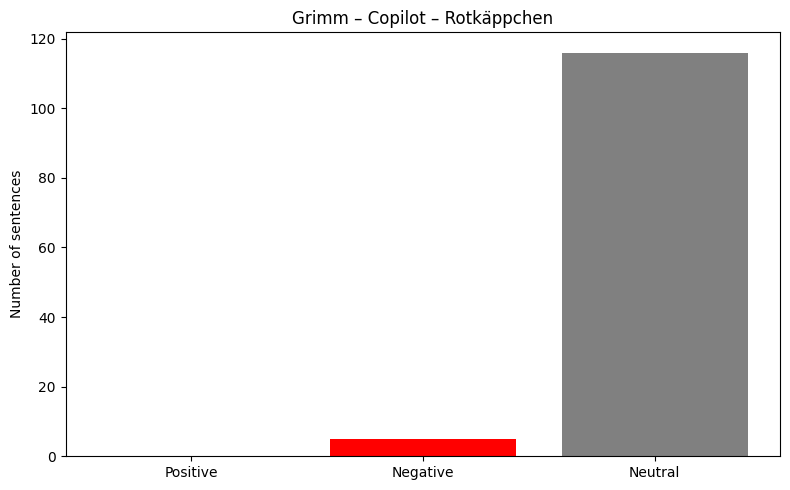

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


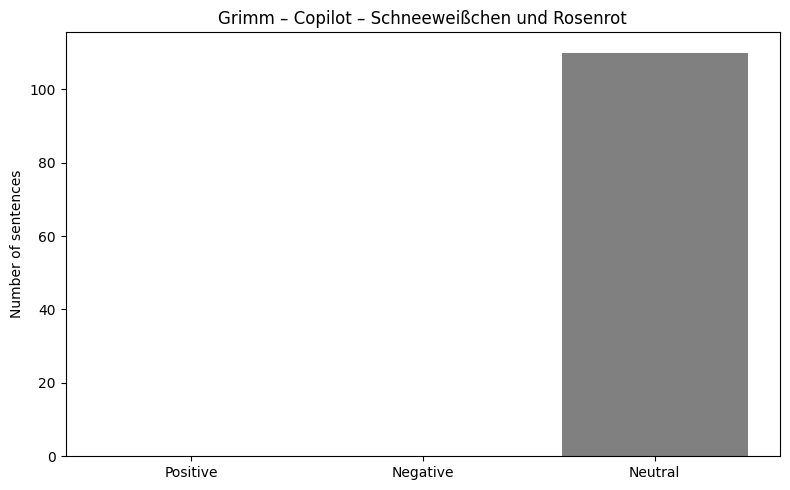

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


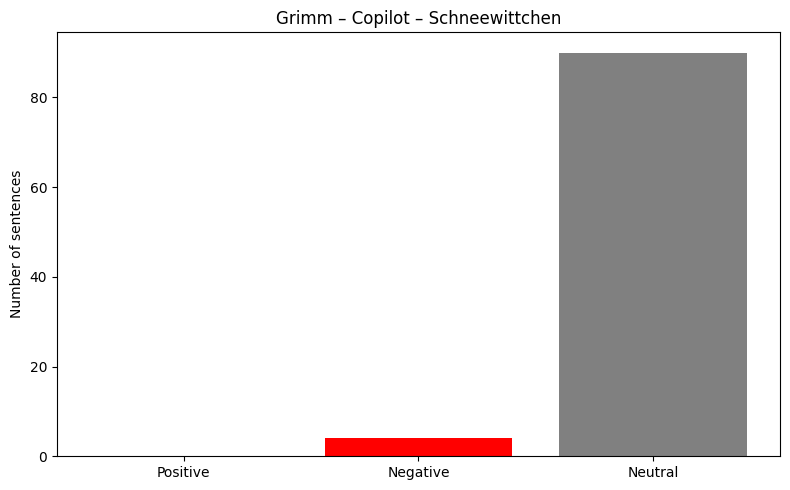

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


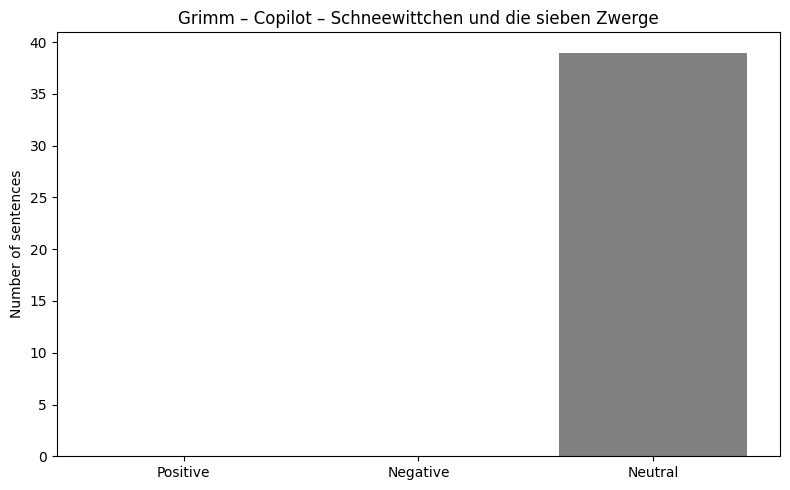

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


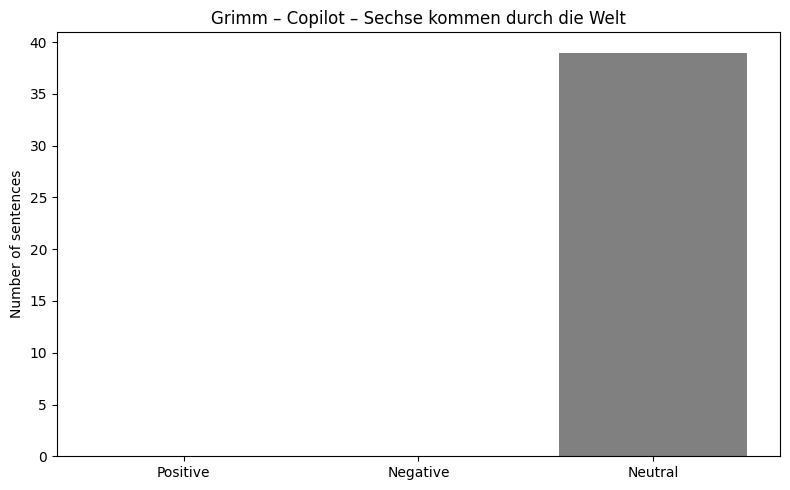

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


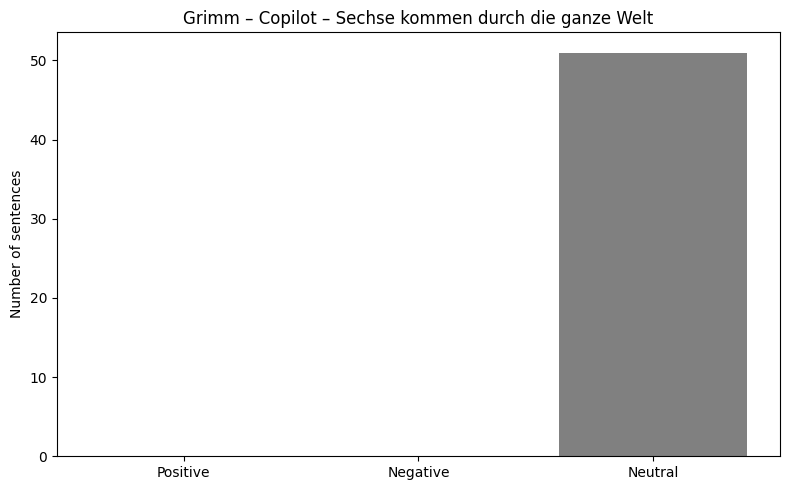

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


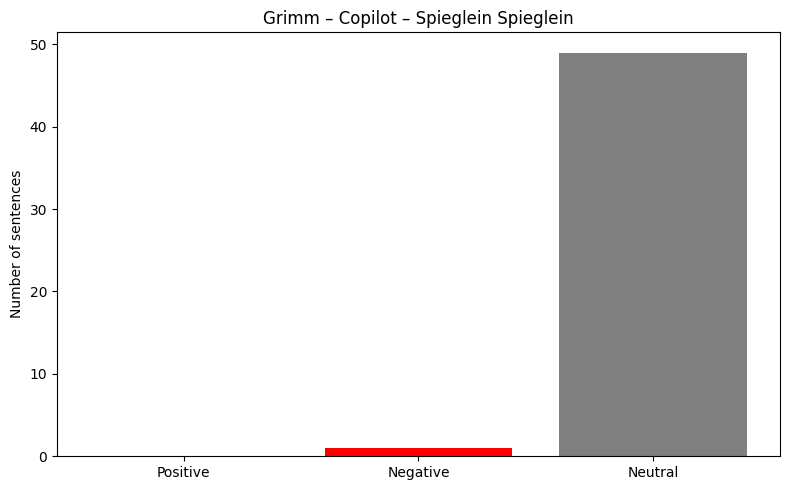

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


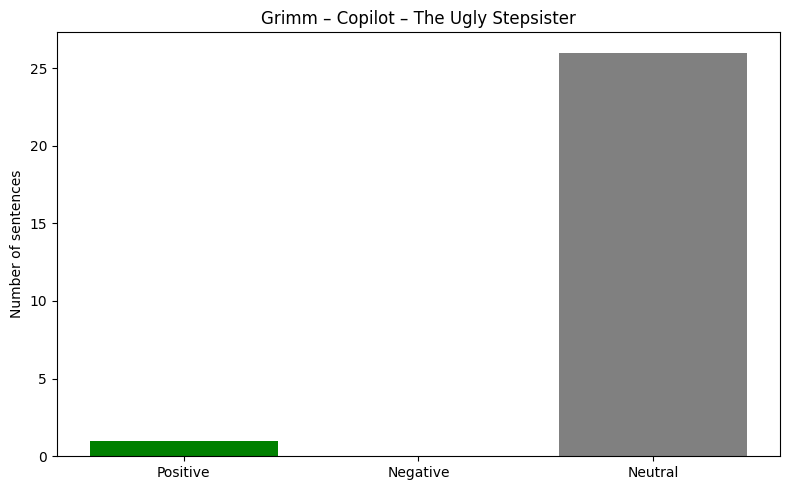

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


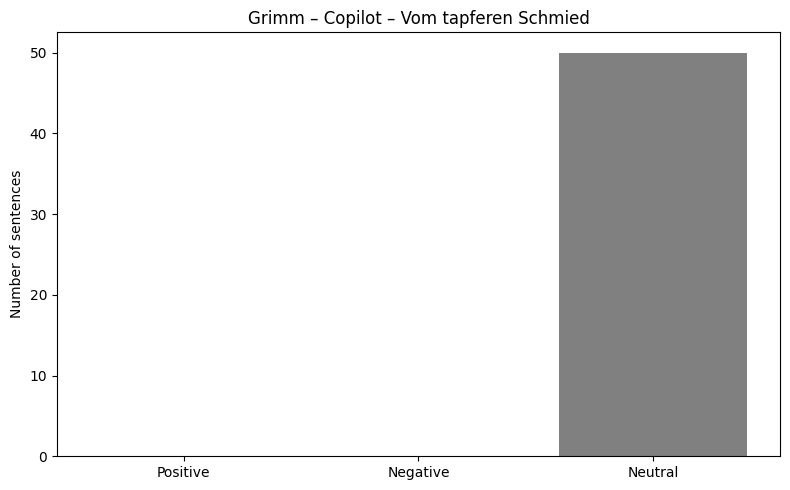

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


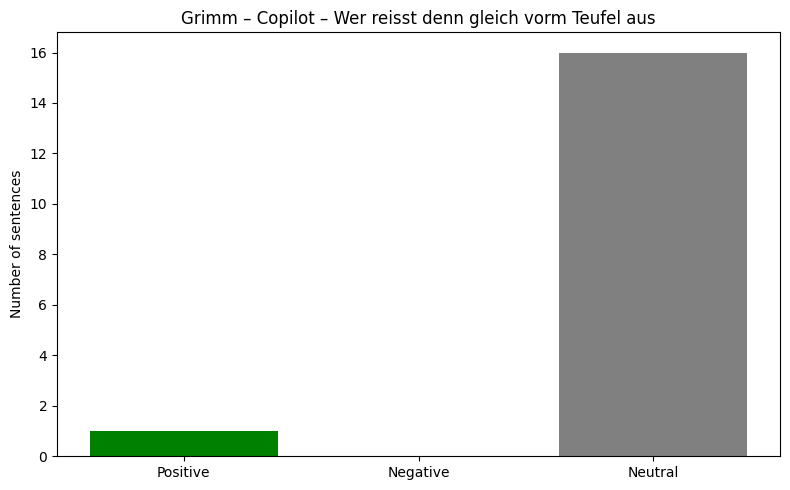

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


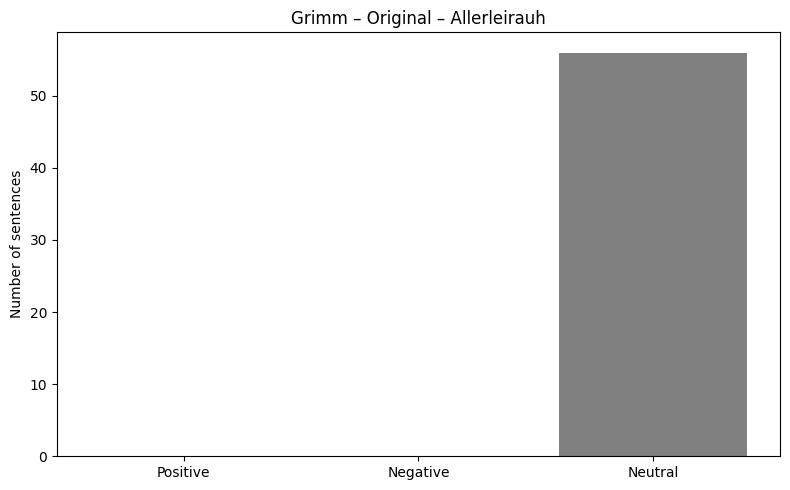

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


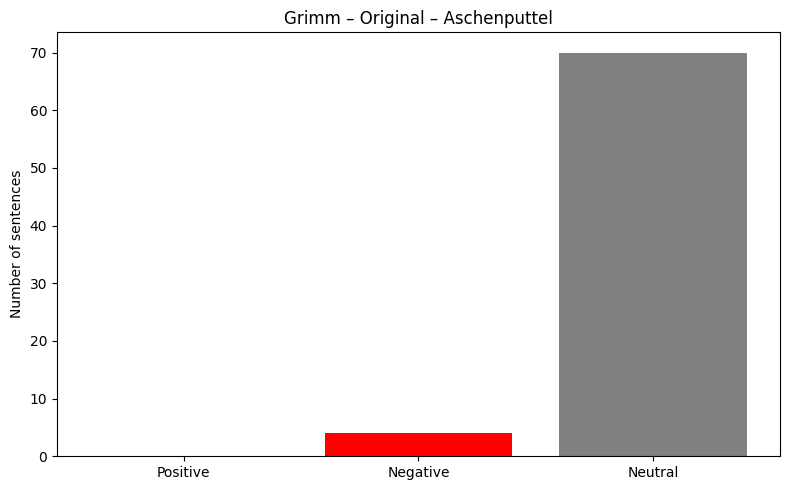

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


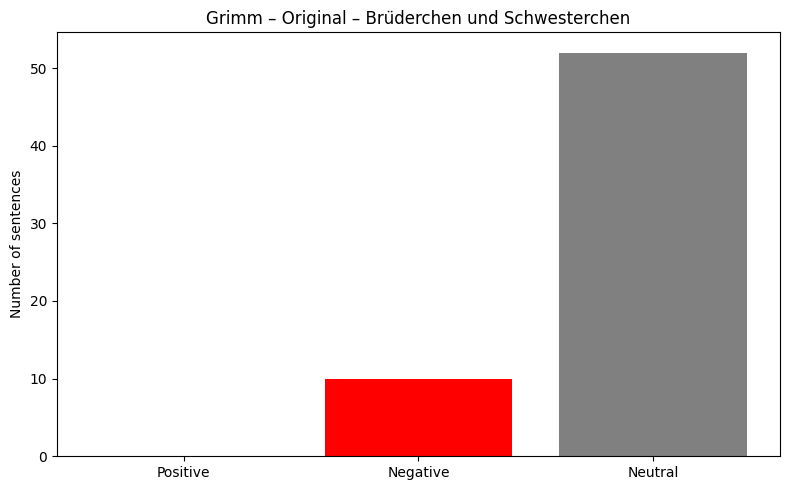

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


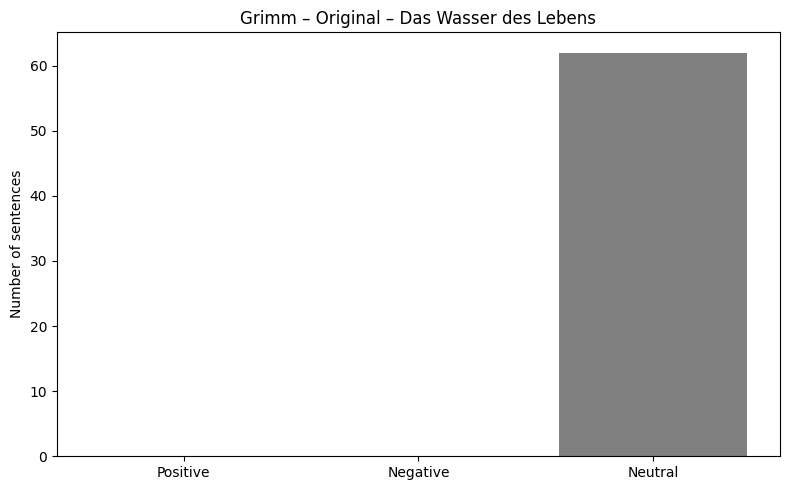

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


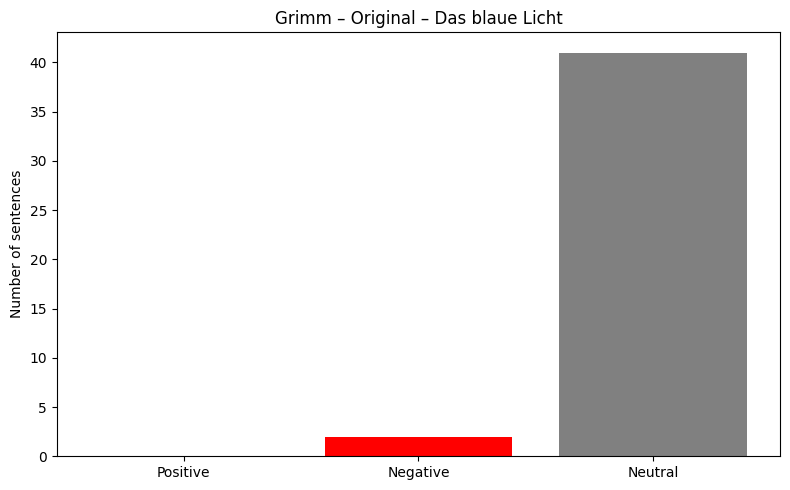

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


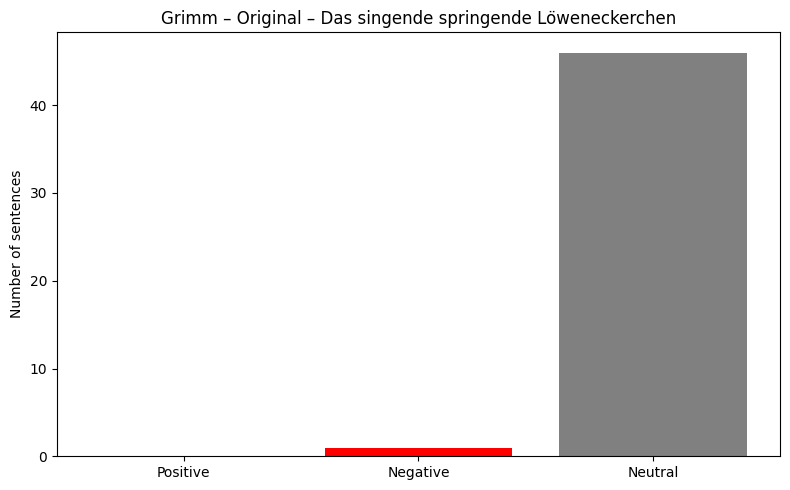

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


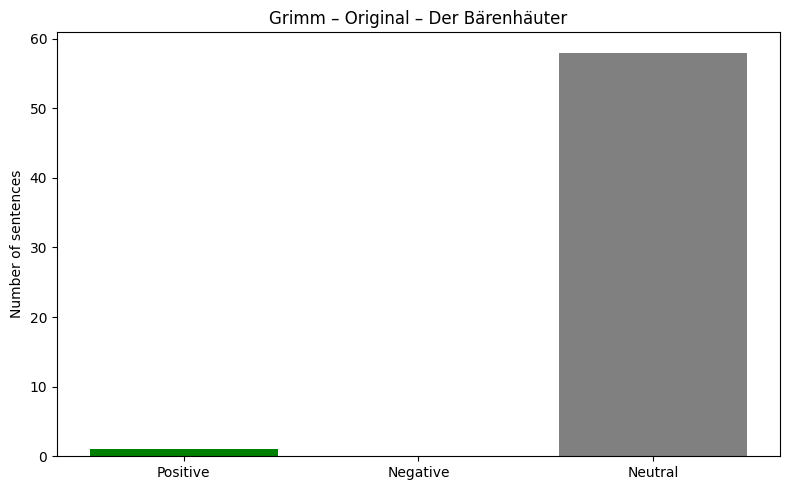

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


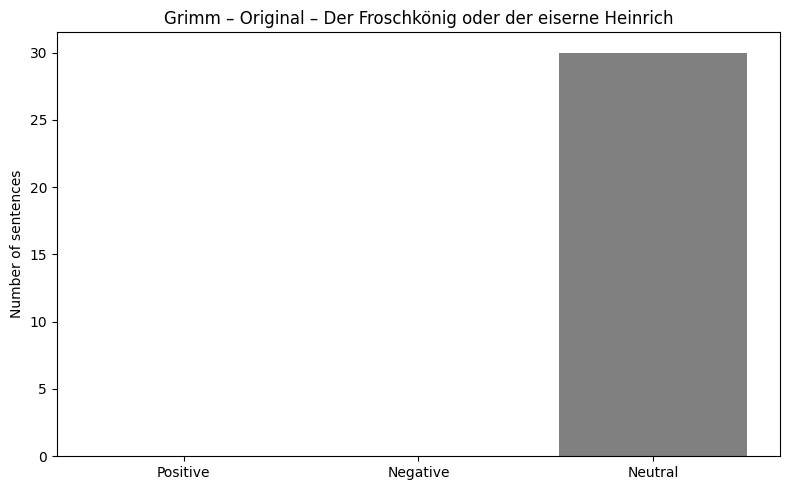

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


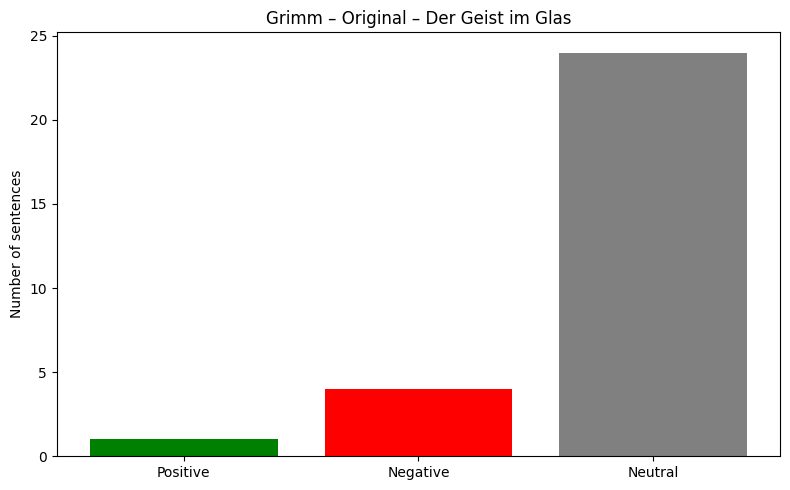

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


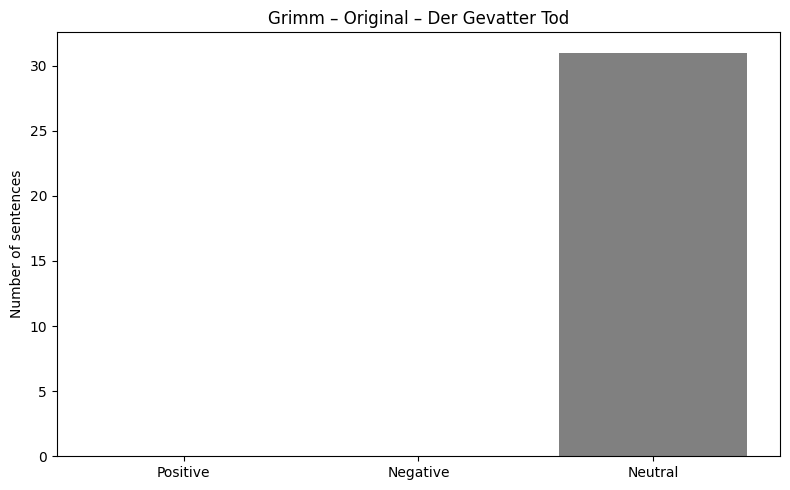

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


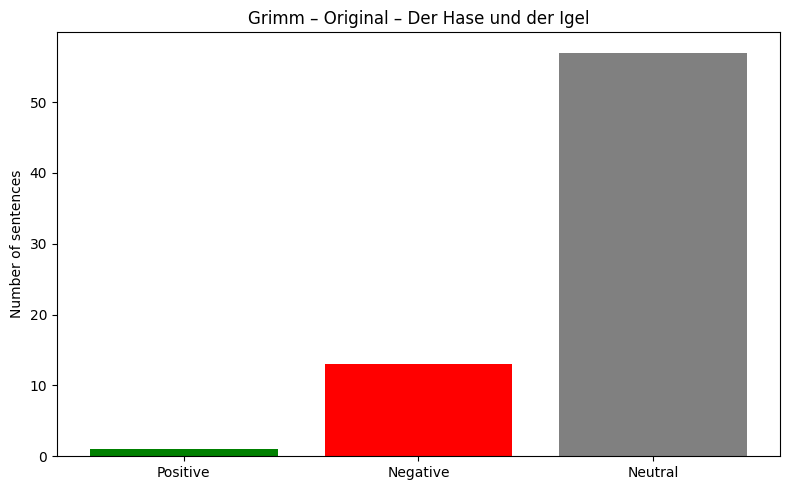

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


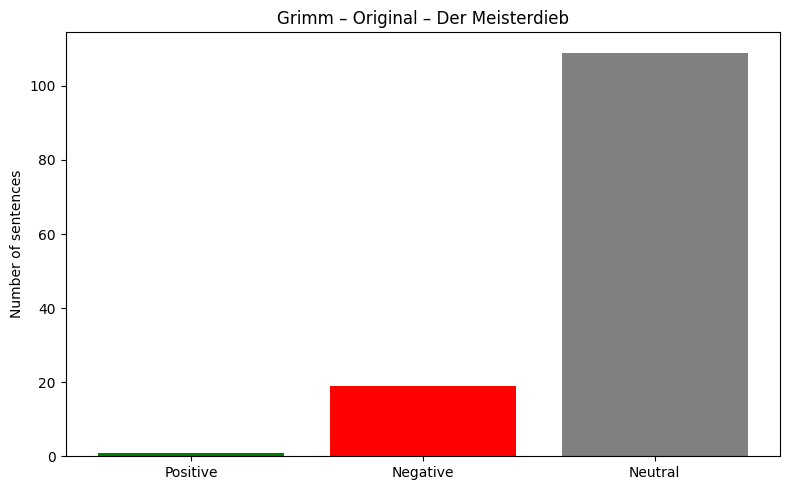

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


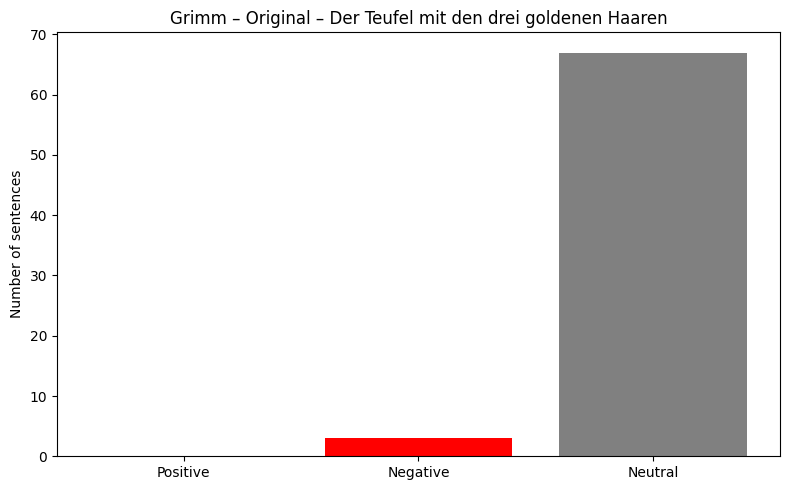

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


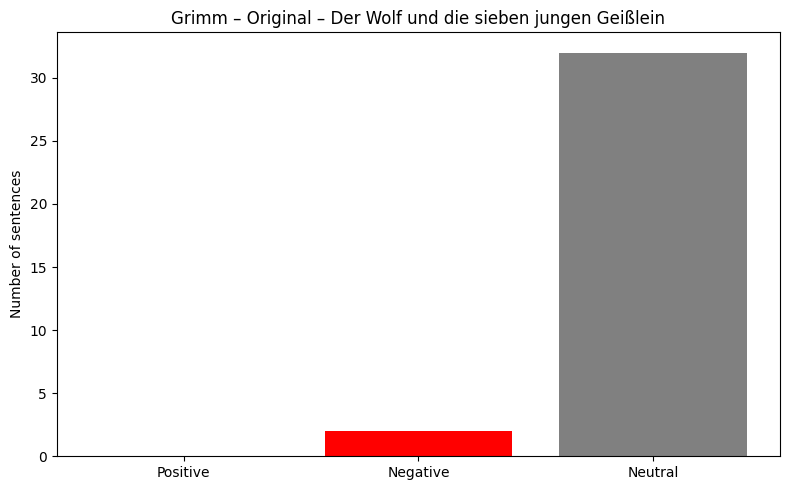

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


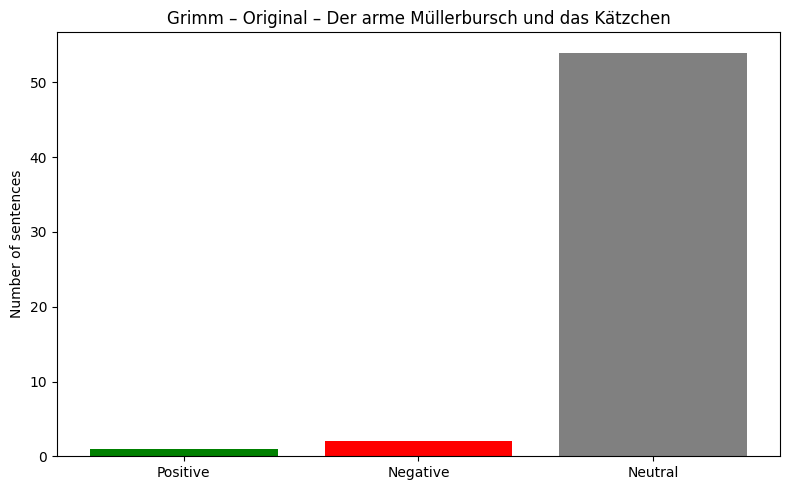

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


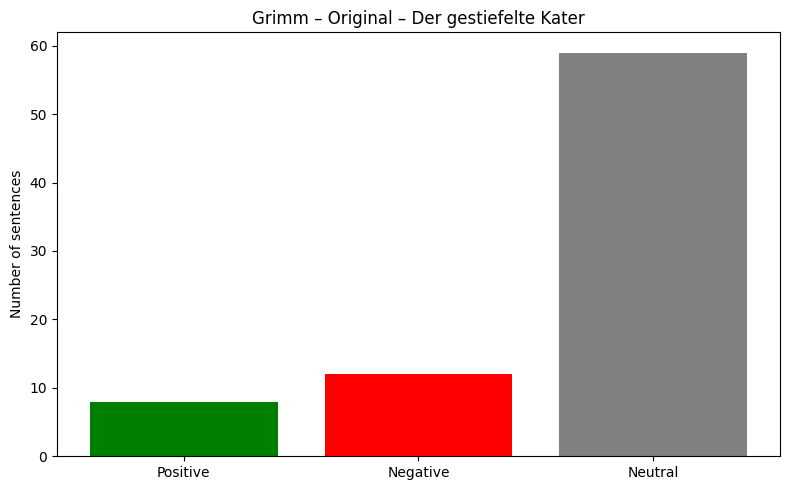

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


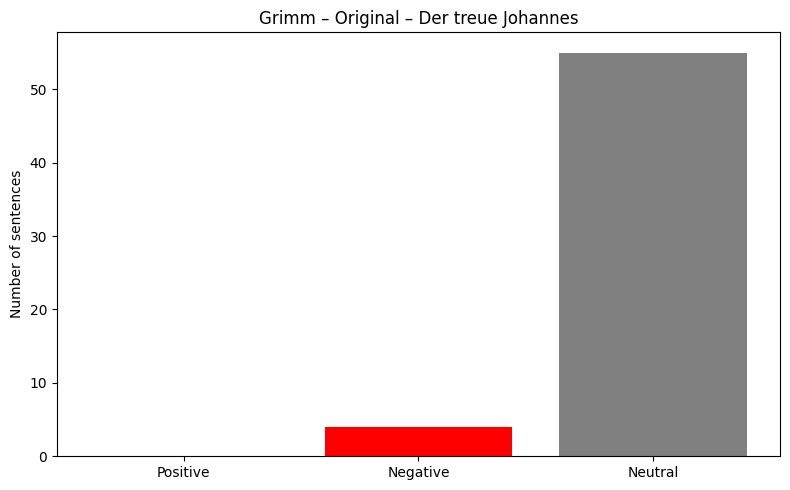

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


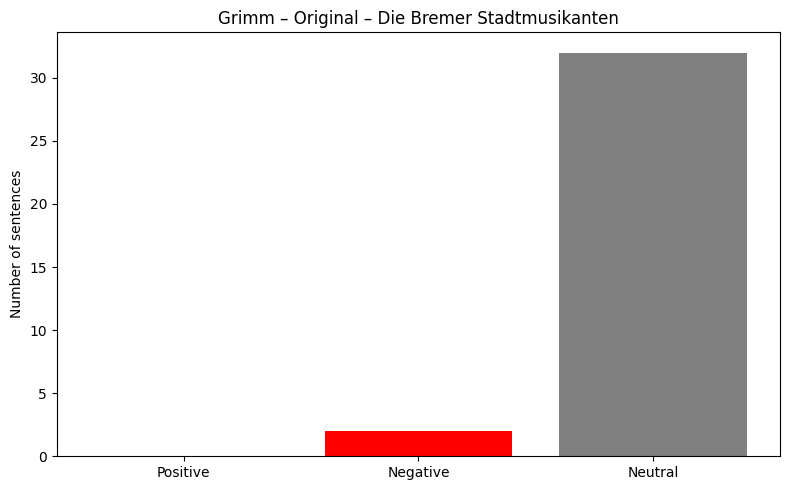

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


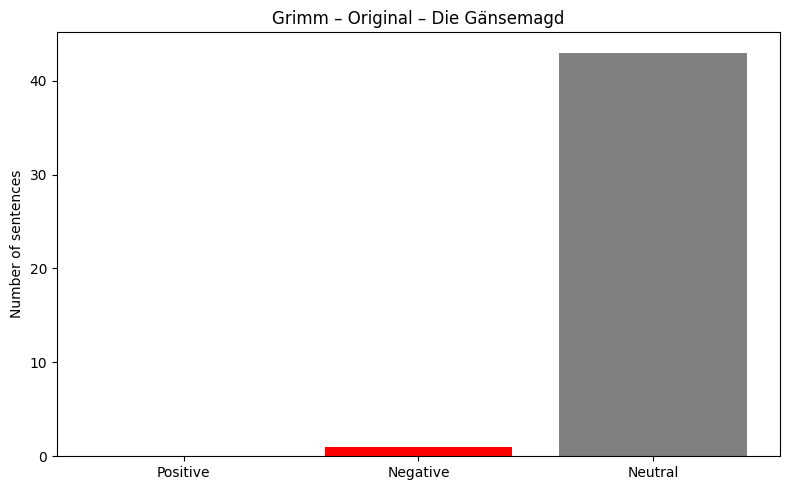

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


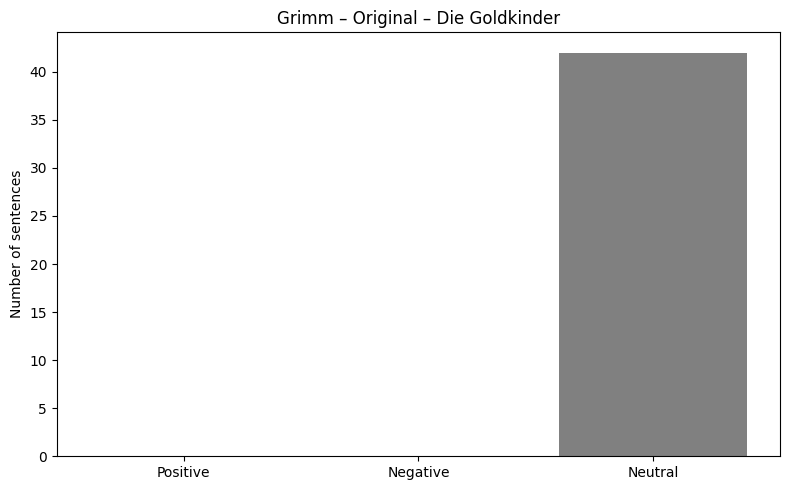

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


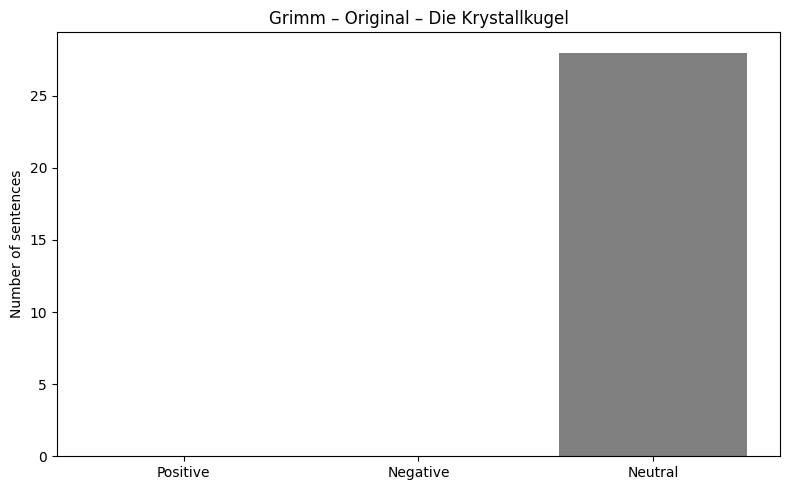

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


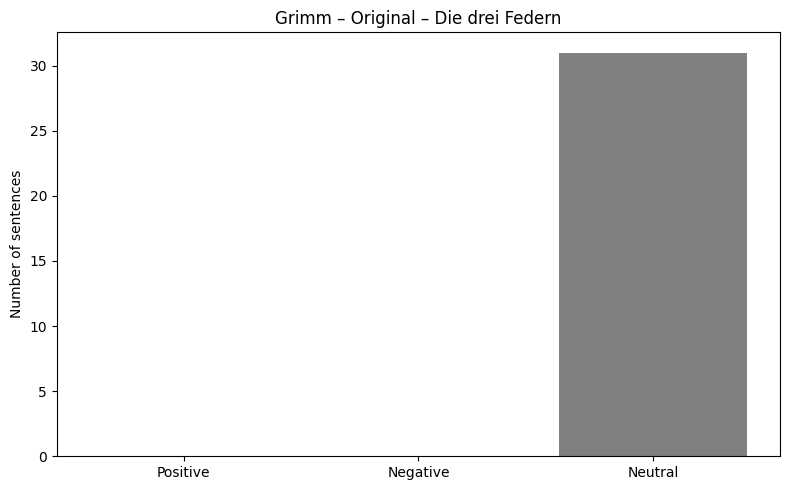

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


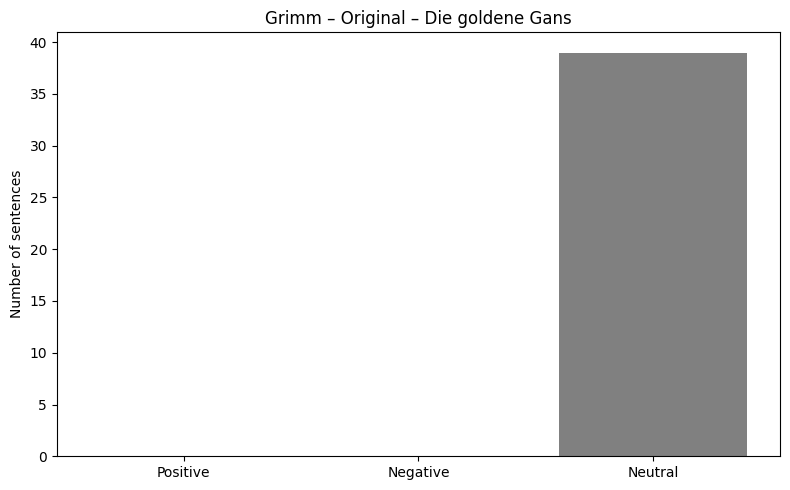

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


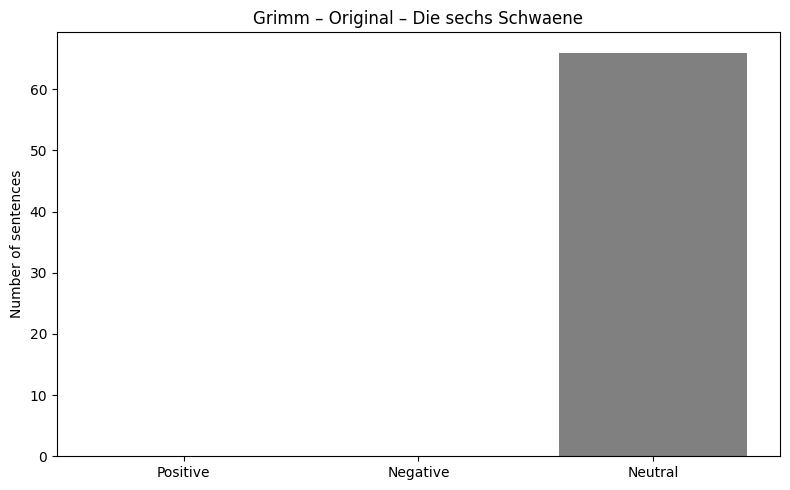

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


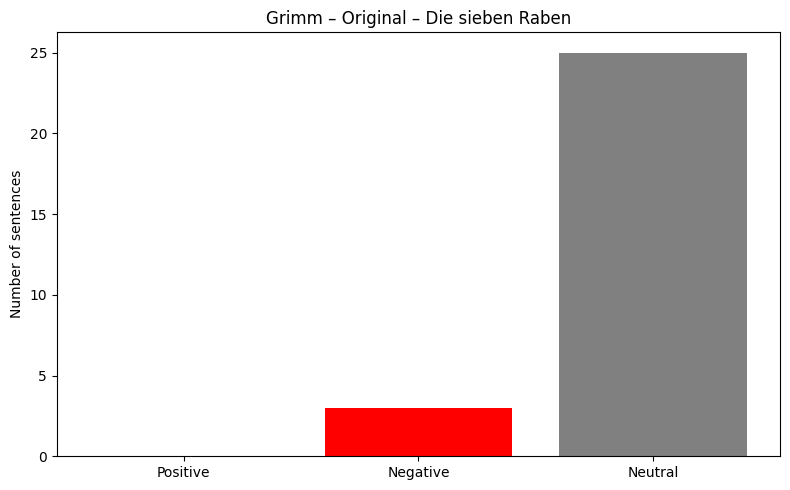

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


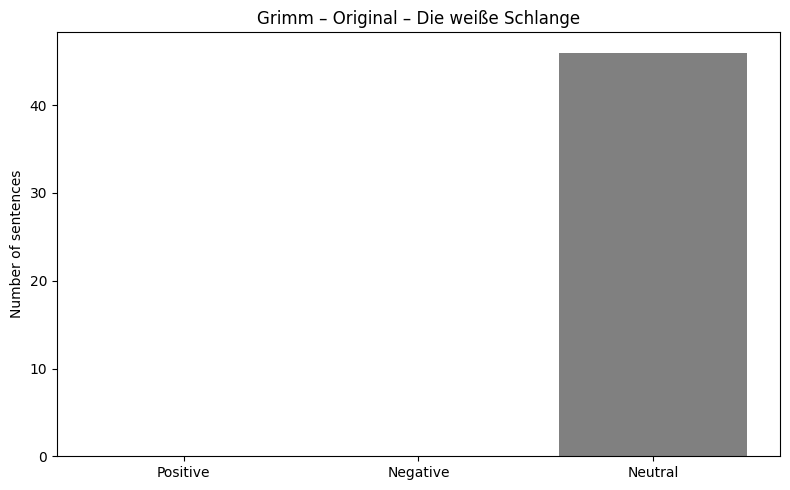

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


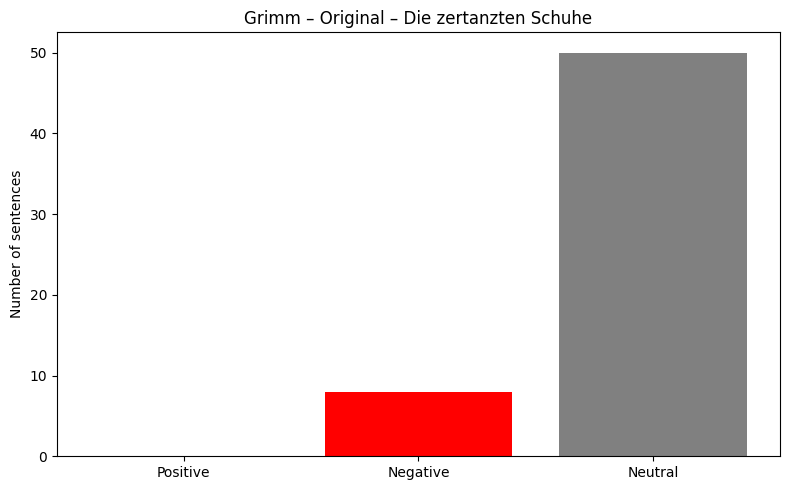

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


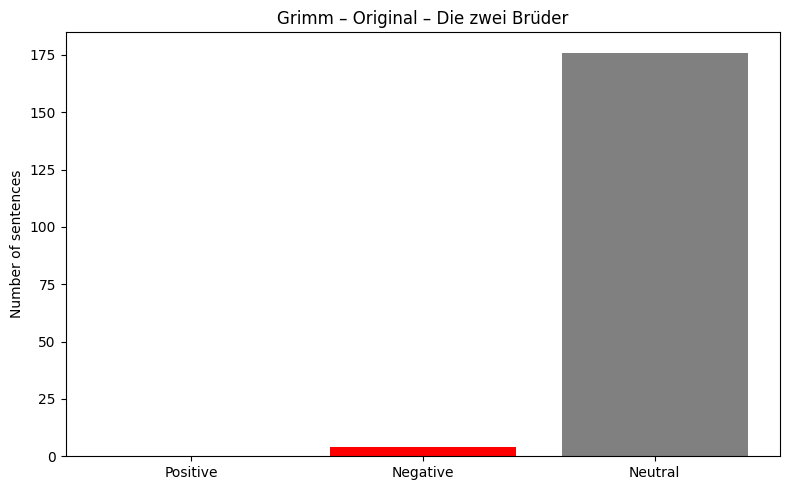

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


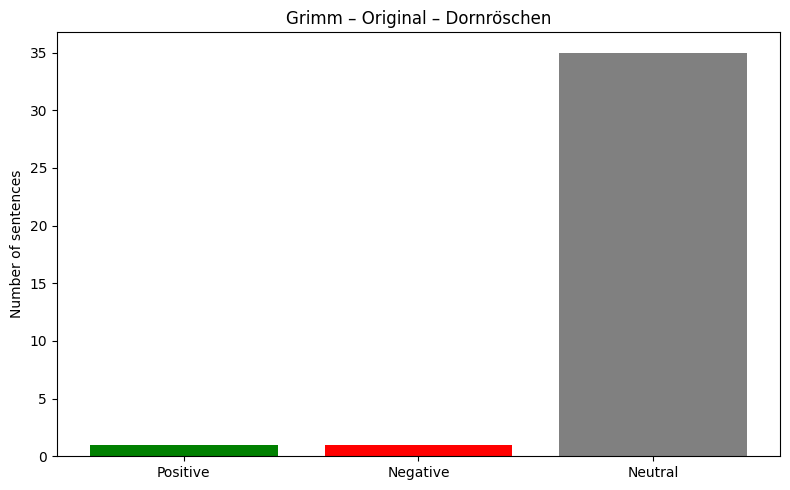

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


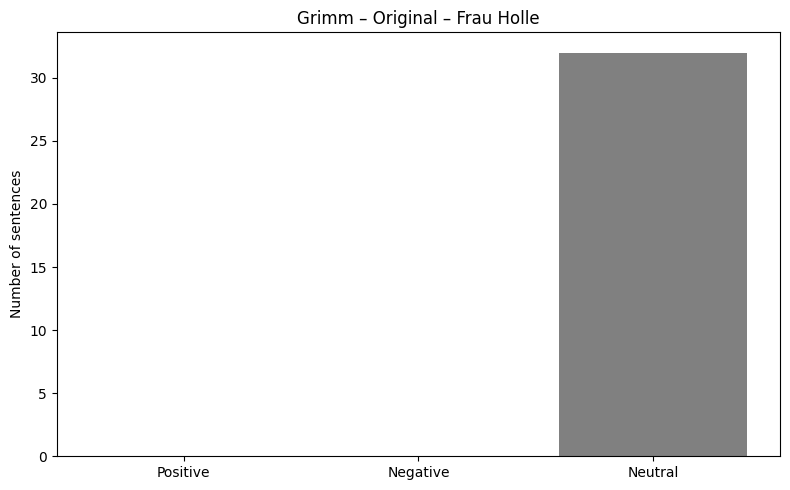

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


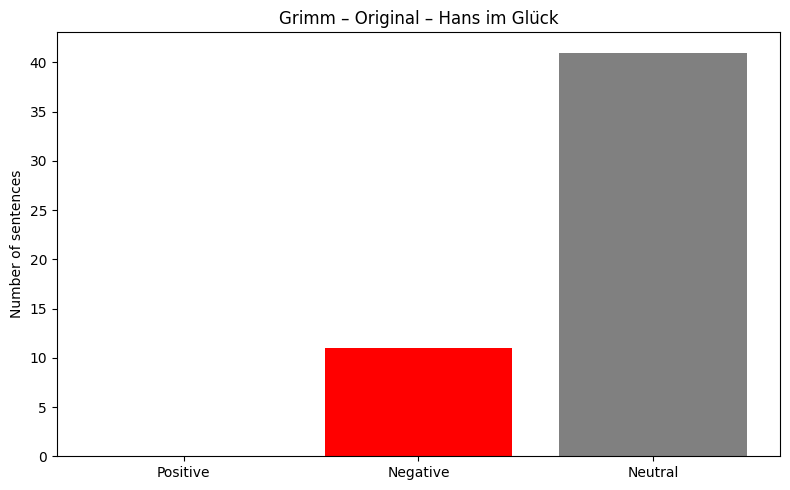

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


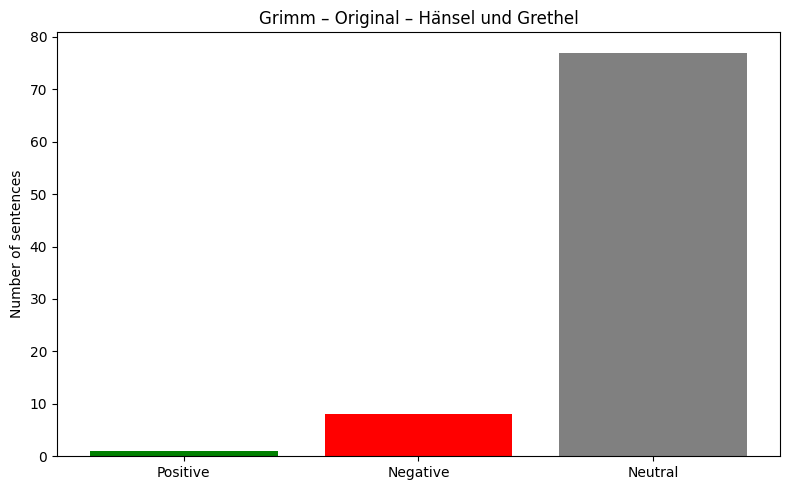

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


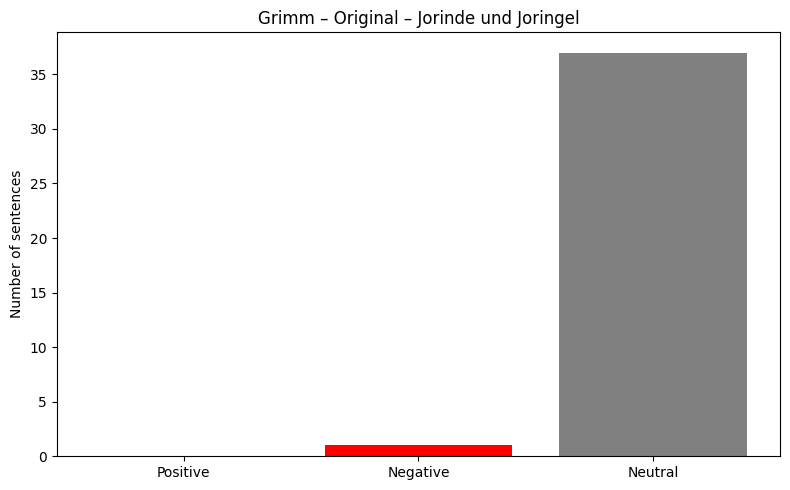

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


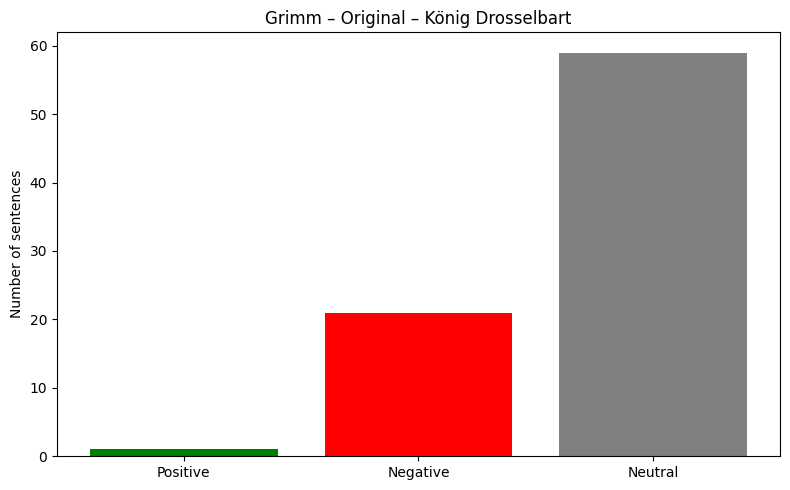

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


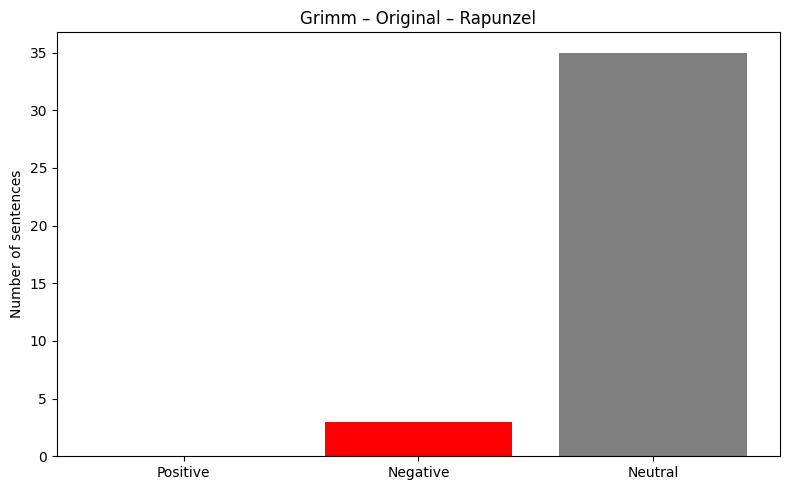

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


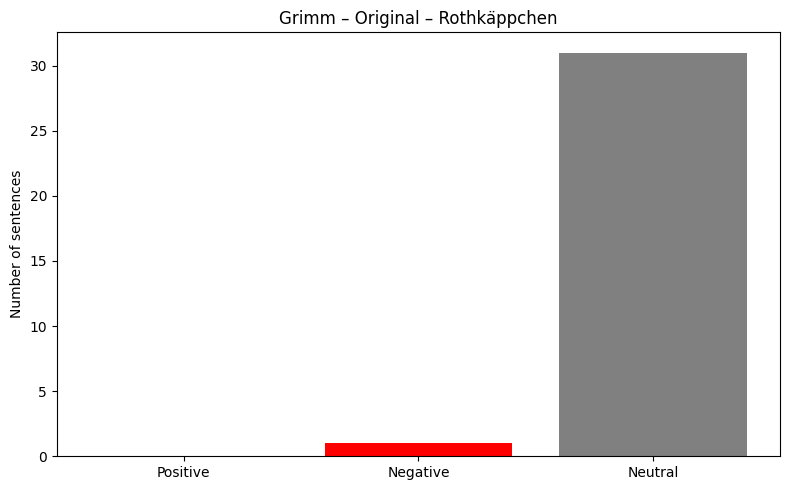

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


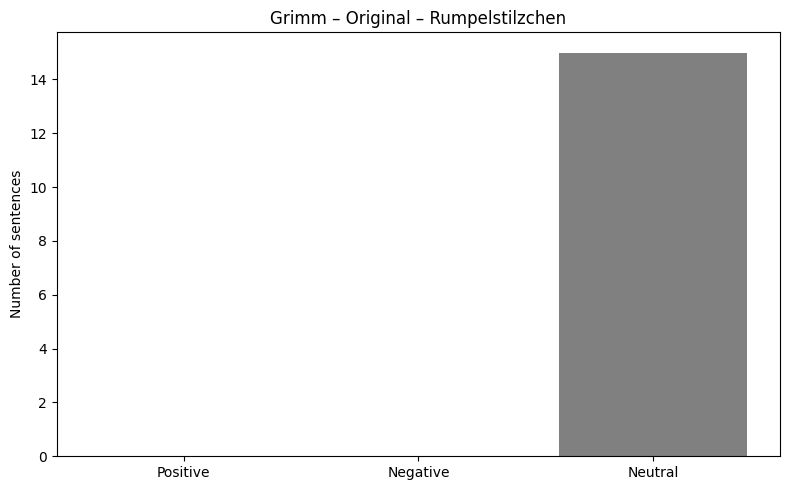

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


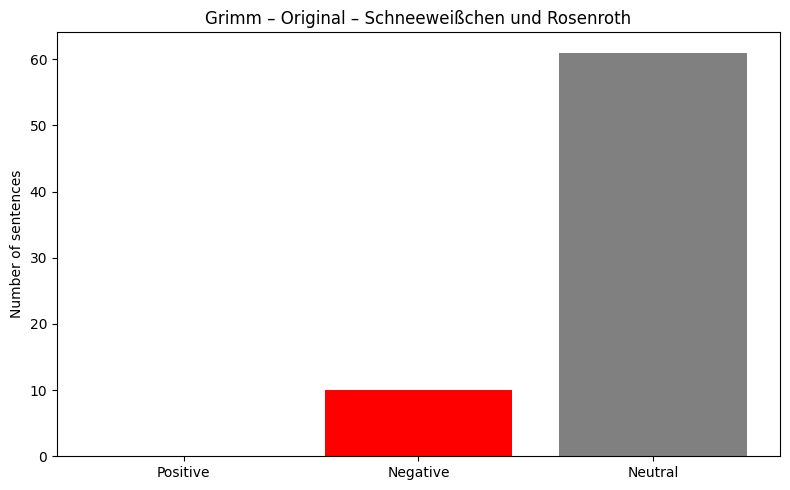

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


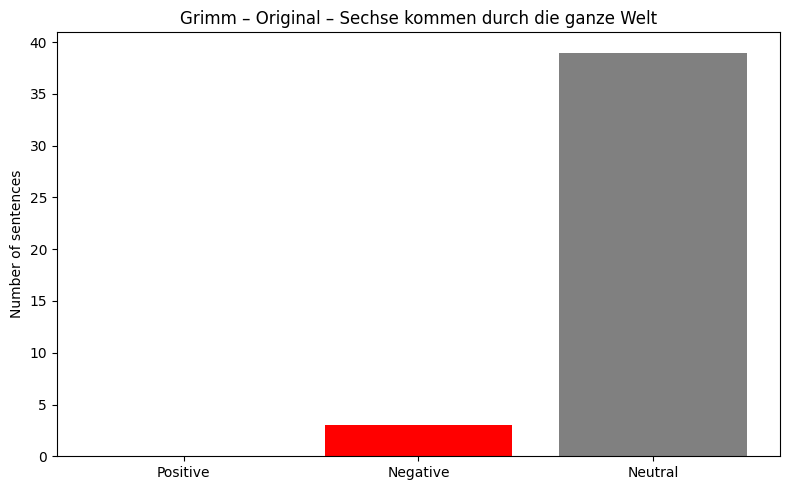

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


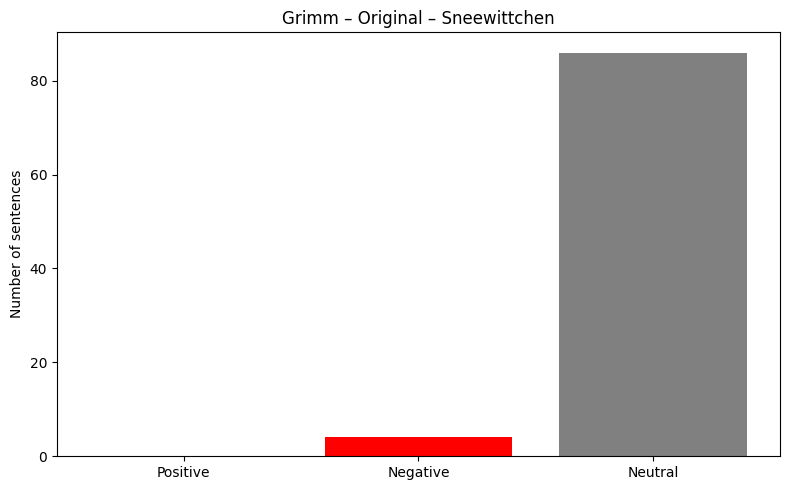

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


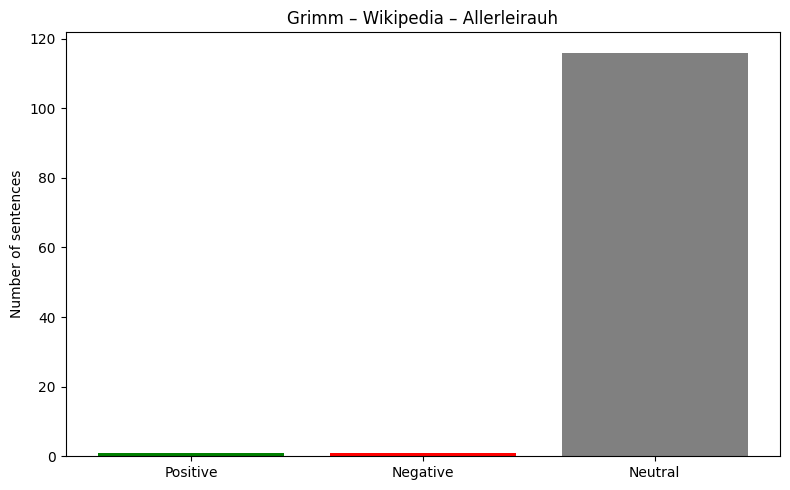

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


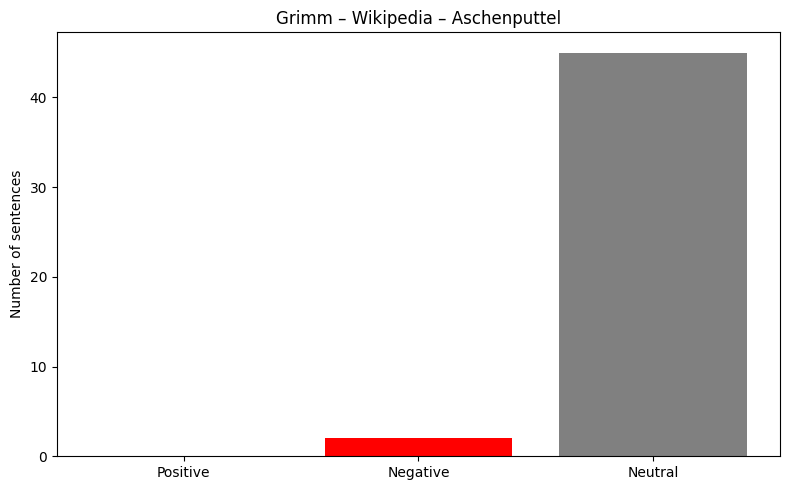

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


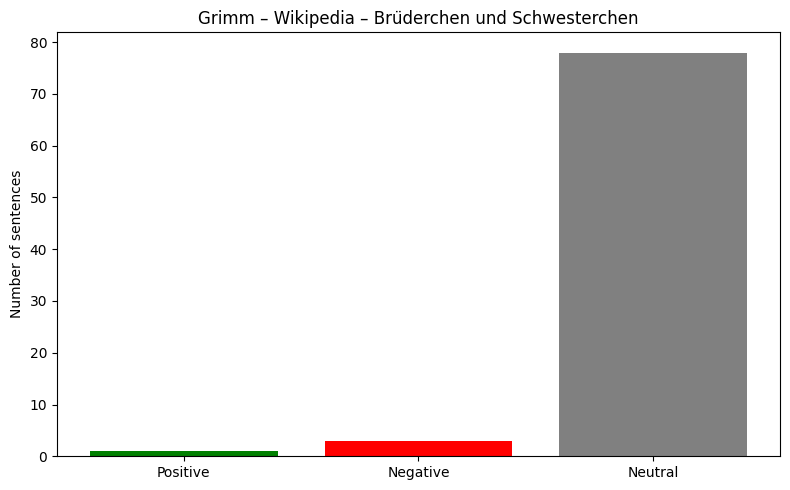

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


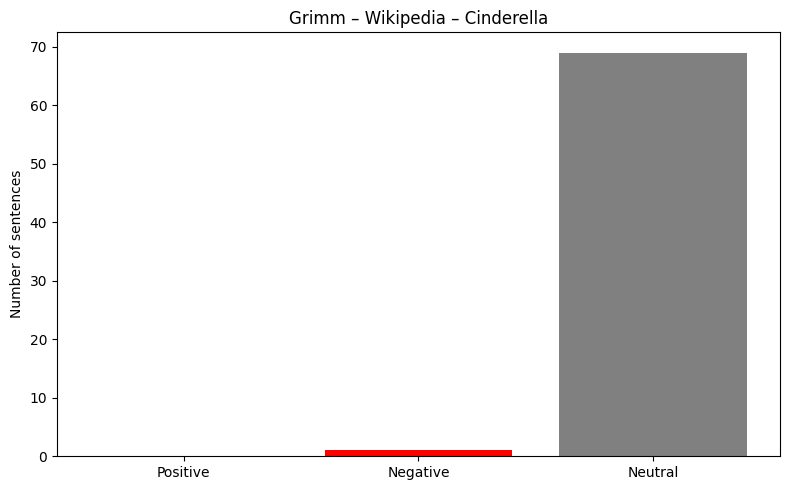

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


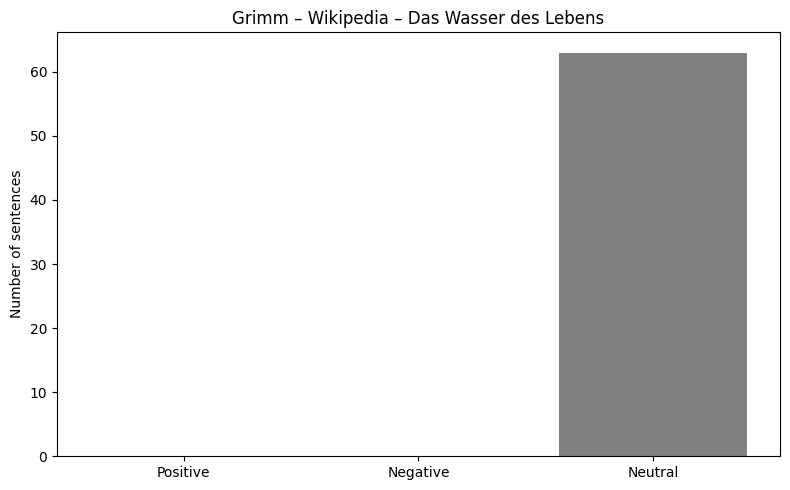

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


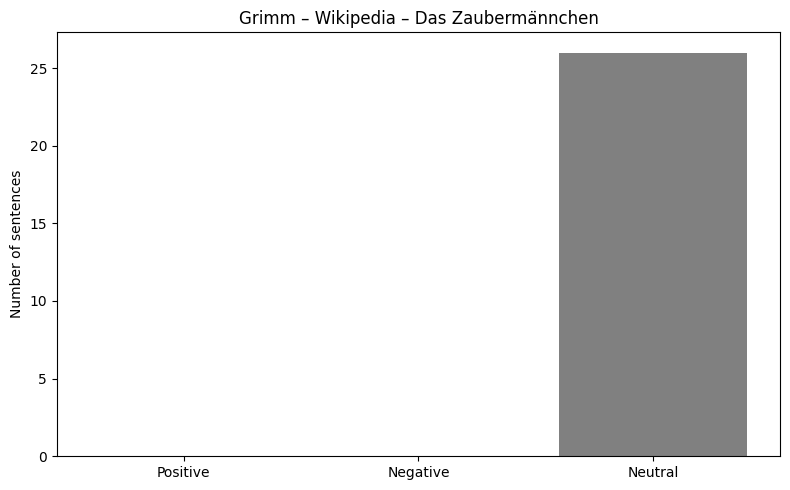

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


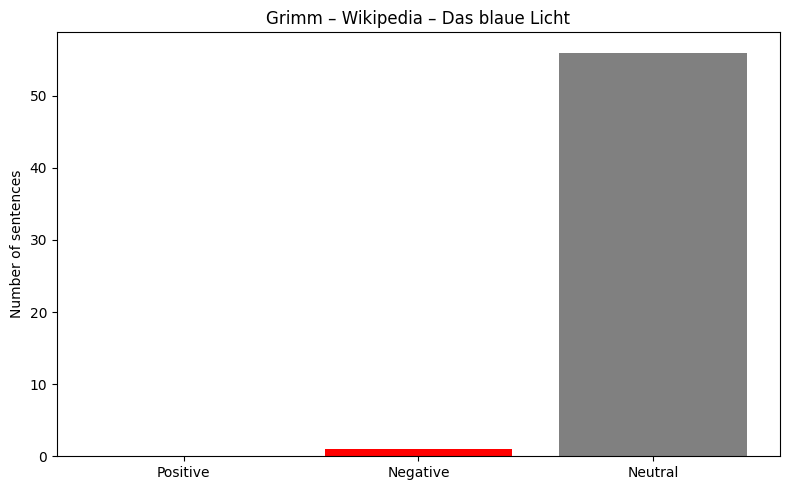

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


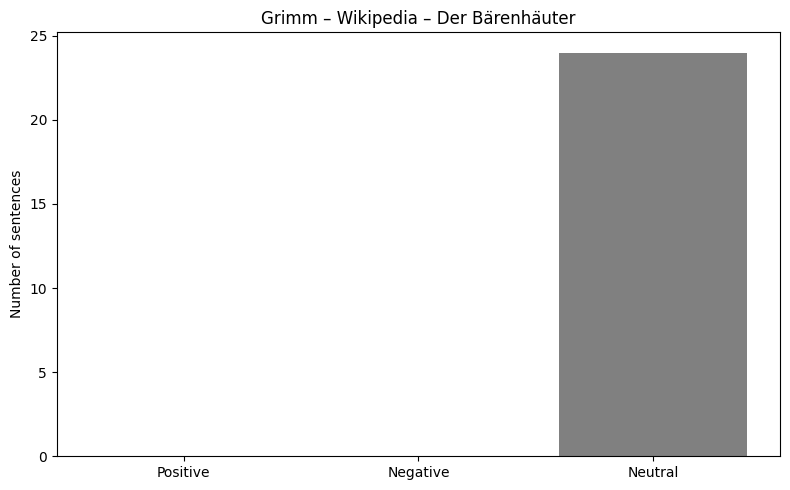

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


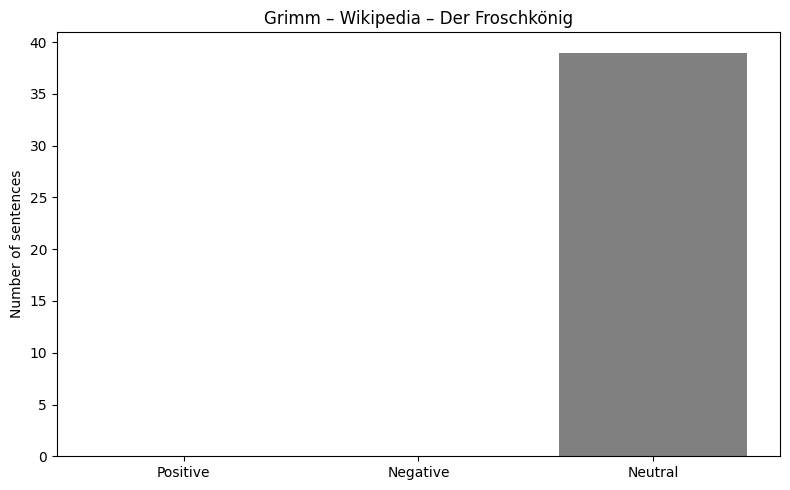

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


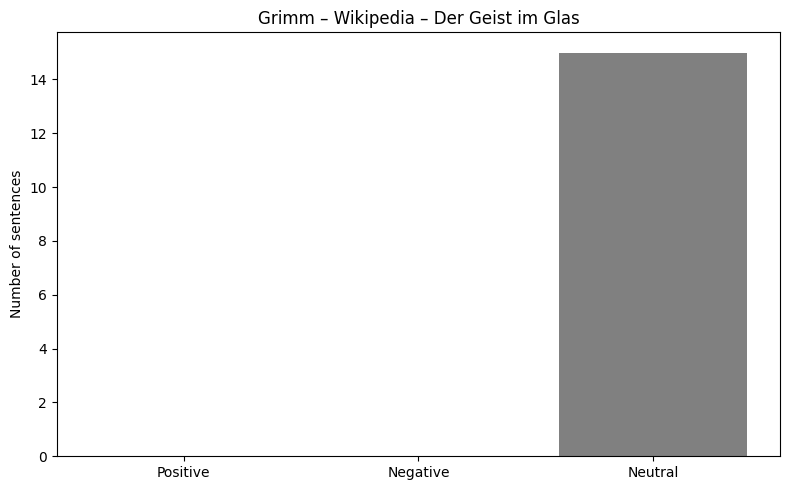

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


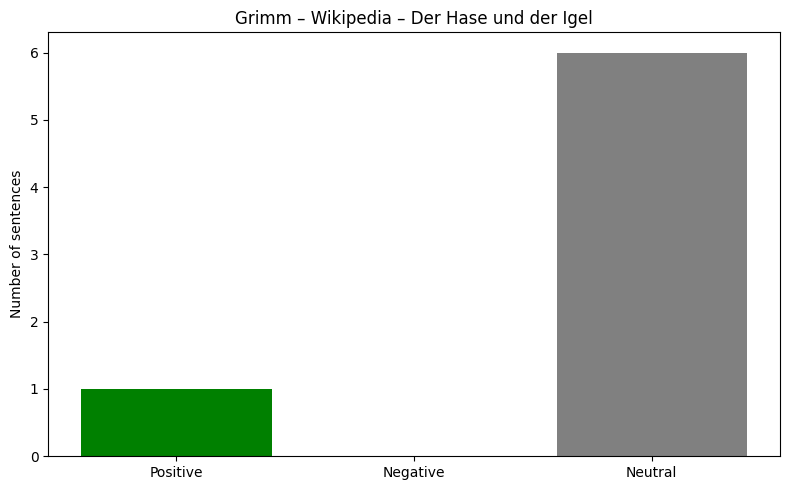

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


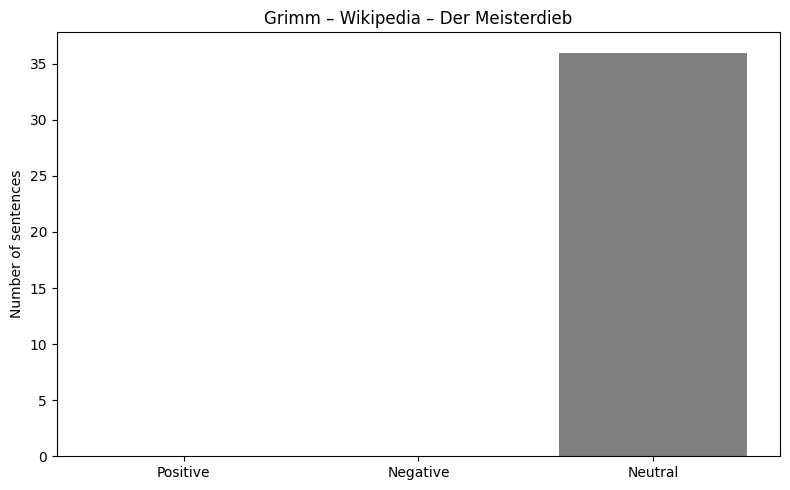

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


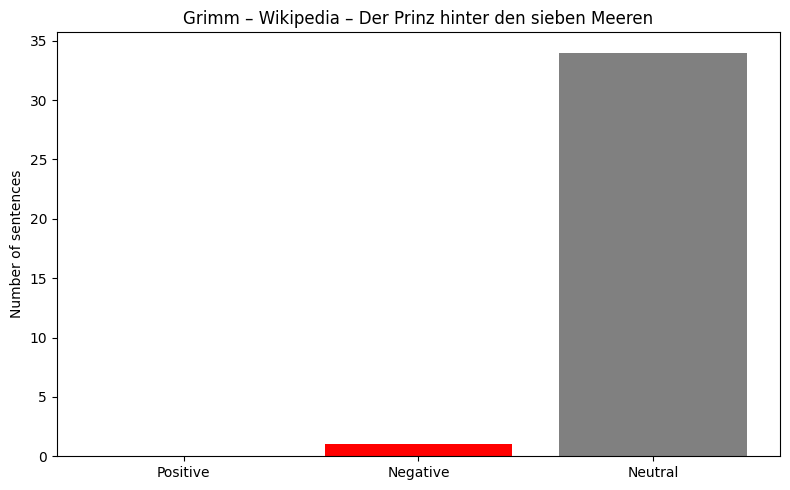

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


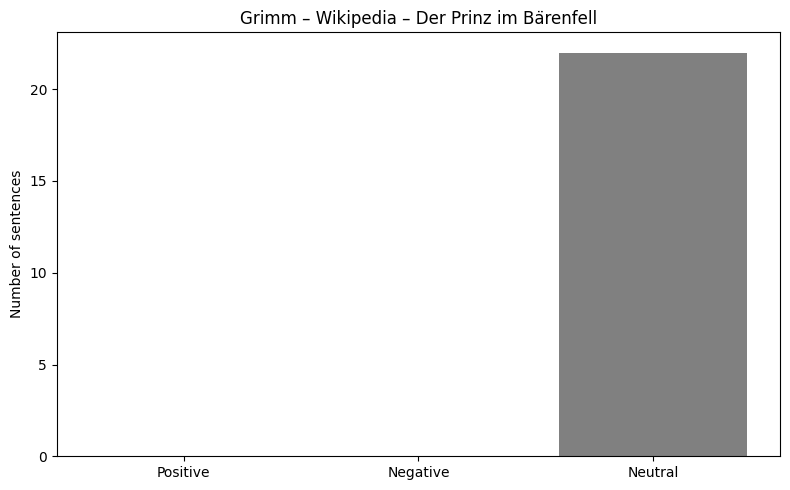

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


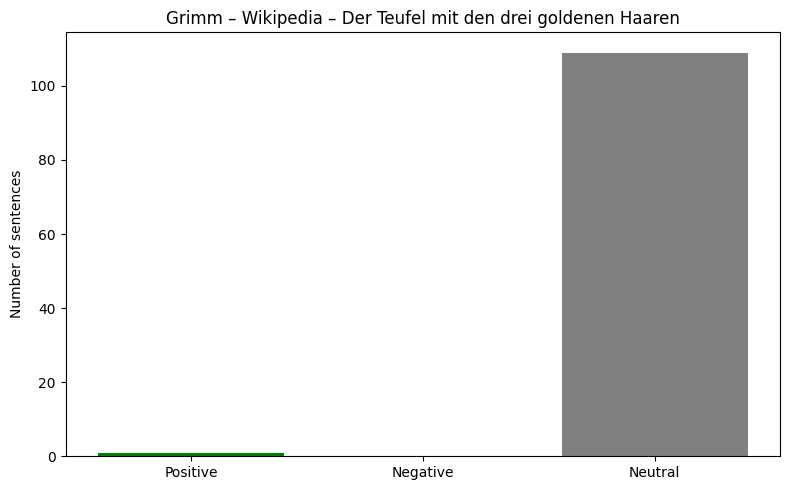

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


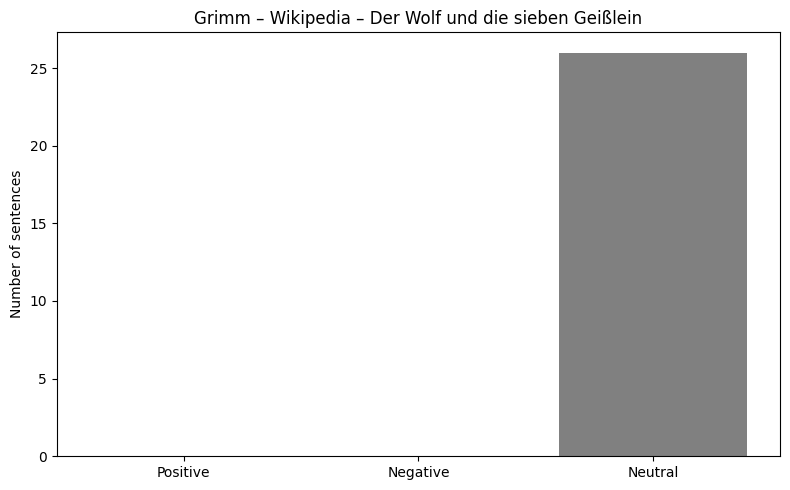

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


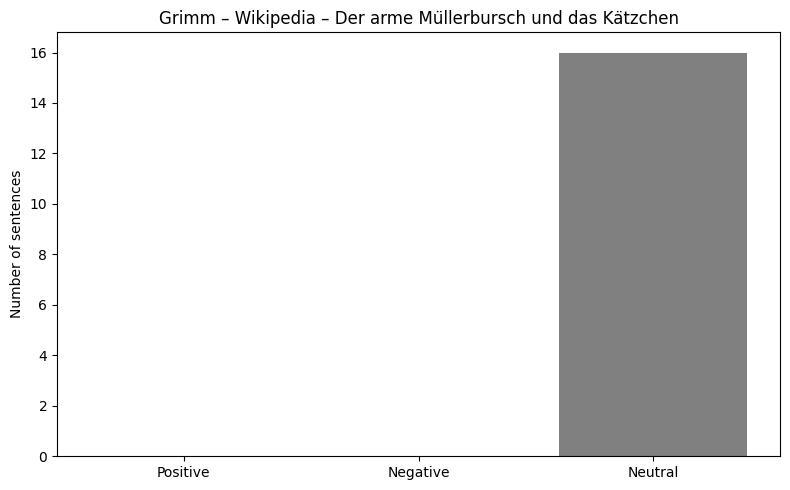

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


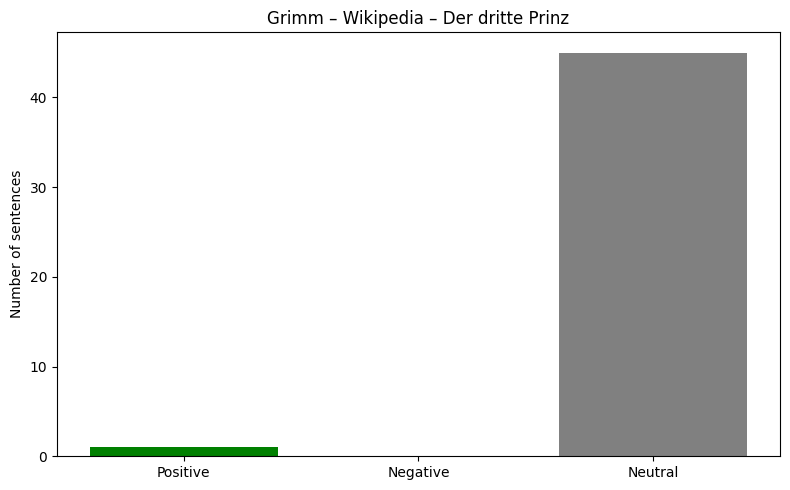

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


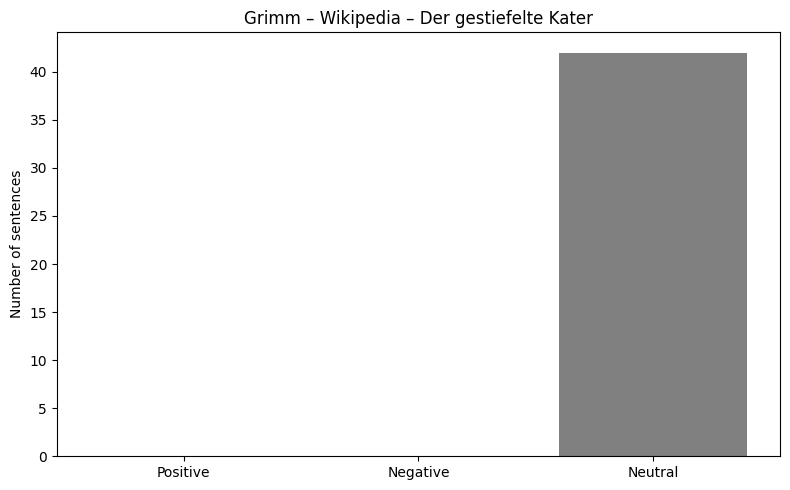

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


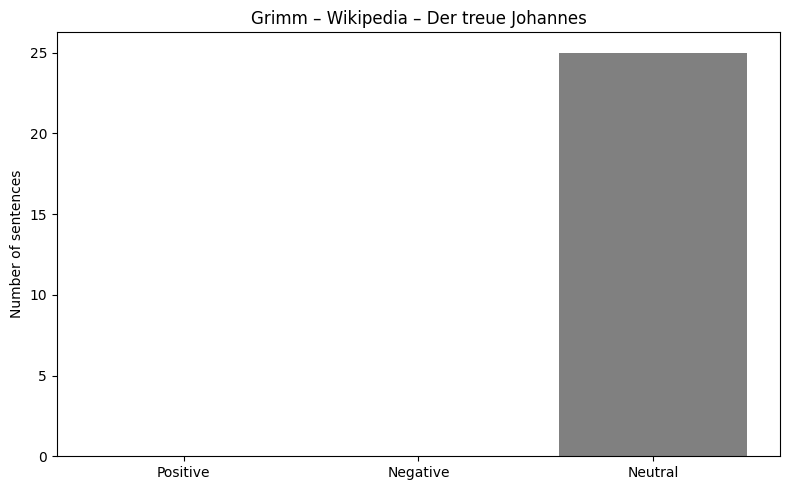

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


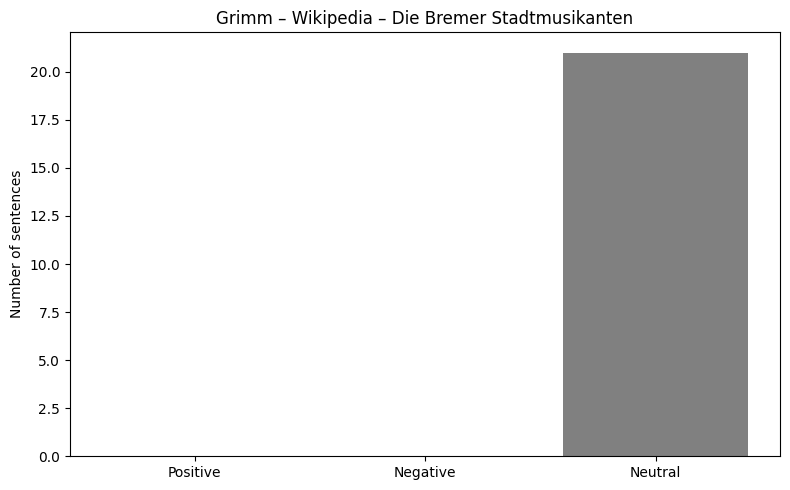

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


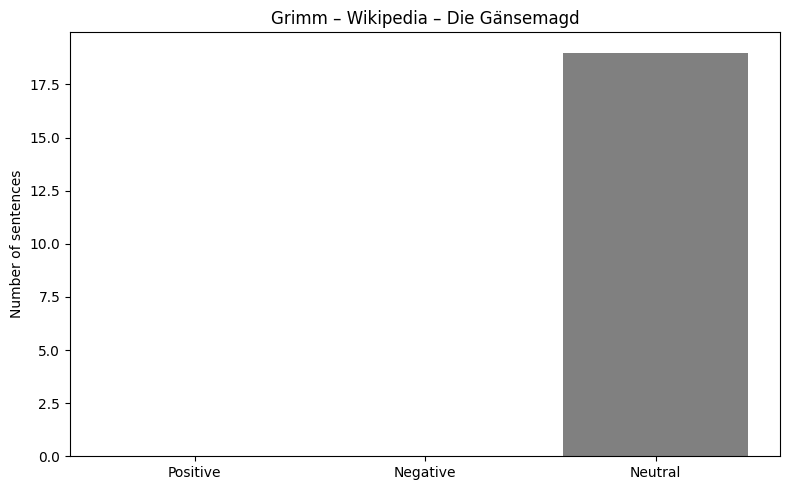

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


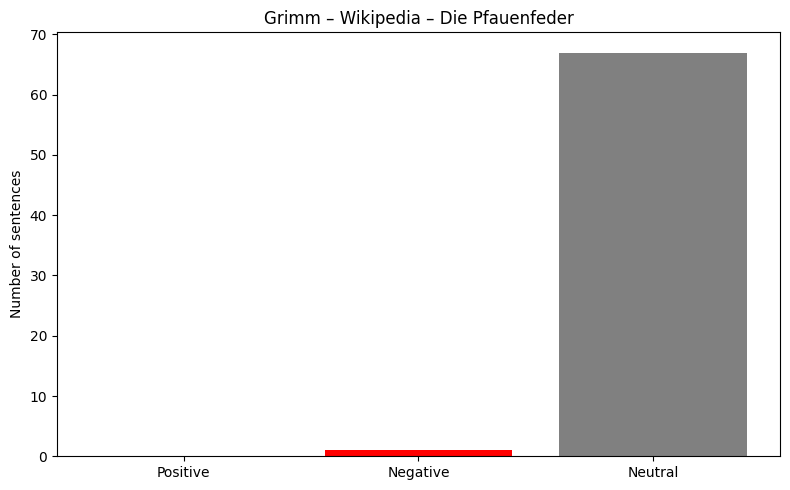

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


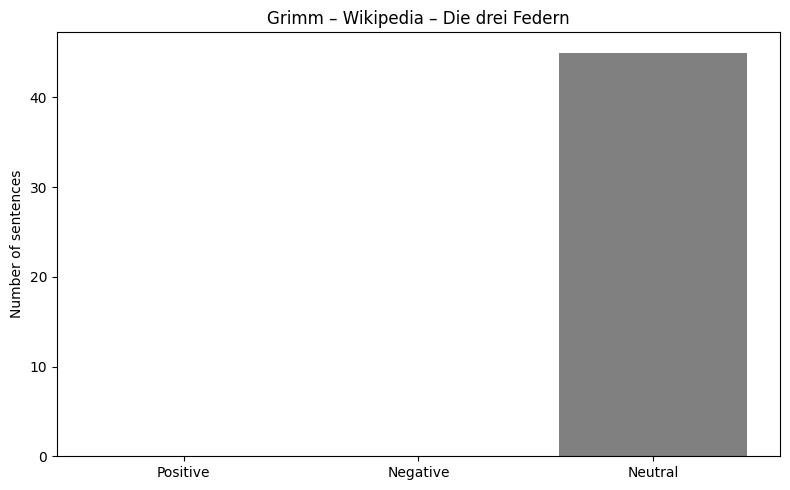

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


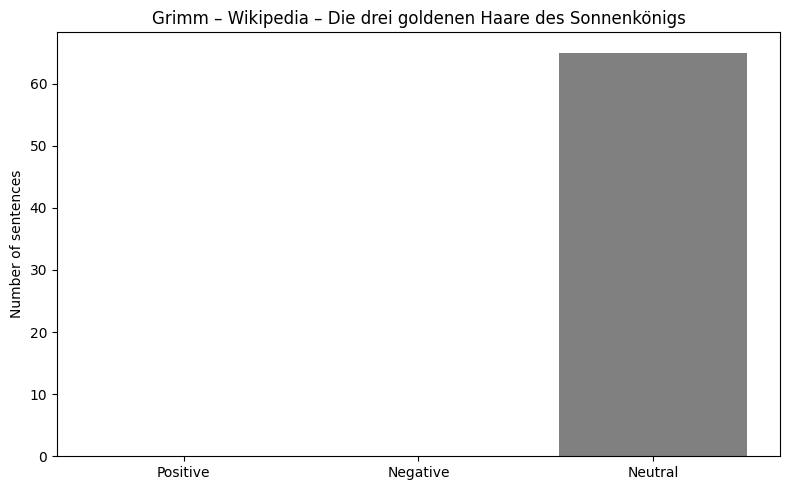

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


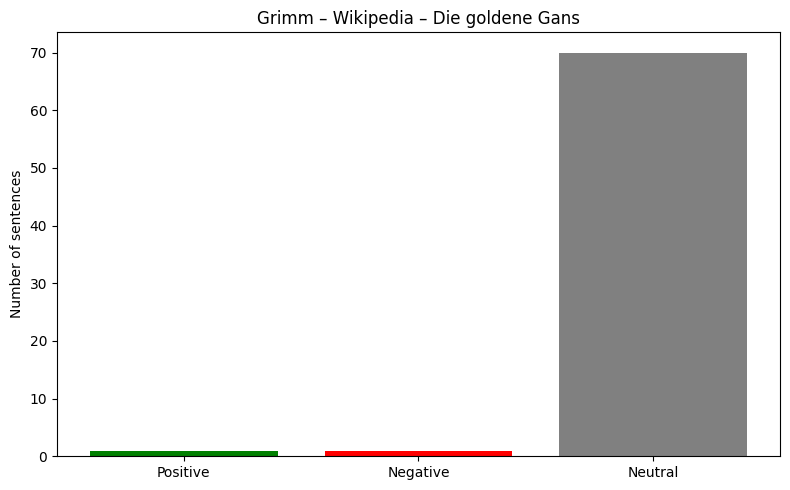

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


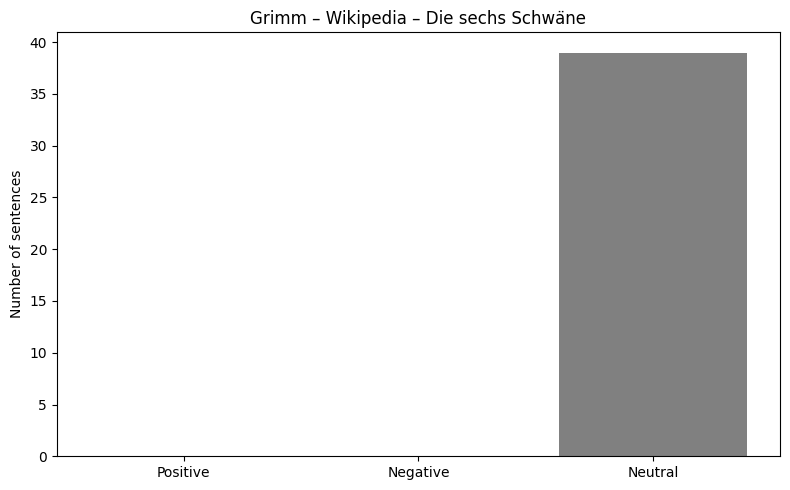

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


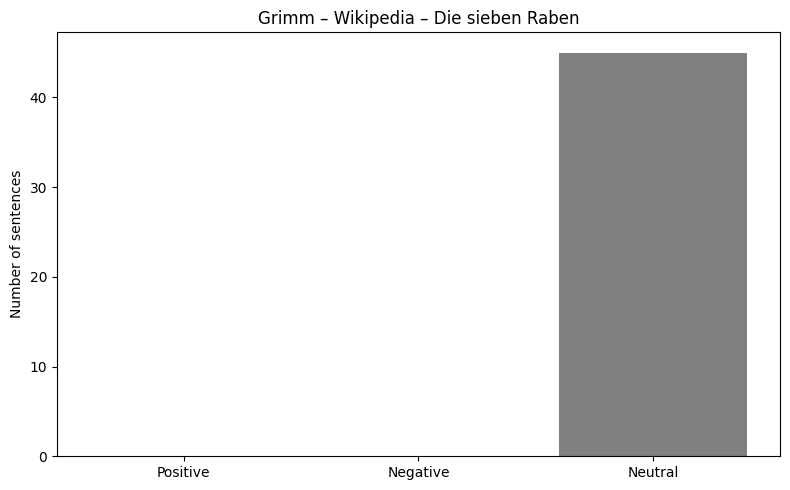

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


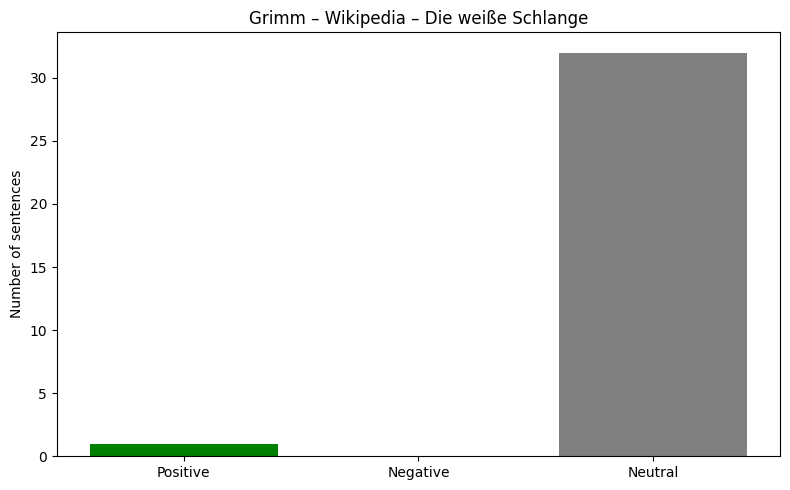

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


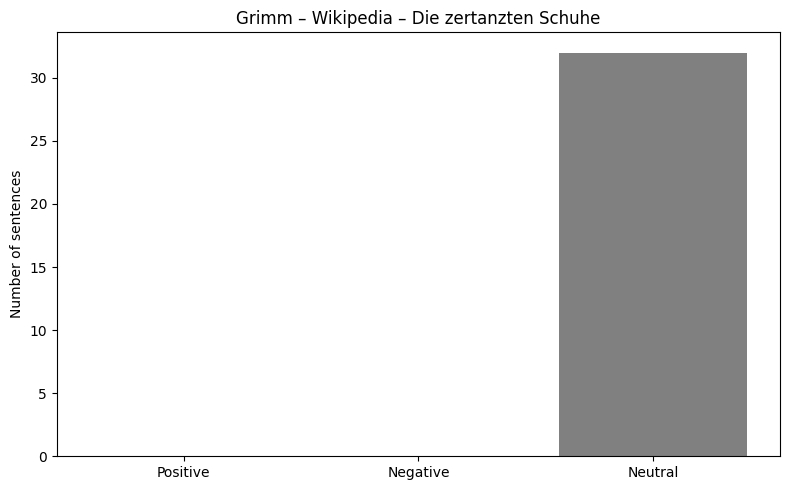

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


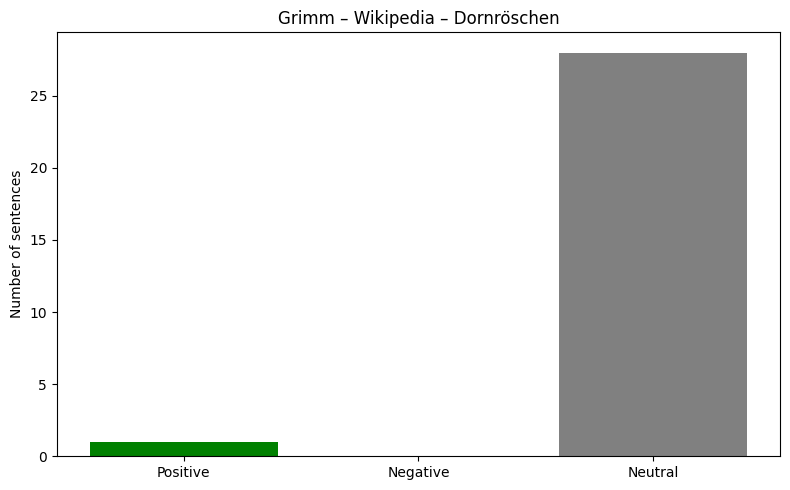

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


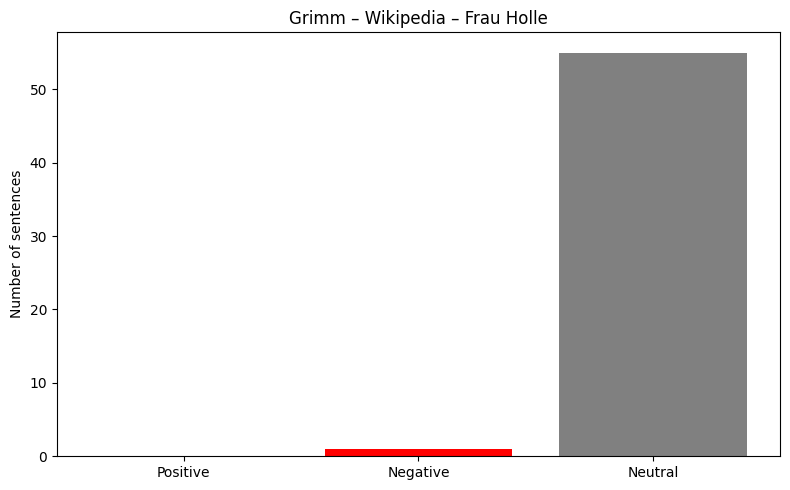

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


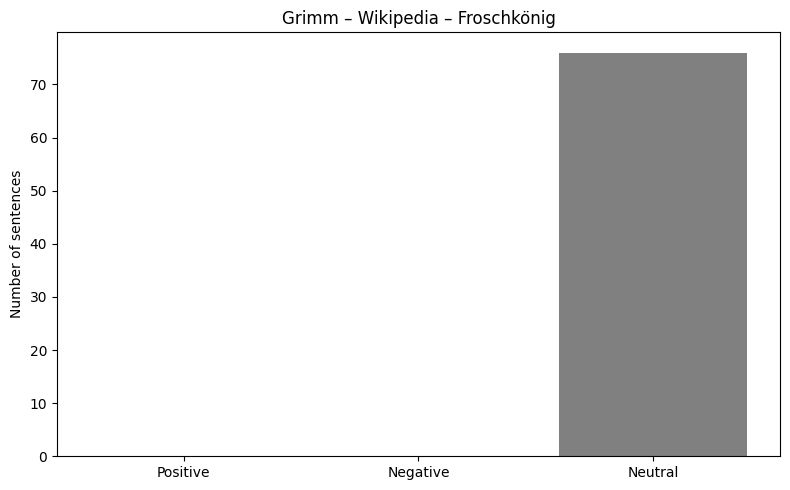

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


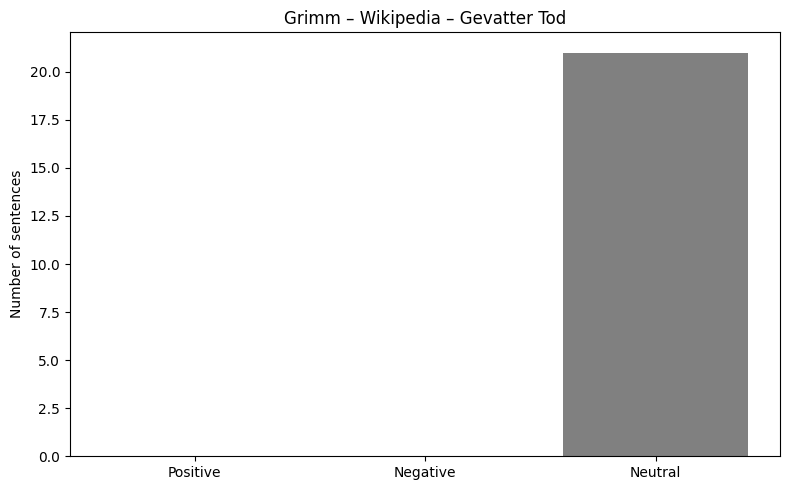

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


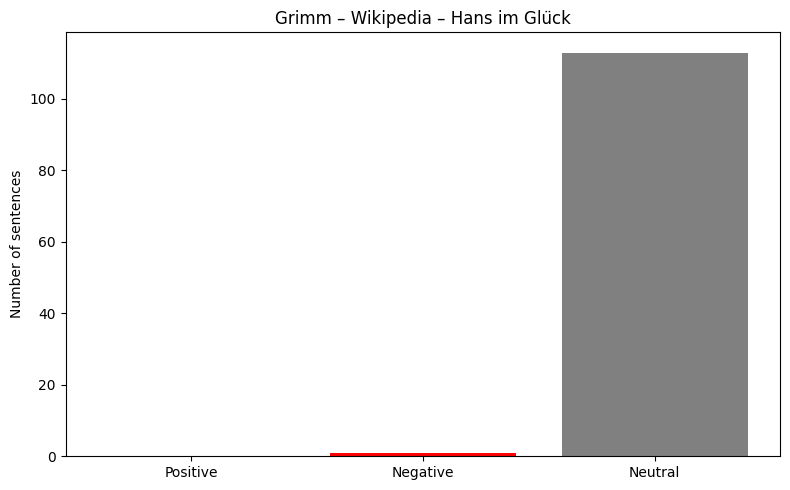

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


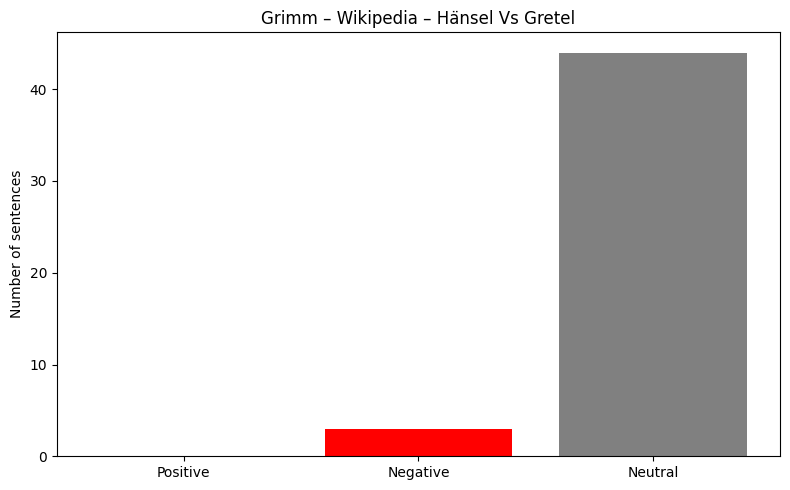

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


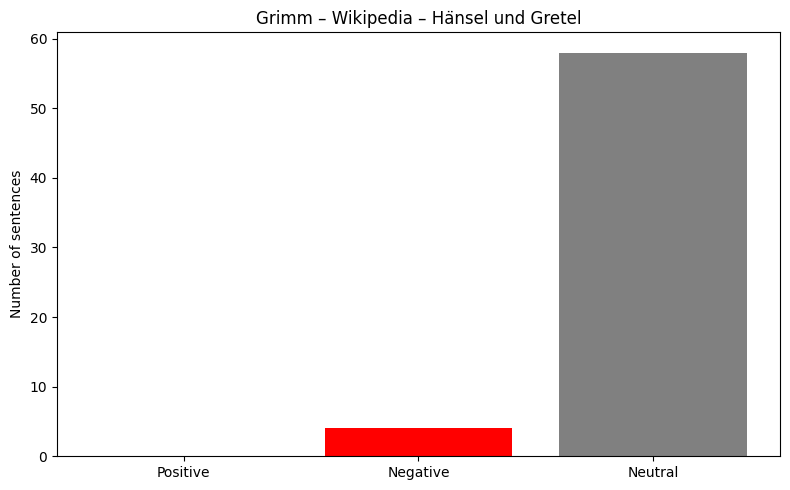

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


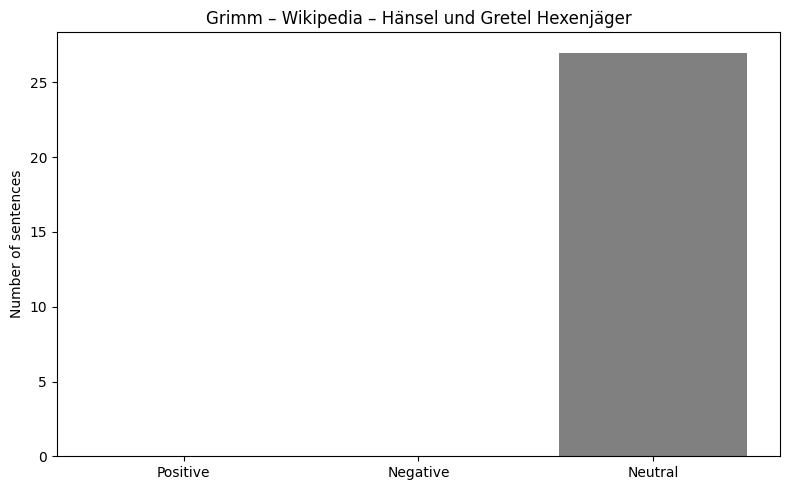

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


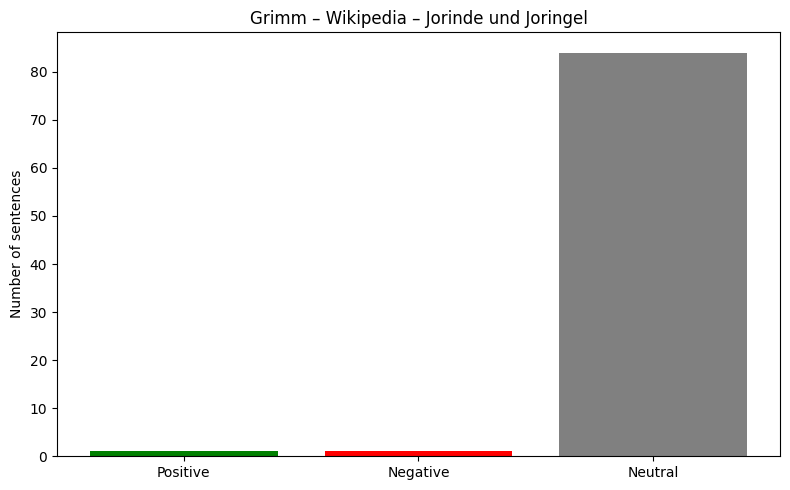

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


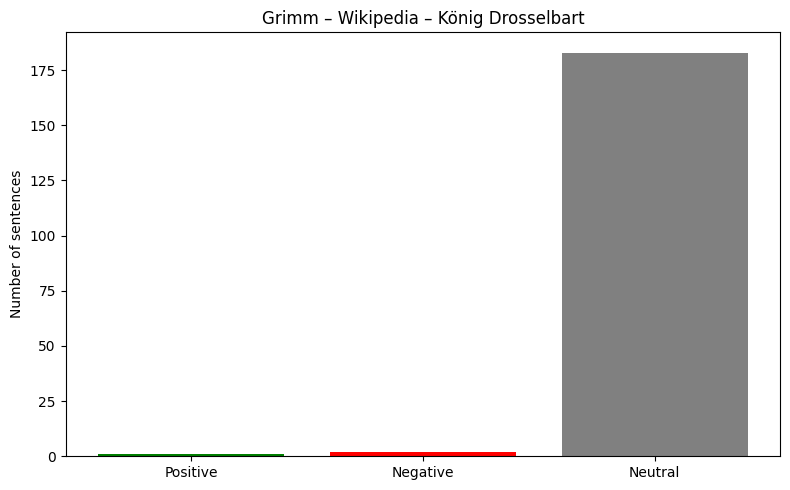

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


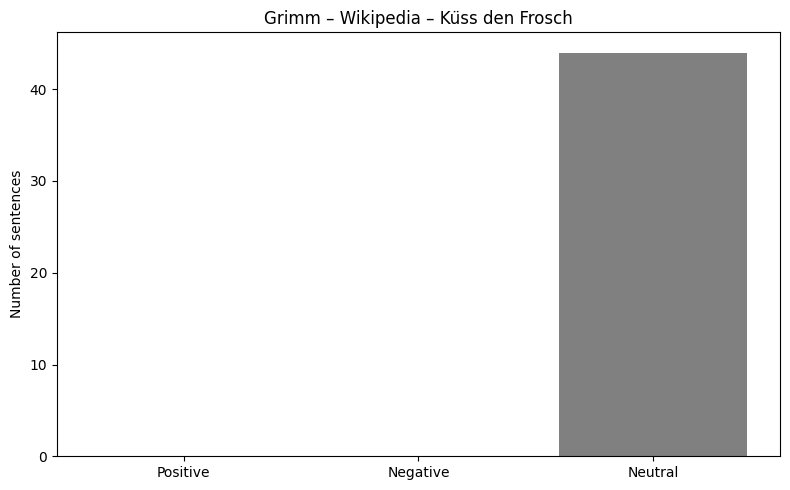

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


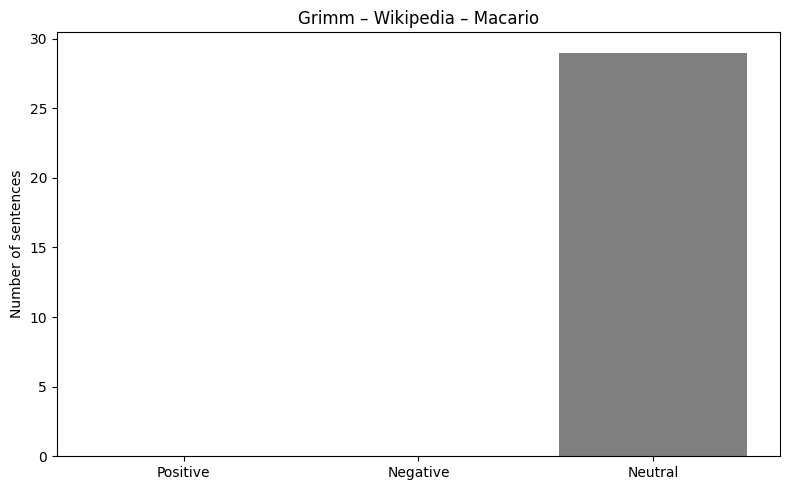

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


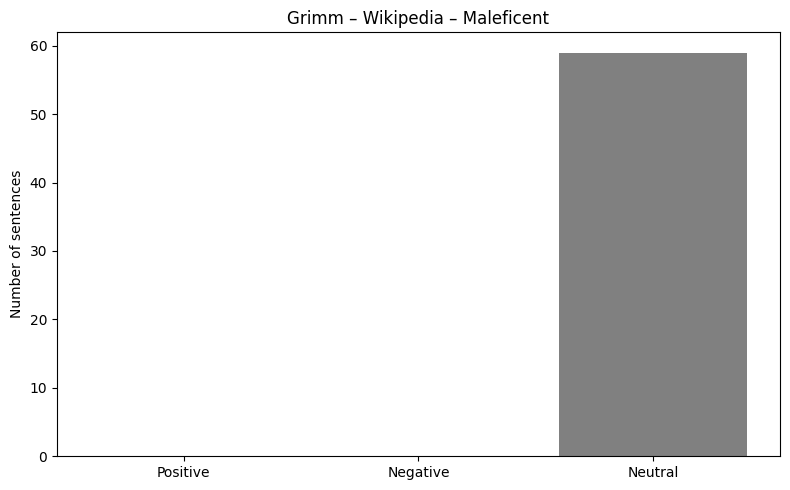

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


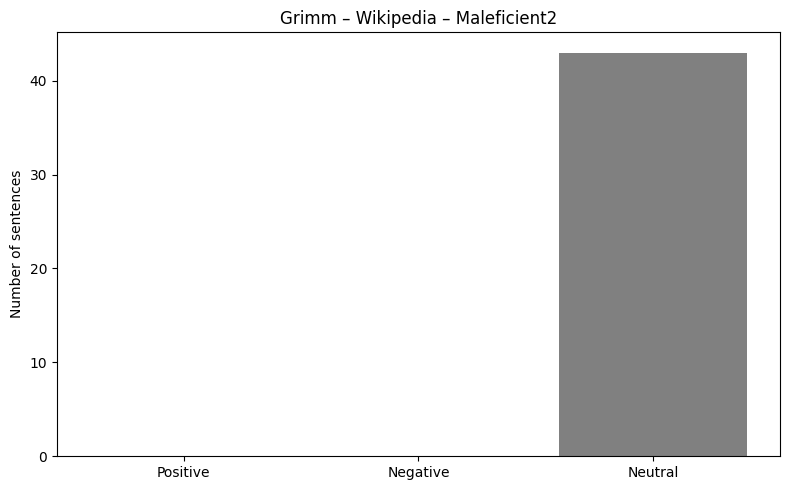

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


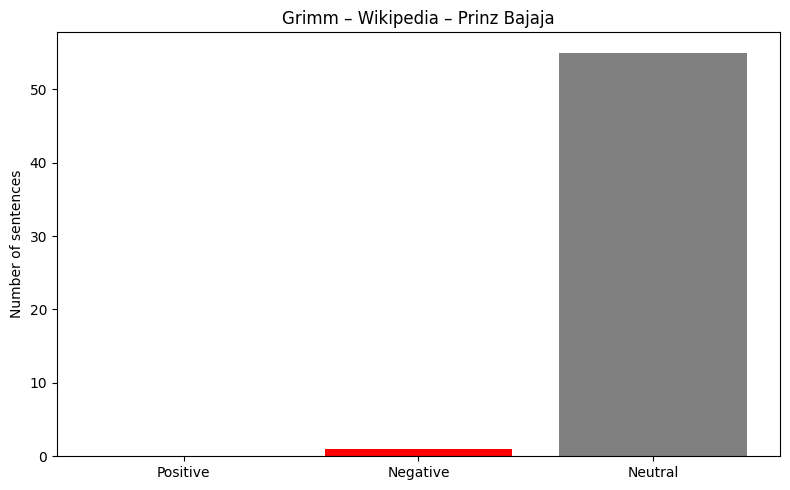

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


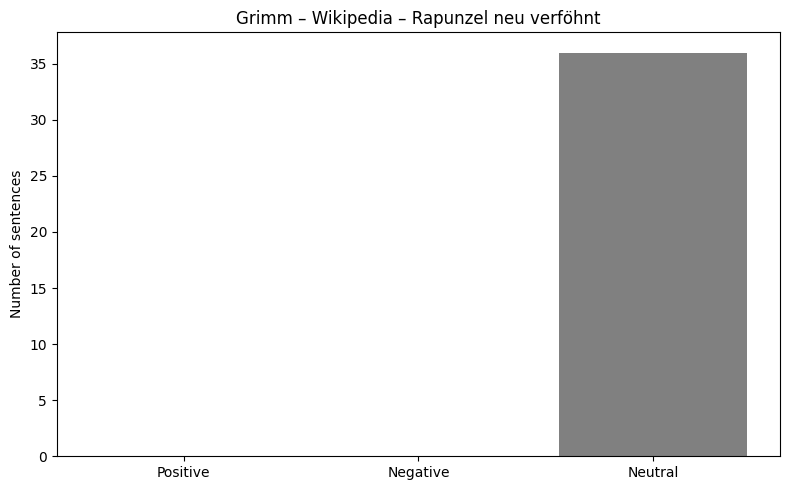

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


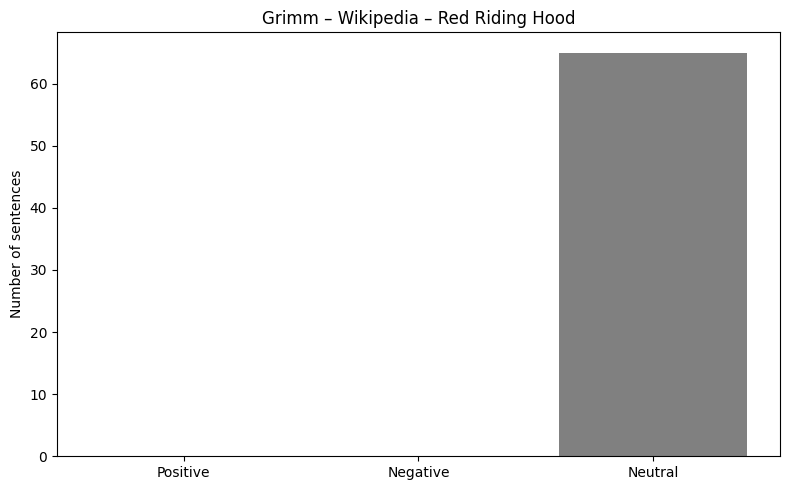

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


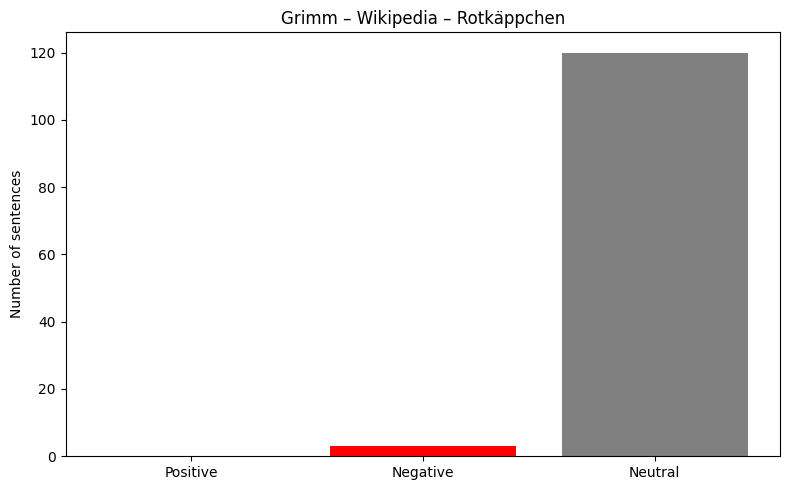

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


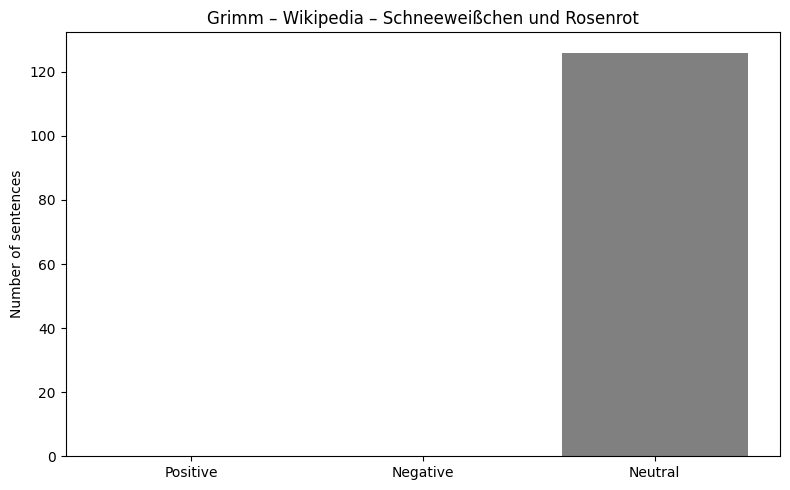

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


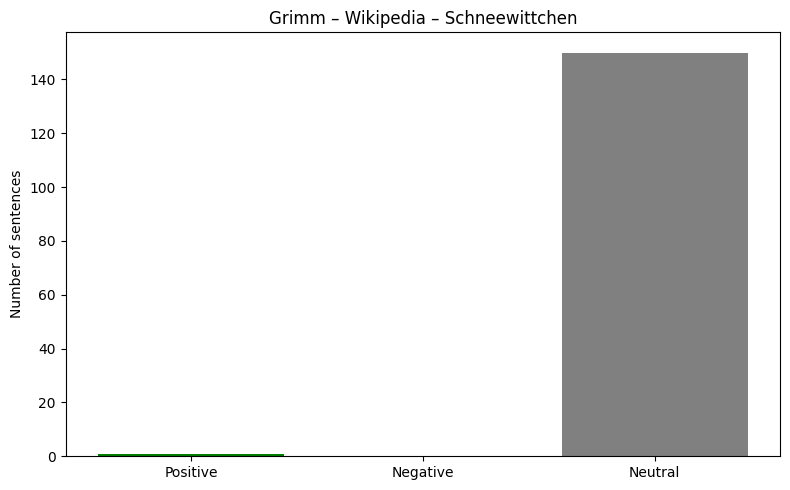

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


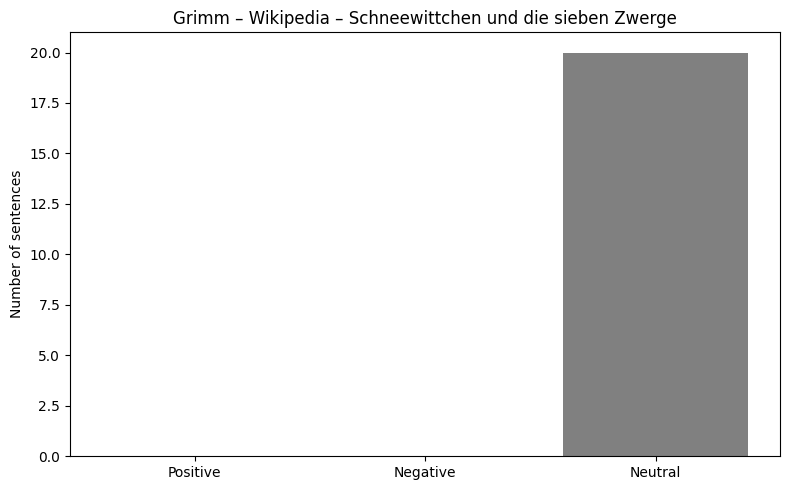

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


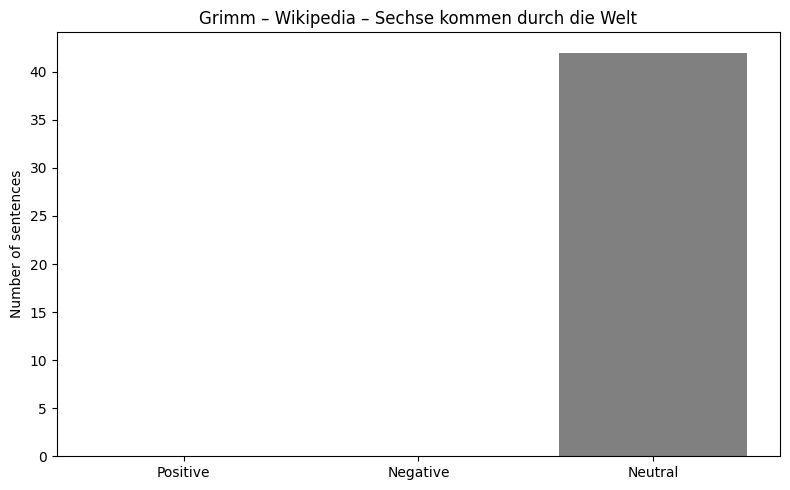

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


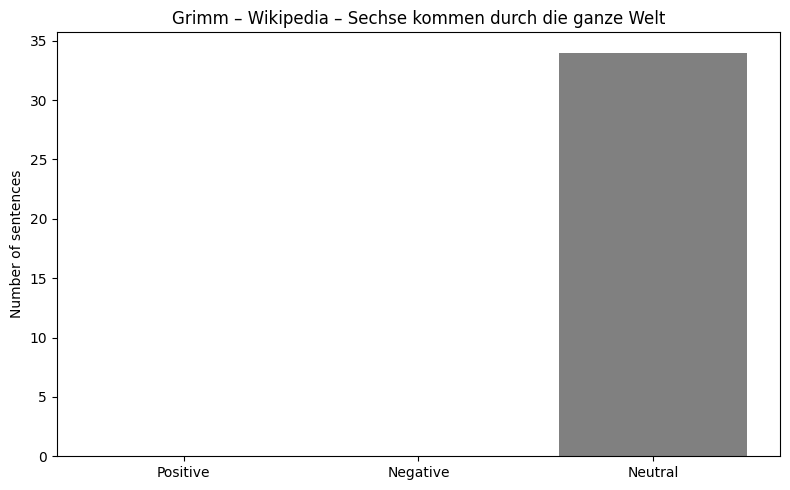

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


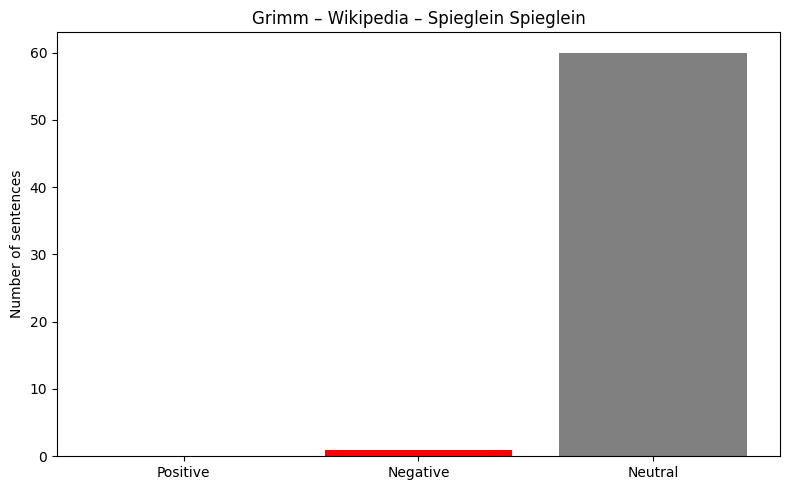

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


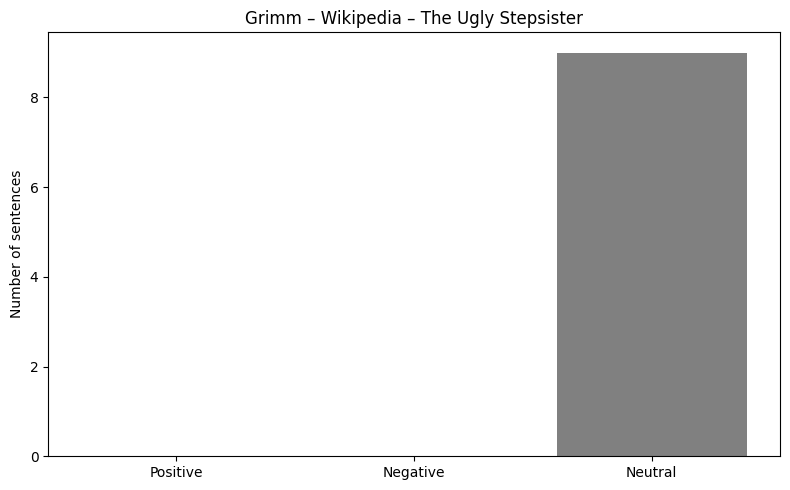

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


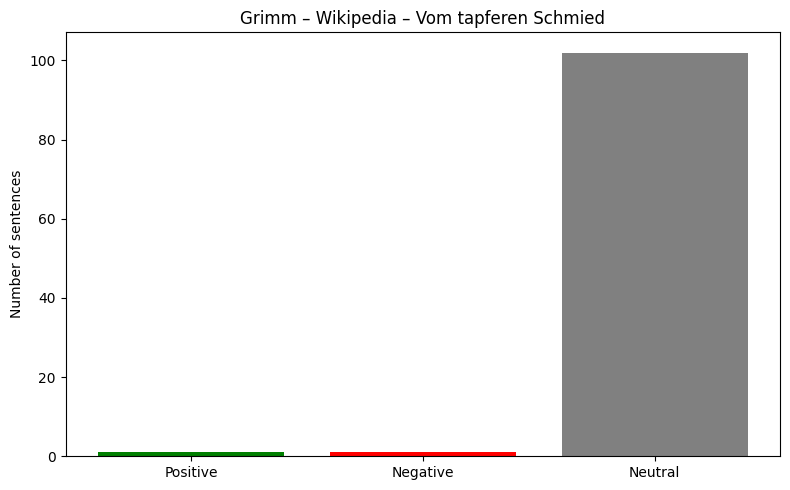

/tmp/ipython-input-1221202264.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)


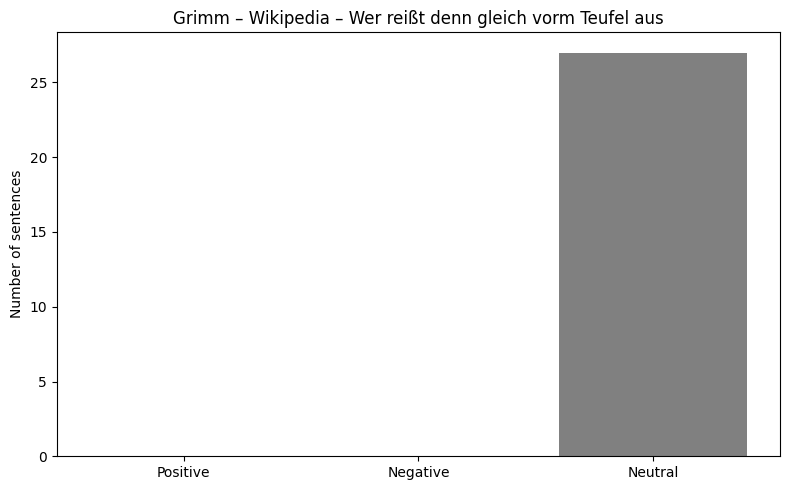

In [ ]:
for (author, text_type, title), row in agg_text.iterrows():
    fig, ax = plt.subplots(figsize=(8, 5))
    ax.bar(["Positive", "Negative", "Neutral"],
           [row["positive"], row["negative"], row["neutral"]],
           color=["green", "red", "gray"])
    ax.set_title(f"{author} – {text_type} – {title}")
    ax.set_ylabel("Number of sentences")
    ax.set_xticklabels(["Positive", "Negative", "Neutral"], rotation=0)
    plt.tight_layout()
    fig.savefig(f"/content/drive/MyDrive/Märchen-Seminar/Sentiment Analyse   Emotion Detection/Images/figure_grimm_sentence_sentiment_{text_type}_{title}.jpg", dpi=300, bbox_inches='tight')
    plt.show()

## Word level

In [ ]:
import pandas as pd

df = pd.read_csv("/content/drive/MyDrive/Märchen-Seminar/Sentiment Analyse   Emotion Detection/grimm_fairy_tales_sentence_sentiment.csv", sep="\t", encoding="utf-8")
print(df.columns)

Index(['Author', 'Type', 'Title', 'SentenceNr', 'Sentence', 'Sentiment'], dtype='object')


In [ ]:
import pandas as pd
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import string
import re

# Download tokenizer resources
nltk.download("punkt")
nltk.download("stopwords")

# Load sentence-level sentiment file
df = pd.read_csv("/content/drive/MyDrive/Märchen-Seminar/Sentiment Analyse   Emotion Detection/grimm_fairy_tales_sentence_sentiment.csv", sep="\t", encoding="utf-8")

# German stopwords
stop_words = set(stopwords.words("german"))

# Additional typographic punctuation not covered by string.punctuation
extra_punct = {
    "„", "“", "‚", "‘", "’", "``", "''", "—", "–", "…", "«", "»"
}

def preprocess(text):
    text = text.lower()

    # Tokenization
    tokens = word_tokenize(text, language="german")

    # Remove ASCII punctuation
    tokens = [t for t in tokens if t not in string.punctuation]

    # Remove typographic punctuation
    tokens = [t for t in tokens if t not in extra_punct]

    # Keep only alphabetic tokens (including German umlauts)
    tokens = [t for t in tokens if re.match(r"^[a-zäöüß]+$", t)]

    # Remove stopwords
    tokens = [t for t in tokens if t not in stop_words]

    return tokens

rows = []

# Iterate through all sentences and extract tokens
for _, row in df.iterrows():
    tokens = preprocess(row["Sentence"])
    for token in tokens:
        rows.append({
            "Author": row["Author"],
            "Type": row["Type"],
            "Title": row["Title"],
            "Token": token,
            "SentenceNr": row["SentenceNr"],
            "Sentence": row["Sentence"],
            "Sentiment": row["Sentiment"]
        })

df_tokens = pd.DataFrame(rows)

df_tokens.to_csv(
    "/content/drive/MyDrive/Märchen-Seminar/Sentiment Analyse   Emotion Detection/grimm_fairy_tales_token_sentiment.csv",
    sep=",",
    index=False,
    encoding="utf-8-sig"
)

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [ ]:
token_counts = (
    df_tokens.groupby(["Sentiment", "Token"])
    .size()
    .reset_index(name="Count")
)

print(token_counts.sort_values("Count", ascending=False).head(20))

      Sentiment       Token  Count
7839    neutral       könig    931
10896   neutral      sprach    576
12883   neutral        wald    343
4891    neutral        frau    325
9402    neutral  prinzessin    322
7336    neutral         kam    298
10182   neutral     schloss    297
5938    neutral        ging    282
9907    neutral       sagte    279
12030   neutral       vater    273
9399    neutral       prinz    270
8769    neutral     mädchen    268
7842    neutral     königin    261
9910    neutral         sah    250
6337    neutral        hans    232
8422    neutral        mann    227
8749    neutral      mutter    222
3489    neutral        drei    221
13392   neutral       wurde    206
13714   neutral      zurück    202


/tmp/ipython-input-3257456074.py:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(subset["Token"], rotation=45, ha="right")


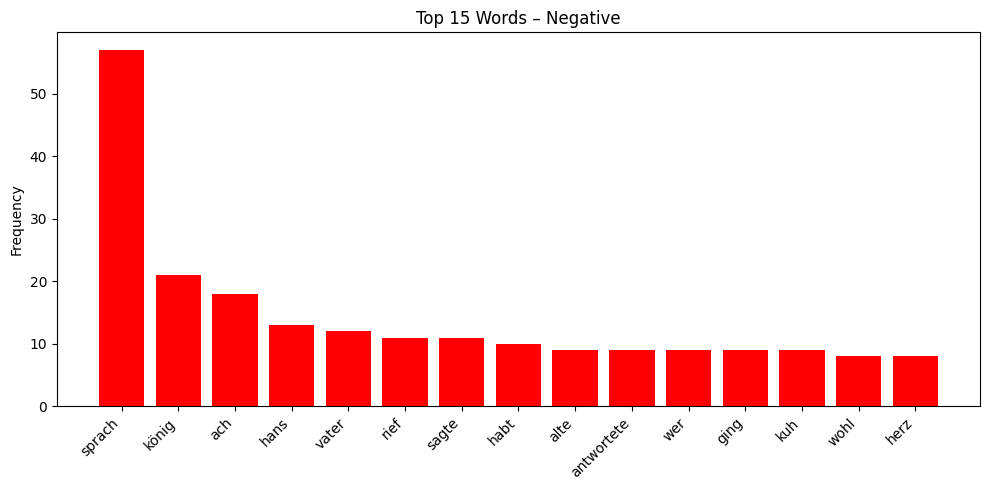

/tmp/ipython-input-3257456074.py:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(subset["Token"], rotation=45, ha="right")


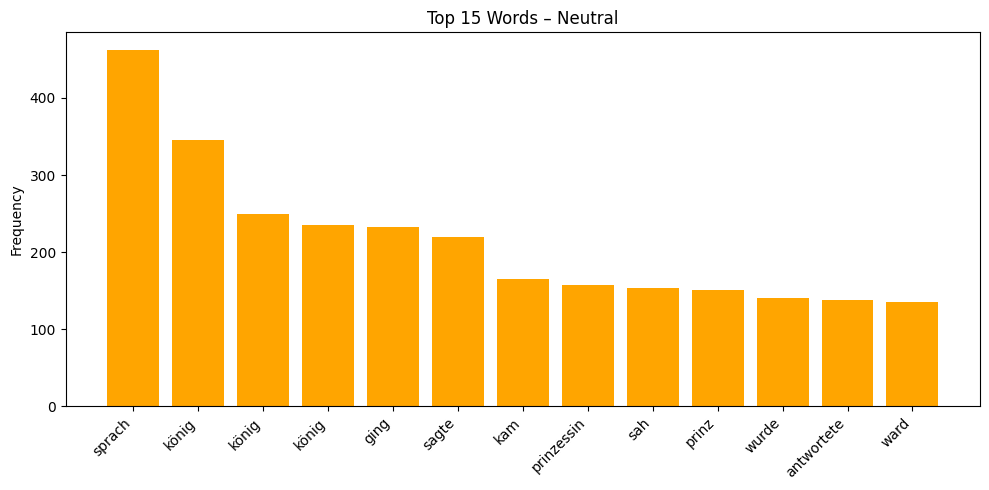

/tmp/ipython-input-3257456074.py:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(subset["Token"], rotation=45, ha="right")


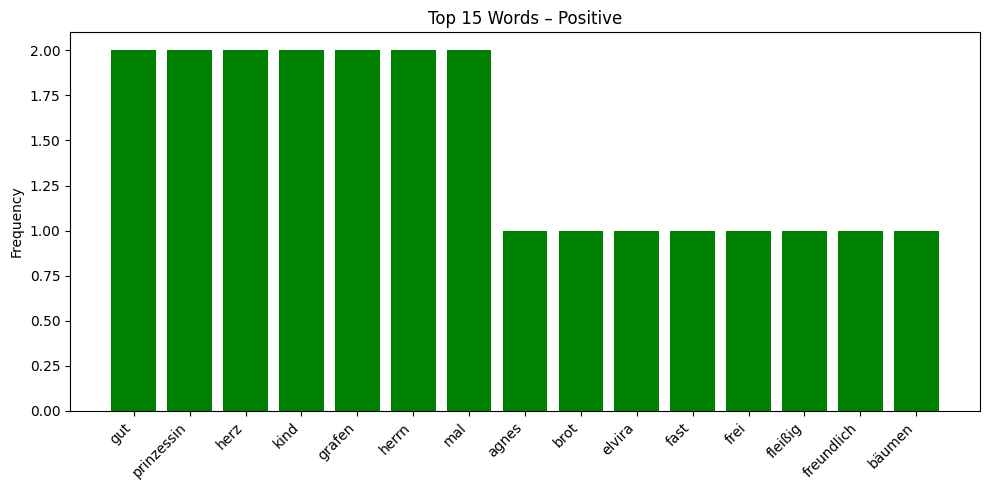

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

freq = (
    df_tokens.groupby(["Type", "Sentiment", "Token"])
    .size()
    .reset_index(name="Count")
)

for sentiment in ["negative", "neutral", "positive"]:
    subset = (
        freq[freq["Sentiment"] == sentiment]
        .sort_values("Count", ascending=False)
        .head(15)
    )

    fig, ax = plt.subplots(figsize=(10, 5))
    ax.bar(
        subset["Token"],
        subset["Count"],
        color=(
            "red" if sentiment == "negative"
            else "orange" if sentiment == "neutral"
            else "green"
        )
    )
    ax.set_xticklabels(subset["Token"], rotation=45, ha="right")
    ax.set_title(f"Top 15 Words – {sentiment.capitalize()}")
    ax.set_ylabel("Frequency")
    plt.tight_layout()
    fig.savefig(f"/content/drive/MyDrive/Märchen-Seminar/Sentiment Analyse   Emotion Detection/Images/figure_grimm_top15_words_{sentiment}.jpg", dpi=300, bbox_inches='tight')
    plt.show()

/tmp/ipython-input-1460129121.py:28: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(subset["Token"], rotation=45, ha="right")


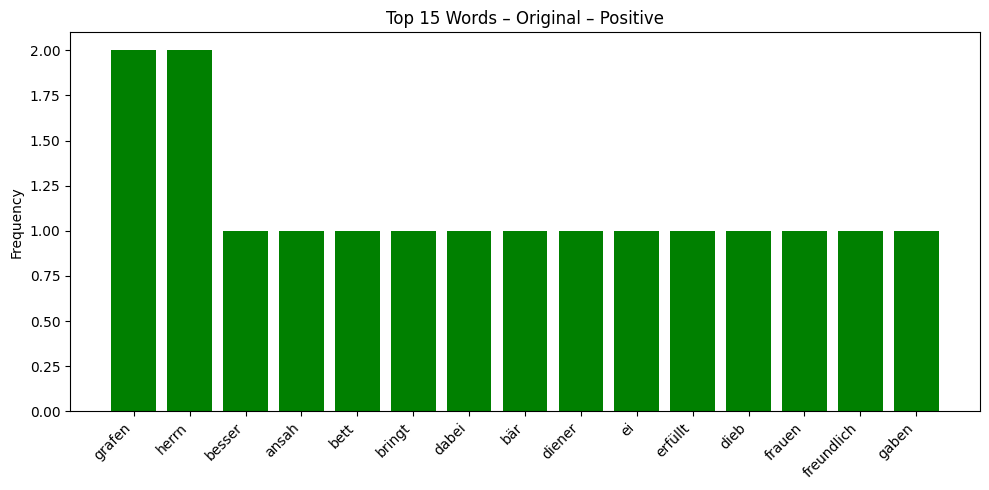

/tmp/ipython-input-1460129121.py:28: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(subset["Token"], rotation=45, ha="right")


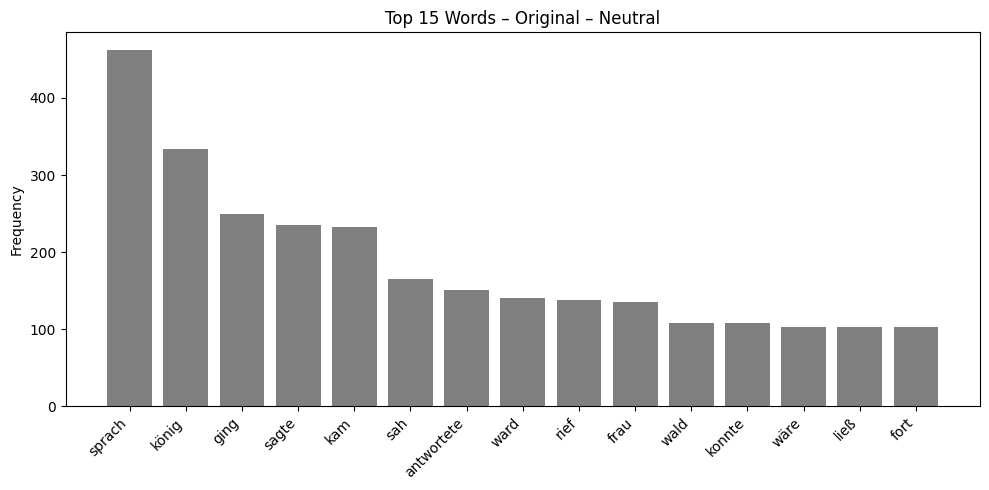

/tmp/ipython-input-1460129121.py:28: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(subset["Token"], rotation=45, ha="right")


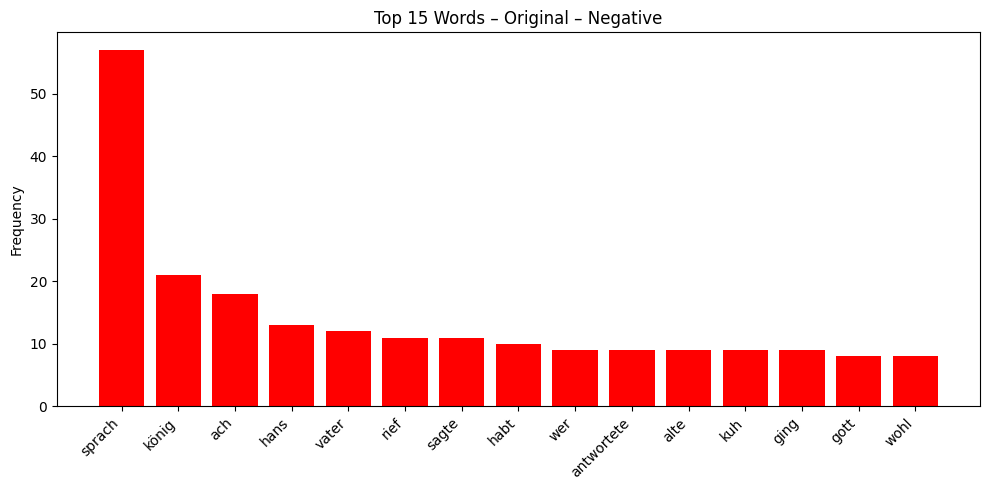

/tmp/ipython-input-1460129121.py:28: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(subset["Token"], rotation=45, ha="right")


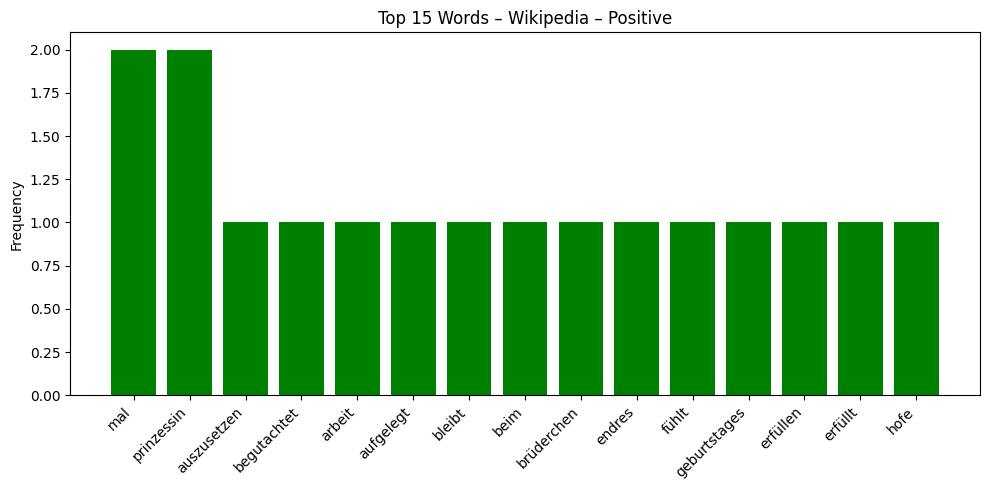

/tmp/ipython-input-1460129121.py:28: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(subset["Token"], rotation=45, ha="right")


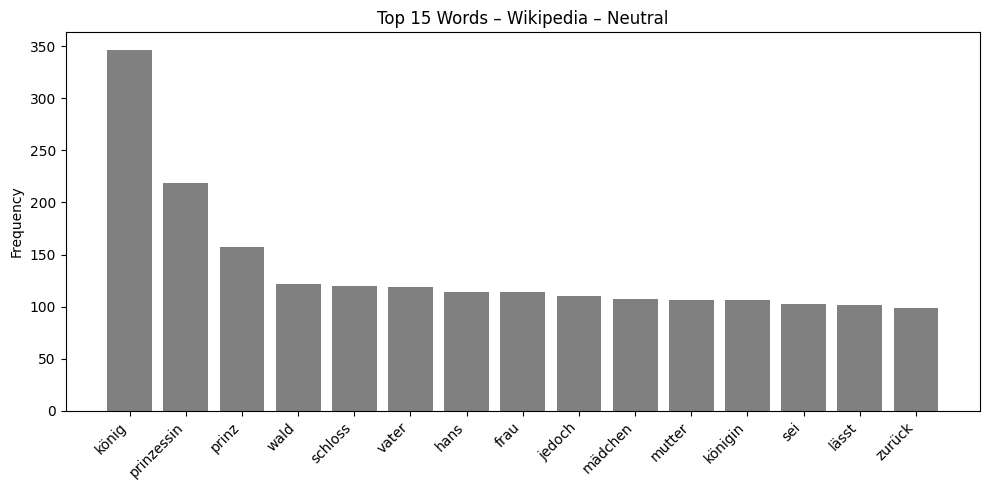

/tmp/ipython-input-1460129121.py:28: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(subset["Token"], rotation=45, ha="right")


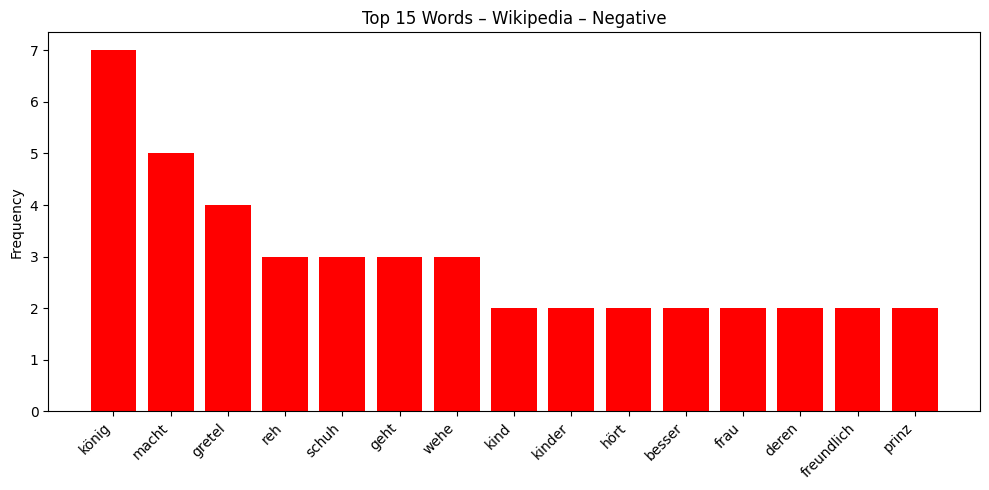

/tmp/ipython-input-1460129121.py:28: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(subset["Token"], rotation=45, ha="right")


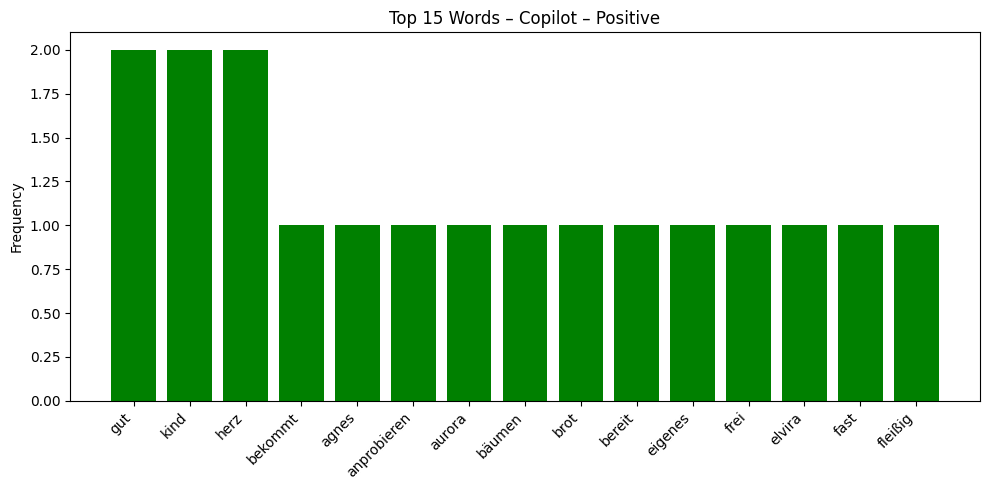

/tmp/ipython-input-1460129121.py:28: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(subset["Token"], rotation=45, ha="right")


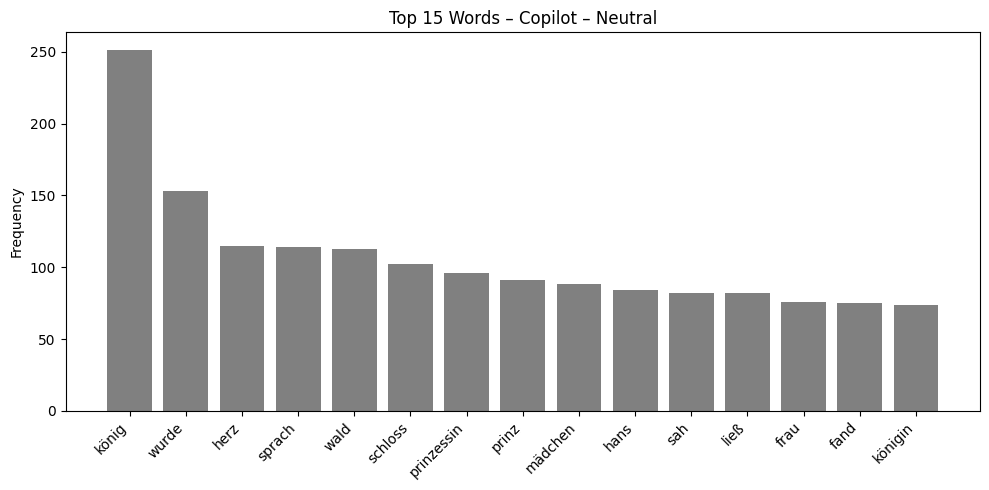

/tmp/ipython-input-1460129121.py:28: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(subset["Token"], rotation=45, ha="right")


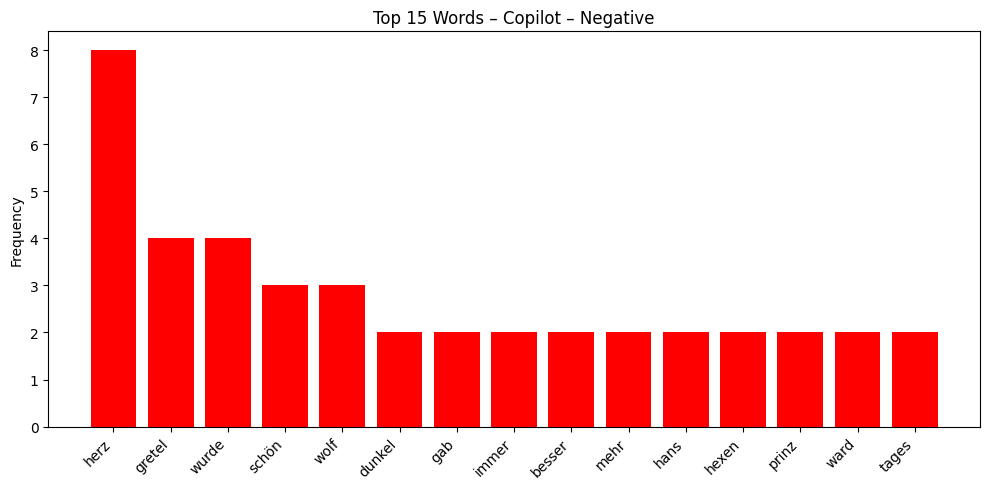

In [ ]:
import matplotlib.pyplot as plt

types = ["Original", "Wikipedia", "Copilot"]
sentiments = ["positive", "neutral", "negative"]

for text_type in types:
    for sentiment in sentiments:

        subset = (
            freq[(freq["Type"] == text_type) & (freq["Sentiment"] == sentiment)]
            .sort_values("Count", ascending=False)
            .head(15)
        )

        if subset.empty:
            continue

        fig, ax = plt.subplots(figsize=(10, 5))
        ax.bar(
            subset["Token"],
            subset["Count"],
            color=(
                "green" if sentiment == "positive"
                else "gray" if sentiment == "neutral"
                else "red"
            )
        )
        ax.set_xticklabels(subset["Token"], rotation=45, ha="right")
        ax.set_title(f"Top 15 Words – {text_type} – {sentiment.capitalize()}")
        ax.set_ylabel("Frequency")
        plt.tight_layout()
        fig.savefig(f"/content/drive/MyDrive/Märchen-Seminar/Sentiment Analyse   Emotion Detection/Images/figure_grimm_top15_{text_type}_{sentiment}.jpg", dpi=300, bbox_inches='tight')
        plt.show()

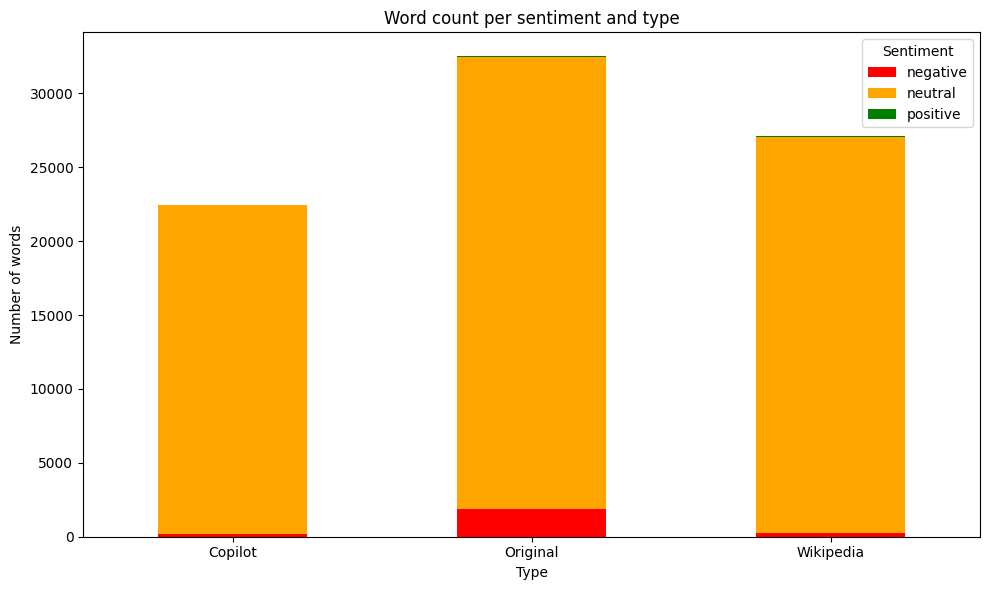

In [ ]:
fig, ax = plt.subplots(figsize=(10, 6))
type_sent = (
    df_tokens.groupby(["Type", "Sentiment"])
    .size()
    .unstack(fill_value=0)
)
type_sent.plot(kind="bar", stacked=True, ax=ax,
               color={"negative": "red", "neutral": "orange", "positive": "green"})
ax.set_title("Word count per sentiment and type")
ax.set_ylabel("Number of words")
ax.set_xticklabels(ax.get_xticklabels(), rotation=0)
plt.tight_layout()
fig.savefig("/content/drive/MyDrive/Märchen-Seminar/Sentiment Analyse   Emotion Detection/Images/figure_grimm_wordcount_sentiment_type.jpg", dpi=300, bbox_inches='tight')
plt.show()

# Emotion Detection

In [ ]:
from transformers import pipeline
import pandas as pd
import nltk
from tqdm import tqdm

# Download tokenizer resources
nltk.download("punkt")
nltk.download("punkt_tab")

# Load German emotion classification model
emotion_pipeline = pipeline(
    "text-classification",
    model="ChrisLalk/German-Emotions",
    top_k=1
)

# Load your Andersen corpus
df = pd.read_csv("/content/drive/MyDrive/Märchen-Seminar/Korpus/fairytale_corpus_grimm.csv", sep=",", encoding="utf-8")

rows = []

# Iterate through all texts and classify each sentence
for _, row in tqdm(df.iterrows(), total=len(df)):
    text = row["Text"]
    sentences = nltk.sent_tokenize(text, language="german")

    for i, s in enumerate(sentences, start=1):
        emotion = emotion_pipeline(s[:512])[0][0]["label"]
        rows.append({
            "Author": row["Author"],
            "Type": row["Type"],
            "Year": row["Year"],
            "OriginalAuthor": row["OriginalAuthor"],
            "Title": row["Title"],
            "SentenceNr": i,
            "Sentence": s,
            "Emotion": emotion
        })

# Create DataFrame with sentence-level emotion labels
df_emotions = pd.DataFrame(rows)

# Save to file
df_emotions.to_csv(
    "/content/drive/MyDrive/Märchen-Seminar/Sentiment Analyse   Emotion Detection/grimm_fairy_tales_emotion_sentences.csv",
    sep=",",
    index=False,
    encoding="utf-8-sig"
)

print("Done!")

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


config.json: 0.00B [00:00, ?B/s]

model.safetensors:   0%|          | 0.00/1.11G [00:00<?, ?B/s]

Loading weights:   0%|          | 0/201 [00:00<?, ?it/s]

tokenizer_config.json: 0.00B [00:00, ?B/s]

sentencepiece.bpe.model:   0%|          | 0.00/5.07M [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/17.1M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/280 [00:00<?, ?B/s]

100%|██████████| 214/214 [01:32<00:00,  2.31it/s]

Done!


In [ ]:
emotion_text = (
    df_emotions[df_emotions["Emotion"] != "neutral"]
    .groupby(["Type", "Title", "Emotion"])
    .size()
    .unstack(fill_value=0)
)

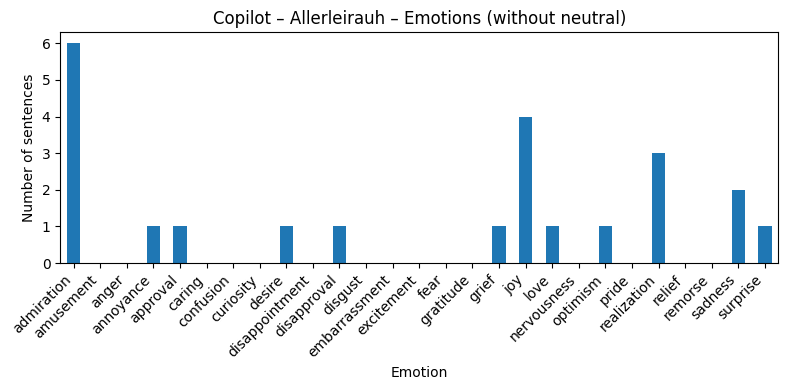

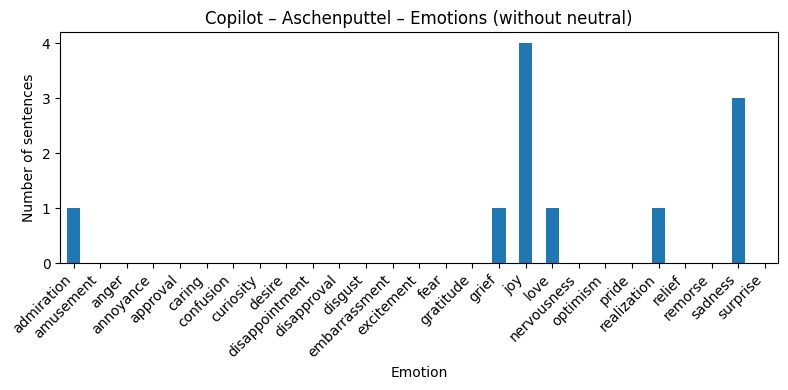

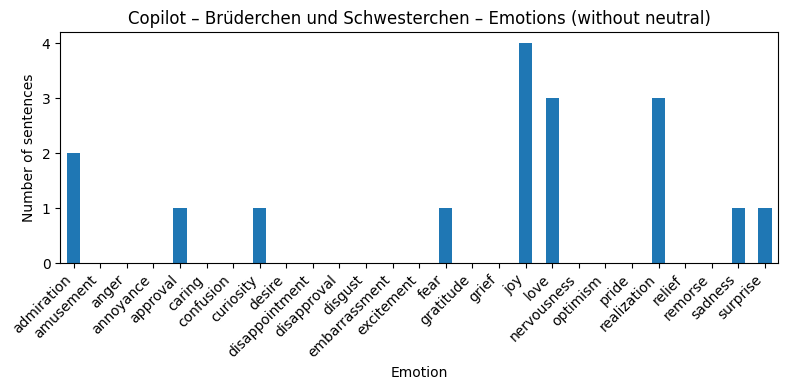

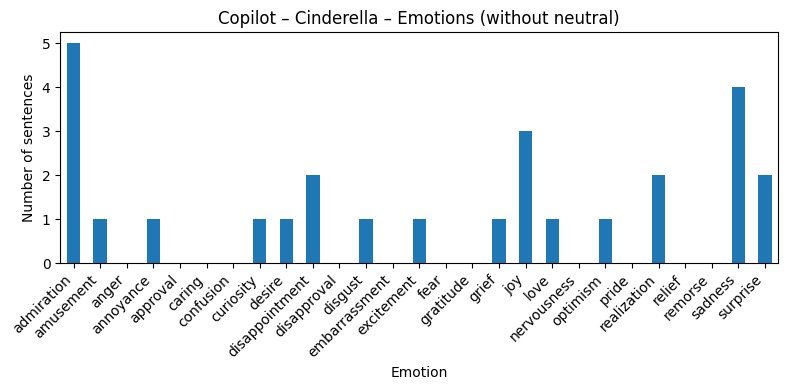

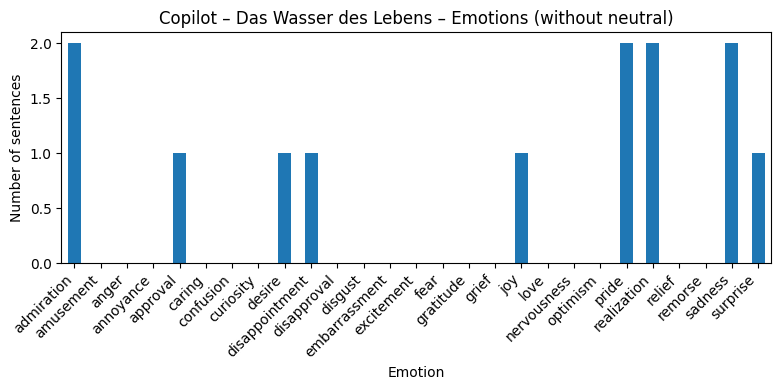

...

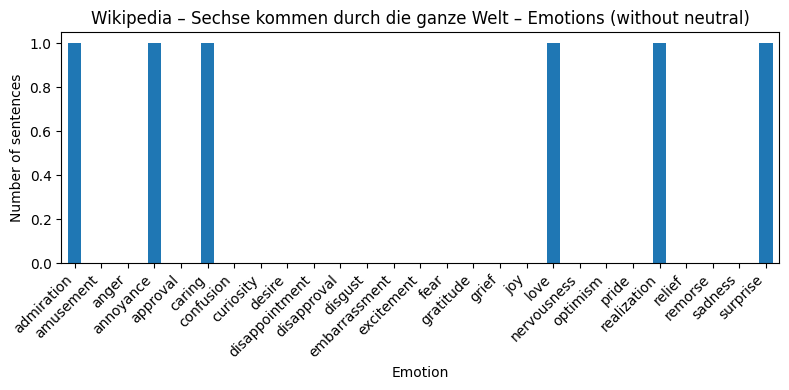

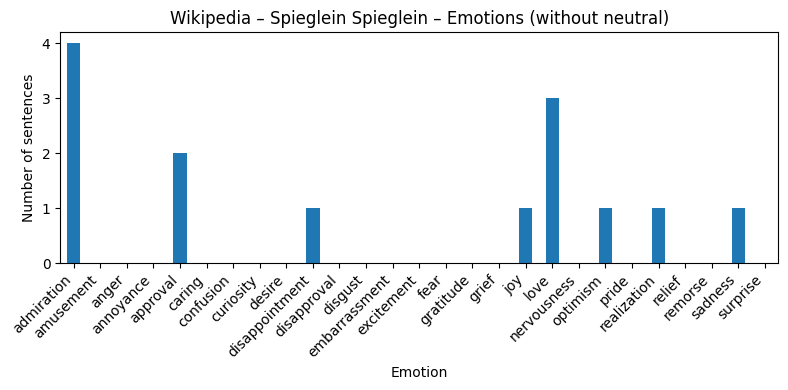

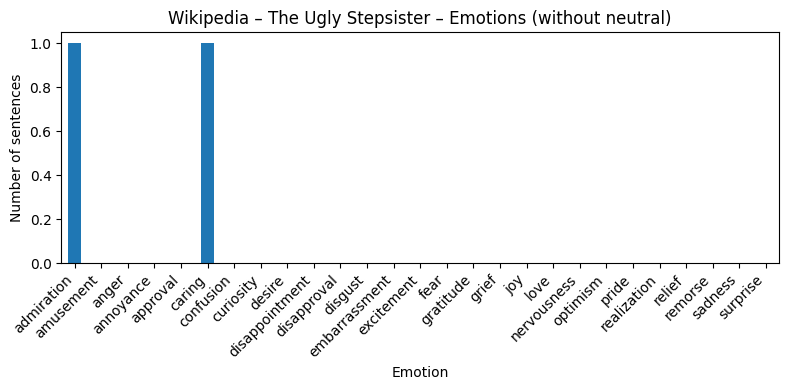

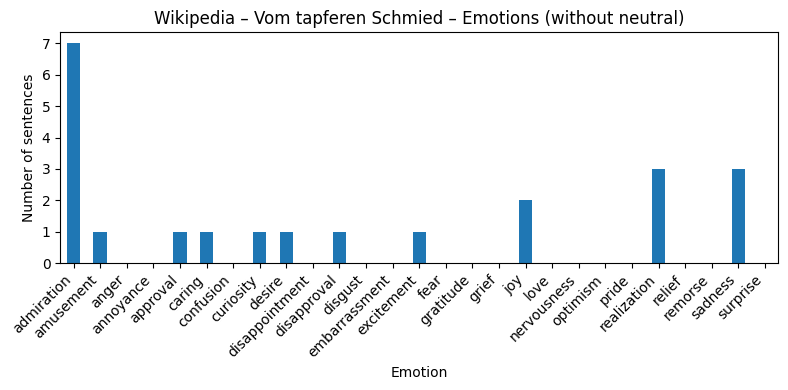

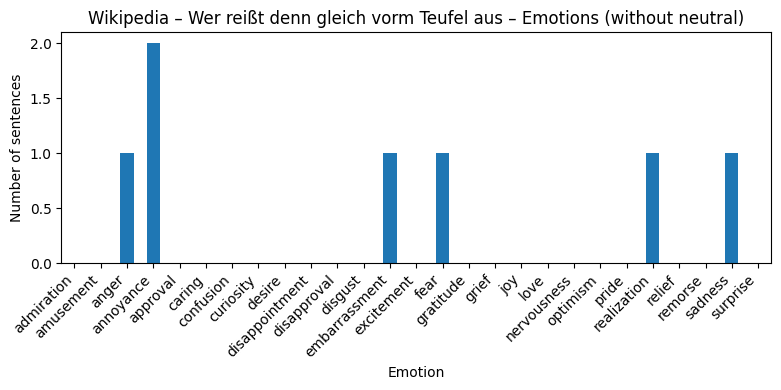

In [ ]:
# Emotions across fairy tales and adaptations
import matplotlib.pyplot as plt

for (typ, titel), row in emotion_text.iterrows():
    fig, ax = plt.subplots(figsize=(8, 4))
    row.plot(kind="bar", ax=ax)
    ax.set_title(f"{typ} – {titel} – Emotions (without neutral)")
    ax.set_ylabel("Number of sentences")
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
    plt.tight_layout()
    safe_titel = titel.replace(" ", "_").replace("/", "-")
    fig.savefig(f"/content/drive/MyDrive/Märchen-Seminar/Sentiment Analyse   Emotion Detection/Images/figure_grimm_emotions_{typ}_{safe_titel}.jpg", dpi=300, bbox_inches='tight')
    plt.show()

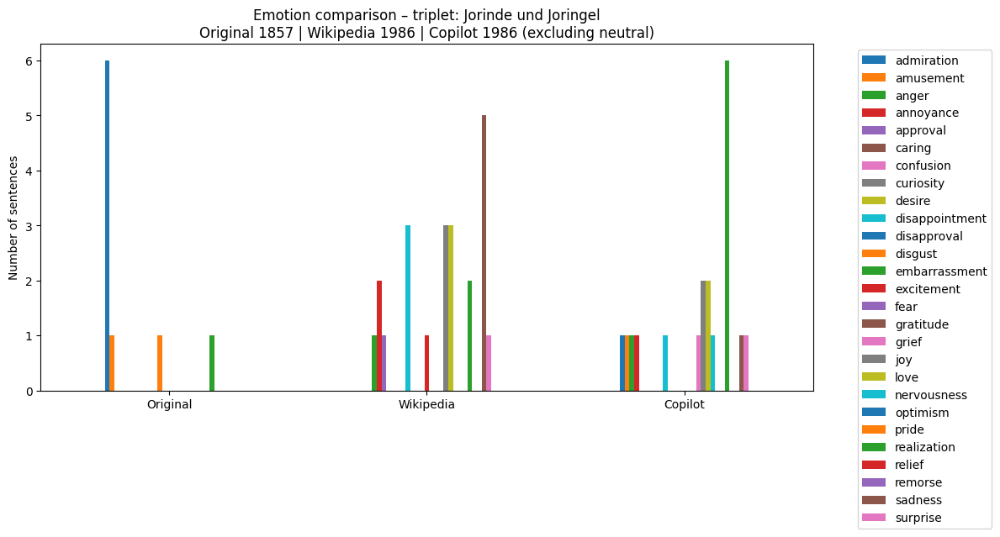

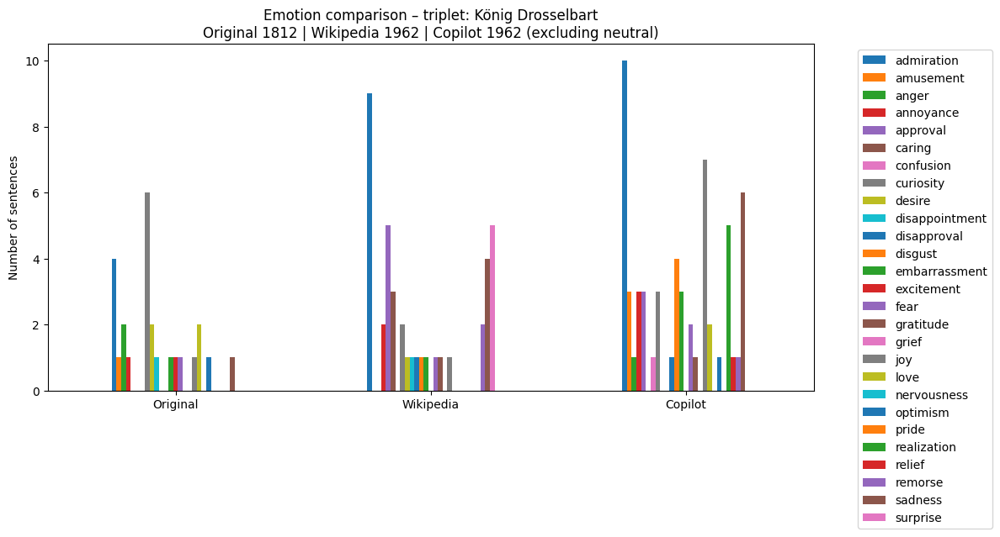

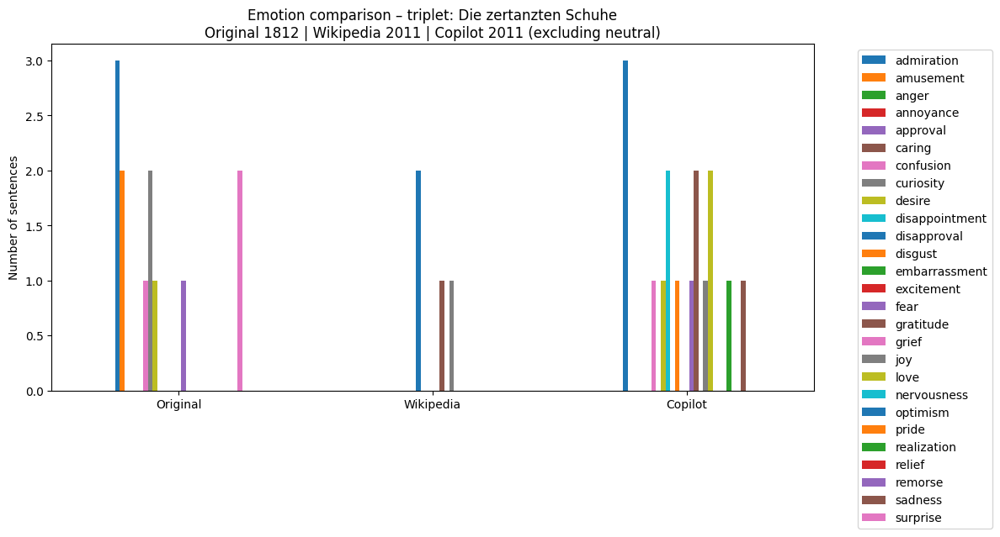

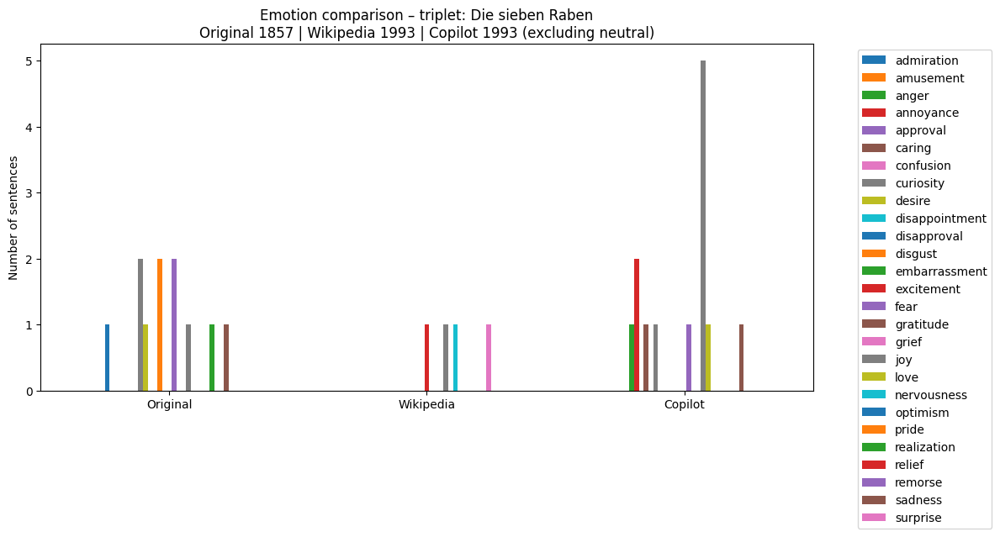

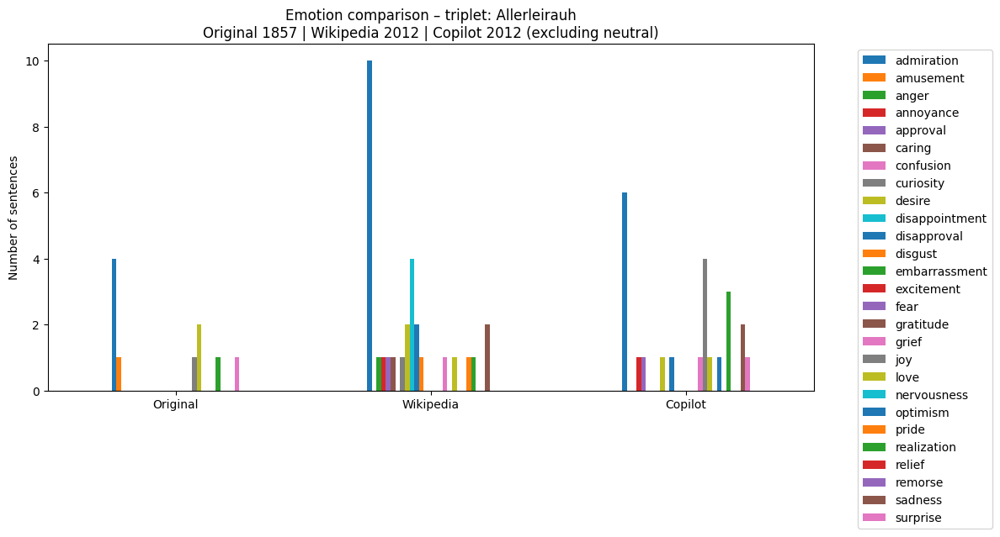

...

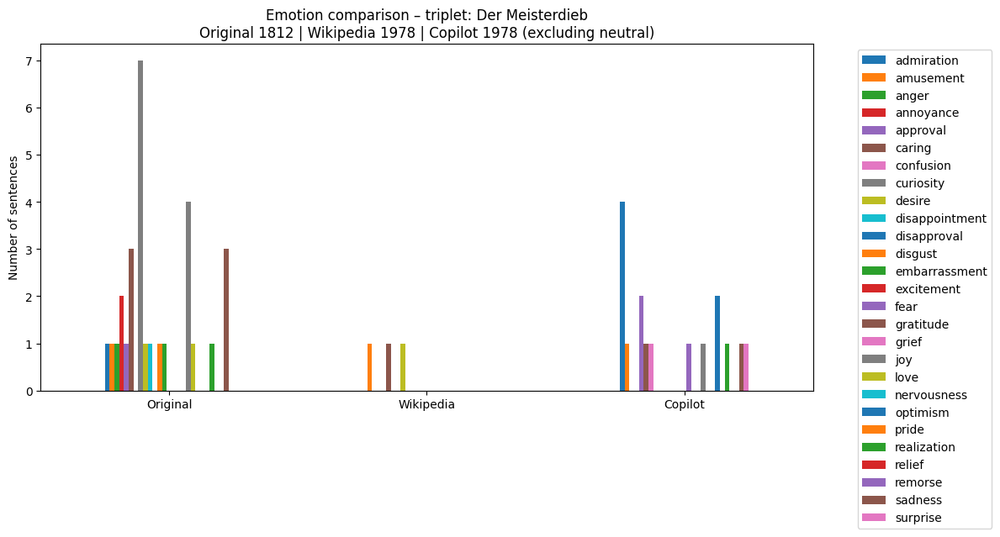

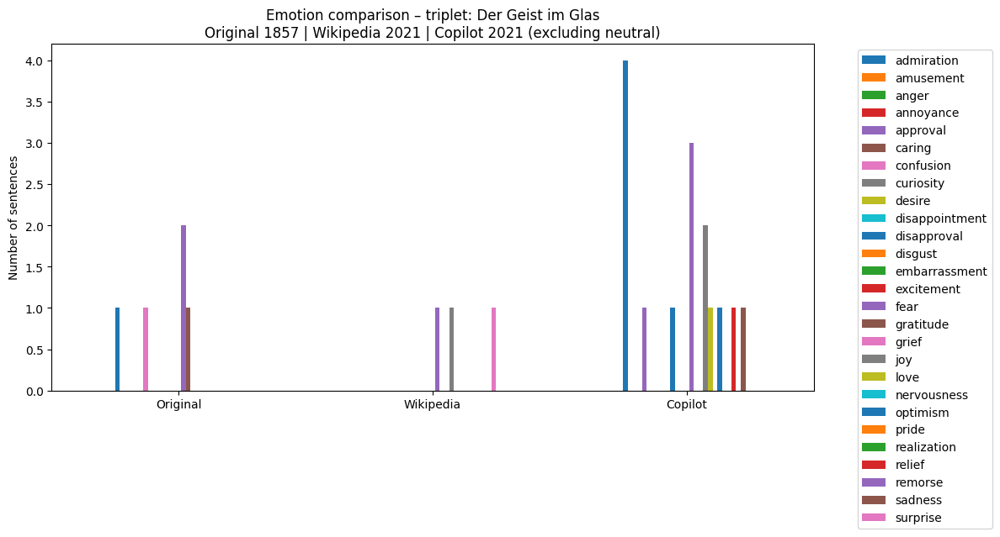

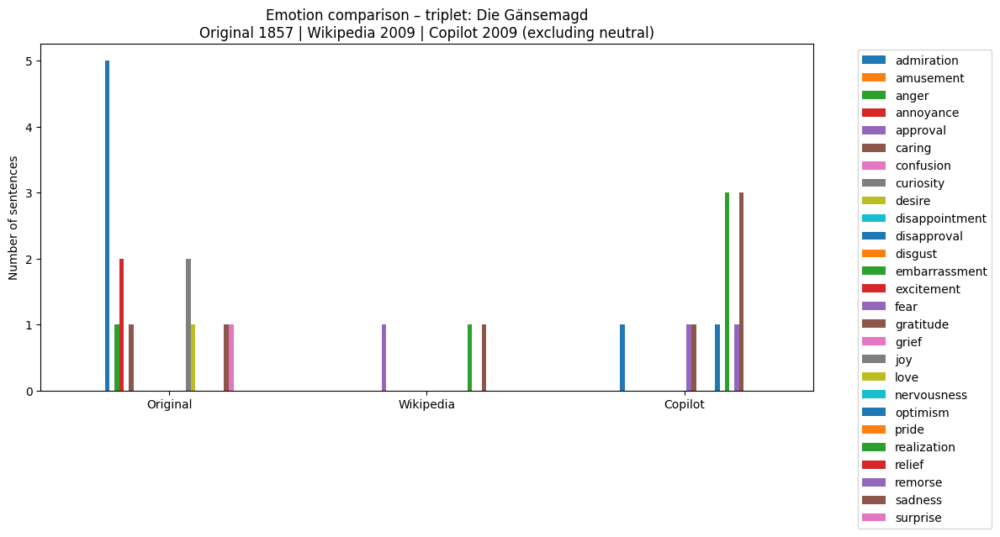

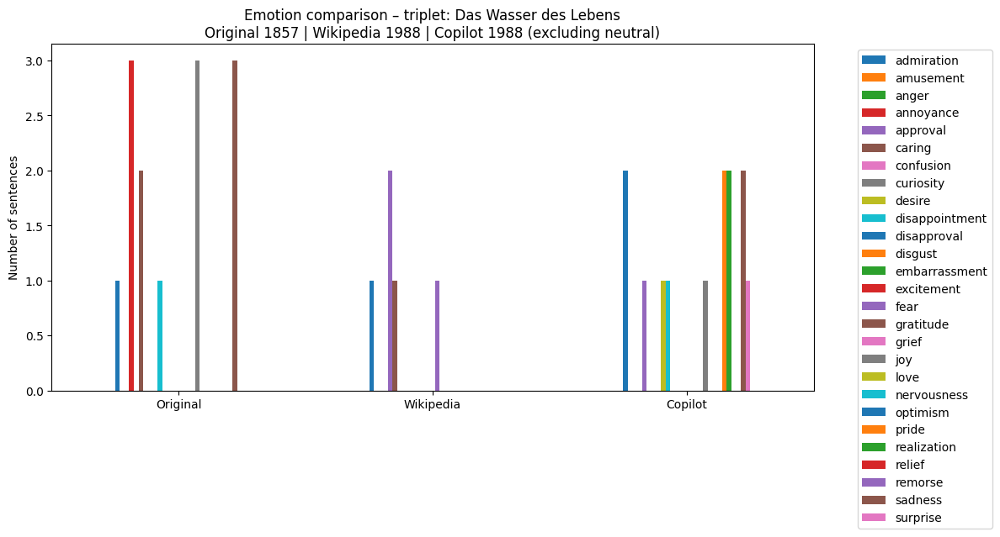

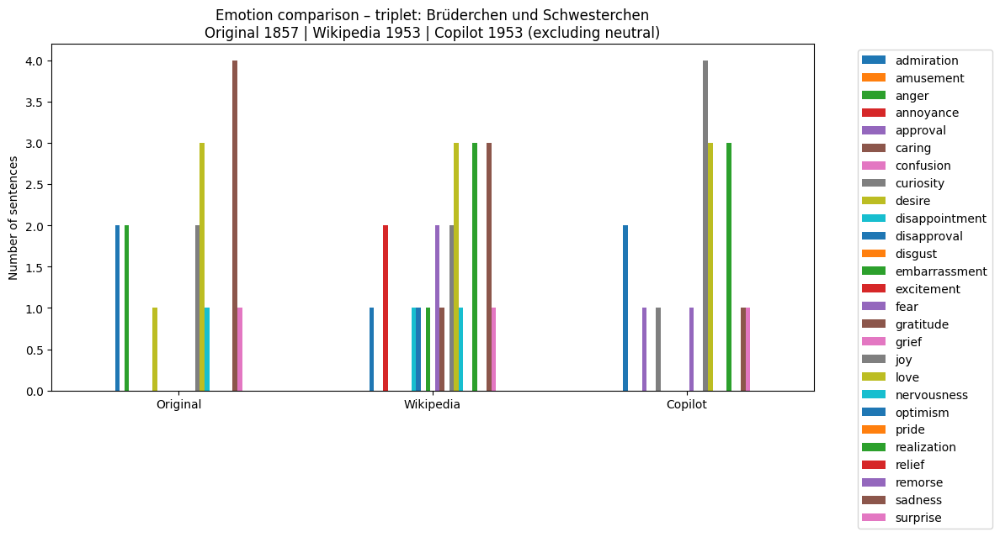

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

df = pd.read_csv("/content/drive/MyDrive/Märchen-Seminar/Sentiment Analyse   Emotion Detection/grimm_fairy_tales_emotion_sentences.csv")

# 1. Identify triplets
orig = df[df["Type"] == "Original"]
wiki = df[df["Type"] == "Wikipedia"]
copo = df[df["Type"] == "Copilot"]

pairs = pd.merge(
    wiki,
    copo,
    on=["Title", "Year", "Author"],
    suffixes=("_wiki", "_copo")
)

triplets = pd.merge(
    orig[["Title", "Year"]].drop_duplicates(),
    pairs,
    on="Title"
)

triplet_titles = triplets["Title"].unique().tolist()

# 2. Aggregate emotions (excluding neutral)
emotion_counts = (
    df[df["Emotion"] != "neutral"]
    .groupby(["Title", "Type", "Emotion"])
    .size()
    .unstack(fill_value=0)
)

# 3. Build a triplet (Original → Wikipedia → Copilot)
def triplet_for_title(title):
    o = emotion_counts.loc[(title, "Original")]
    w = emotion_counts.loc[(title, "Wikipedia")]
    c = emotion_counts.loc[(title, "Copilot")]
    return pd.DataFrame([o, w, c], index=["Original", "Wikipedia", "Copilot"])

# 4. Plot all triplets with explicit version years
for title in triplet_titles:
    subset = triplet_for_title(title)

    original_year = orig[orig["Title"] == title]["Year"].iloc[0]
    wiki_year = pairs[pairs["Title"] == title]["Year"].iloc[0]
    copo_year = pairs[pairs["Title"] == title]["Year"].iloc[0]

    fig, ax = plt.subplots(figsize=(12, 6))
    subset.plot(kind="bar", ax=ax)
    ax.set_title(
        f"Emotion comparison – triplet: {title}\n"
        f"Original {original_year} | Wikipedia {wiki_year} | Copilot {copo_year} (excluding neutral)"
    )
    ax.set_ylabel("Number of sentences")
    ax.legend(bbox_to_anchor=(1.05, 1), loc="upper left")
    ax.set_xticklabels(ax.get_xticklabels(), rotation=0)
    plt.tight_layout()
    safe_title = title.replace(" ", "_").replace("/", "-")
    fig.savefig(f"/content/drive/MyDrive/Märchen-Seminar/Sentiment Analyse   Emotion Detection/Images/figure_grimm_triplet_{safe_title}.jpg", dpi=300, bbox_inches='tight')
    plt.show()

### Word frequencies per emotion

In [ ]:
df = pd.read_csv("/content/drive/MyDrive/Märchen-Seminar/Sentiment Analyse   Emotion Detection/grimm_fairy_tales_emotion_sentences.csv", sep=",", encoding="utf-8")
print(df.columns)
df.head()

Index(['Author', 'Type', 'Year', 'OriginalAuthor', 'Title', 'SentenceNr',
       'Sentence', 'Emotion'],
      dtype='object')


,Author,Type,Year,OriginalAuthor,Title,SentenceNr,Sentence,Emotion
0,Grimm,Wikipedia,2014,Grimm,Die drei Federn,1,"Die drei Federn\n\nFürst Gundolf, des Regieren...",neutral
1,Grimm,Wikipedia,2014,Grimm,Die drei Federn,2,"Er verspricht seinem Hofmeister Julius, nur de...",neutral
2,Grimm,Wikipedia,2014,Grimm,Die drei Federn,3,Seine älteren Söhne Gerhard und Gebhard sind f...,neutral
3,Grimm,Wikipedia,2014,Grimm,Die drei Federn,4,Von den Fähigkeiten ihres jüngeren Bruders Gus...,annoyance
4,Grimm,Wikipedia,2014,Grimm,Die drei Federn,5,Damit die Brüder nicht in derselben Richtung s...,neutral


In [ ]:
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import string

nltk.download("punkt")
nltk.download("stopwords")

stop_words = set(stopwords.words("german"))

def preprocess(text):
    text = text.lower()
    tokens = word_tokenize(text, language="german")
    tokens = [t for t in tokens if t not in string.punctuation]
    tokens = [t for t in tokens if t not in stop_words]
    return tokens

df_emotions["Tokens"] = df_emotions["Sentence"].apply(preprocess)

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [ ]:
# Top 30 words per emotion
from collections import Counter

emotion_words = {}

for emotion in df_emotions["Emotion"].unique():
    subset = df_emotions[df_emotions["Emotion"] == emotion]

    all_tokens = []
    for tokens in subset["Tokens"]:
        all_tokens.extend(tokens)

    counter = Counter(all_tokens)
    emotion_words[emotion] = counter.most_common(30)

for emotion, words in emotion_words.items():
    print(f"\n=== {emotion.upper()} ===")
    for word, freq in words:
        print(f"{word}: {freq}")


=== NEUTRAL ===
„: 1415
“: 1392
könig: 733
sprach: 488
wald: 270
schloss: 244
prinz: 235
ging: 235
prinzessin: 234
kam: 229
frau: 227
vater: 224
sagte: 222
–: 214
hans: 197
drei: 194
mädchen: 183
königin: 180
mutter: 171
sah: 169
zurück: 165
mann: 163
wurde: 158
mehr: 152
'': 150
``: 148
ließ: 148
zwei: 144
ab: 142
nacht: 141

=== ANNOYANCE ===
“: 47
„: 41
könig: 26
mann: 11
sprach: 11
dummling: 7
sagte: 7
frau: 6
tochter: 5
wer: 5
fragte: 5
zwei: 5
alte: 5
schloss: 5
böse: 4
kind: 4
wald: 4
fee: 4
bösen: 4
ganzen: 4
heraus: 4
männchen: 4
kam: 4
ging: 4
zornig: 4
ward: 4
tod: 4
ließ: 4
wütend: 3
hexe: 3

=== EXCITEMENT ===
tag: 4
welt: 4
stiefmutter: 4
königreich: 3
„: 3
mädchen: 3
hochzeit: 3
–: 3
freute: 3
fürst: 2
geburtstag: 2
aufgabe: 2
schneewittchen: 2
prinzessin: 2
dorf: 2
kikeriki: 2
goldene: 2
“: 2
schauen: 2
singen: 2
haare: 2
aufregung: 2
glaubte: 2
dürfte: 2
gehen: 2
—: 2
nächsten: 1
gundolfs: 1
60.: 1
gibt: 1

=== APPROVAL ===
“: 15
„: 12
mehr: 6
antwortete: 6
—: 5
könig

In [ ]:
import pandas as pd
from collections import Counter

rows = []

for emotion in df_emotions["Emotion"].unique():
    subset = df_emotions[df_emotions["Emotion"] == emotion]

    all_tokens = []
    for tokens in subset["Tokens"]:
        all_tokens.extend(tokens)

    counter = Counter(all_tokens)

    for word, freq in counter.most_common(30):
        rows.append({
            "Emotion": emotion,
            "Token": word,
            "Frequency": freq
        })

df_out = pd.DataFrame(rows)

df_out.to_csv("/content/drive/MyDrive/Märchen-Seminar/Sentiment Analyse   Emotion Detection/grimm_emotion_top30_tokens.csv", index=False, encoding="utf-8-sig")

In [ ]:
# Token Frequencies per emotion
emotion_wordlists = {}

for emotion in df_emotions["Emotion"].unique():
    subset = df_emotions[df_emotions["Emotion"] == emotion]

    all_tokens = []
    for tokens in subset["Tokens"]:
        all_tokens.extend(tokens)

    emotion_wordlists[emotion] = all_tokens

for emotion, words in emotion_wordlists.items():
    print(f"\n=== {emotion.upper()} ({len(words)} Wörter) ===")
    print(words[:100])


=== NEUTRAL (67422 Wörter) ===
['drei', 'federn', 'fürst', 'gundolf', 'regierens', 'müde', 'sucht', 'nachfolger', 'söhnen', 'verspricht', 'hofmeister', 'julius', 'demjenigen', 'söhne', 'zepter', 'übergeben', 'feinsten', 'teppich', 'hause', 'bringt', 'älteren', 'söhne', 'gerhard', 'gebhard', 'fest', 'davon', 'überzeugt', 'aufgabe', 'zufriedenheit', 'vaters', 'lösen', 'feinsten', 'teppich', 'hause', 'bringen', 'brüder', 'richtung', 'suchen', 'wirft', 'fürst', 'gundolf', 'drei', 'federn', 'ausgestopften', 'geliebten', 'falken', 'luft', 'gerhard', 'gebhard', 'federn', 'osten', 'westen', 'folgen', 'folgt', 'gustav', 'feder', 'wald', 'kleinen', 'höhle', 'begegnet', 'sprechenden', 'kröte', 'itsche', 'zehn', 'jahre', 'zuvor', 'kochtopf', 'fürstenkochs', 'gerettet', 'gustav', 'spricht', 'itsche', 'wunsch', 'schönsten', 'teppich', 'spricht', 'zauberspruch', 'öffnet', 'kiste', 'feinsten', 'teppich', 'bringt', 'gustav', 'vater', 'hause', 'währenddessen', 'gerhard', 'gebhard', 'seite', 'waldes', '

In [ ]:
import pandas as pd
from collections import Counter

rows = []

for emotion, words in emotion_wordlists.items():
    counter = Counter(words)
    for token, freq in counter.items():
        rows.append({
            "Emotion": emotion,
            "Token": token,
            "Frequency": freq
        })

df_out = pd.DataFrame(rows)
df_out.to_csv("/content/drive/MyDrive/Märchen-Seminar/Sentiment Analyse   Emotion Detection/grimm_emotion_token_frequencies.csv", index=False, encoding="utf-8-sig")

In [ ]:
from collections import defaultdict

token_to_emotions = defaultdict(set)

for emotion, tokens in emotion_wordlists.items():
    for t in tokens:
        token_to_emotions[t].add(emotion)

multi_emotion_tokens = {t: emos for t, emos in token_to_emotions.items() if len(emos) > 1}

In [ ]:
# Overlaps of tokens in multiple emotions
import pandas as pd
from collections import defaultdict

token_to_emotions = defaultdict(set)

for emotion, tokens in emotion_wordlists.items():
    for t in tokens:
        token_to_emotions[t].add(emotion)

rows = []

for token, emos in token_to_emotions.items():
    if len(emos) > 1:  # Token kommt in mehreren Emotionen vor
        rows.append({
            "Token": token,
            "EmotionCount": len(emos),
            "Emotions": ", ".join(sorted(emos))
        })

df_duplicates = pd.DataFrame(rows)
df_duplicates.to_csv("/content/drive/MyDrive/Märchen-Seminar/Sentiment Analyse   Emotion Detection/grimm_tokens_in_multiple_emotions.csv", index=False, encoding="utf-8-sig")

In [ ]:
sorted(
    [(token, sorted(list(emos))) for token, emos in multi_emotion_tokens.items()],
    key=lambda x: len(x[1]),
    reverse=True
)

[('könig',
  ['admiration',
   'amusement',
   'anger',
   'annoyance',
   'approval',
   'caring',
   'confusion',
   'curiosity',
   'desire',
   'disappointment',
   'disapproval',
   'disgust',
   'embarrassment',
   'excitement',
   'fear',
   'gratitude',
   'grief',
   'joy',
   'love',
   'nervousness',
   'neutral',
   'optimism',
   'pride',
   'realization',
   'relief',
   'remorse',
   'sadness',
   'surprise']),
 ('vater',
  ['admiration',
   'amusement',
   'anger',
   'annoyance',
   'approval',
   'caring',
   'confusion',
   'curiosity',
   'desire',
   'disappointment',
   'disapproval',
   'disgust',
   'embarrassment',
   'fear',
   'gratitude',
   'grief',
   'joy',
   'love',
   'neutral',
   'optimism',
   'pride',
   'realization',
   'relief',
   'sadness',
   'surprise']),
 ('“',
  ['admiration',
   'amusement',
   'anger',
   'annoyance',
   'approval',
   'caring',
   'confusion',
   'curiosity',
   'disappointment',
   'disapproval',
   'disgust',
   'emba

In [ ]:
import pandas as pd

df_multi = pd.DataFrame([
    {"Token": token, "Emotions": ", ".join(sorted(list(emos))), "EmotionCount": len(emos)}
    for token, emos in multi_emotion_tokens.items()
])

df_multi
df_multi.to_csv("/content/drive/MyDrive/Märchen-Seminar/Sentiment Analyse   Emotion Detection/grimm_multi_emotion_tokens_list.csv", index=False, encoding="utf-8-sig")

In [ ]:
# Token with the most emotion signals
sorted(
    [(token, len(emos)) for token, emos in multi_emotion_tokens.items()],
    key=lambda x: x[1],
    reverse=True
)[:20]

[('könig', 28),
 ('vater', 25),
 ('“', 25),
 ('wald', 24),
 ('frau', 24),
 ('„', 24),
 ('prinzessin', 24),
 ('sprach', 23),
 ('königin', 22),
 ('–', 21),
 ('mädchen', 20),
 ('kind', 20),
 ('sagte', 20),
 ('schon', 19),
 ('zurück', 19),
 ('welt', 19),
 ('kam', 19),
 ('leben', 18),
 ('mann', 18),
 ('herz', 18)]

In [ ]:
# Separate function words from content words
stop_candidates = [
    token for token, emos in multi_emotion_tokens.items()
    if len(emos) > 10
]
print(stop_candidates)

['drei', 'fest', 'davon', 'bringen', 'brüder', 'wald', 'vater', 'leben', 'alten', 'allein', 'ring', 'zwei', 'mann', 'mädchen', 'kleid', 'beiden', 'heraus', 'herz', 'glück', 'bald', 'darauf', 'wer', 'schon', 'junge', 'jungen', 'reich', 'schloss', 'dorf', 'lässt', 'sohn', 'lange', 'hand', 'königin', 'wurde', 'könig', 'frau', 'macht', 'zurück', 'schneewittchen', 'stiefmutter', 'böse', 'jäger', 'weiß', 'sieben', 'arbeit', 'sei', 'tod', 'hans', 'mutter', 'gold', 'tochter', 'großen', 'pferd', 'mehr', 'ende', 'tages', 'trinken', 'gar', 'gibt', 'wäre', 'kommt', 'königstochter', '„', '“', 'prinzessin', 'endlich', 'ersten', 'nächsten', 'morgen', 'meint', 'königs', 'menschen', 'zeit', 'gekommen', 'hochzeit', 'kind', 'gott', 'teufel', 'kopf', 'sehen', 'große', 'licht', 'viele', 'stand', 'immer', 'kinder', 'welt', 'dabei', 'steht', 'plötzlich', 'augen', 'tag', 'nacht', 'gestalt', 'alte', 'kaum', 'wohl', 'land', 'ach', 'könne', 'haus', '–', 'erde', 'freude', 'niemand', 'ganz', 'tat', 'helfen', 'gold

In [ ]:
# Recognising characters and place names
character_candidates = [
    token for token, emos in multi_emotion_tokens.items()
    if token[0].islower() is False or token in ["gerda", "klaus"]
]
print(character_candidates)

['„', '“', '…', '–', '’', '16', 'klaus', '``', "''", '16.', '15', "'du", "'ich", "'s", '—', '\u200d']


In [ ]:
# Isolate emotionally charged words
emotion_words = [
    (token, emos)
    for token, emos in multi_emotion_tokens.items()
    if 1 < len(emos) <= 3
]
print(emotion_words)

[('söhnen', {'neutral', 'excitement'}), ('hofmeister', {'desire', 'neutral', 'realization'}), ('demjenigen', {'admiration', 'neutral'}), ('teppich', {'gratitude', 'neutral'}), ('gerhard', {'neutral', 'approval'}), ('gebhard', {'neutral', 'approval'}), ('zufriedenheit', {'neutral', 'caring'}), ('lösen', {'neutral', 'disapproval', 'sadness'}), ('wirft', {'neutral', 'annoyance', 'anger'}), ('westen', {'fear', 'neutral'}), ('feder', {'desire', 'neutral', 'realization'}), ('sprechenden', {'neutral', 'sadness'}), ('itsche', {'admiration', 'neutral', 'sadness'}), ('zehn', {'admiration', 'neutral', 'curiosity'}), ('schönsten', {'admiration', 'neutral'}), ('öffnet', {'neutral', 'love'}), ('getroffen', {'neutral', 'sadness'}), ('gelegenen', {'neutral', 'excitement'}), ('vergnügen', {'neutral', 'realization'}), ('pakt', {'neutral', 'anger'}), ('untertanin', {'neutral', 'love'}), ('gustavs', {'gratitude', 'neutral', 'joy'}), ('nacheinander', {'neutral', 'disappointment'}), ('rät', {'neutral', 'dis

In [ ]:
# Define df_freq withouth neutral
import pandas as pd
from collections import Counter

rows = []

for emotion, tokens in emotion_wordlists.items():
    if emotion == "neutral":
        continue

    counter = Counter(tokens)
    for token, freq in counter.items():
        rows.append({
            "Token": token,
            "Emotion": emotion,
            "Frequency": freq
        })

df_freq = pd.DataFrame(rows)

In [ ]:
from collections import defaultdict

token_to_emotions = defaultdict(set)

for emotion, tokens in emotion_wordlists.items():
    if emotion == "neutral":
        continue

    for t in tokens:
        token_to_emotions[t].add(emotion)

df_ambiguity = pd.DataFrame([
    {
        "Token": token,
        "EmotionCount": len(emos),
        "Emotions": ", ".join(sorted(emos))
    }
    for token, emos in token_to_emotions.items()
])

stop_candidates = df_ambiguity[df_ambiguity["EmotionCount"] >= 10]["Token"].tolist()

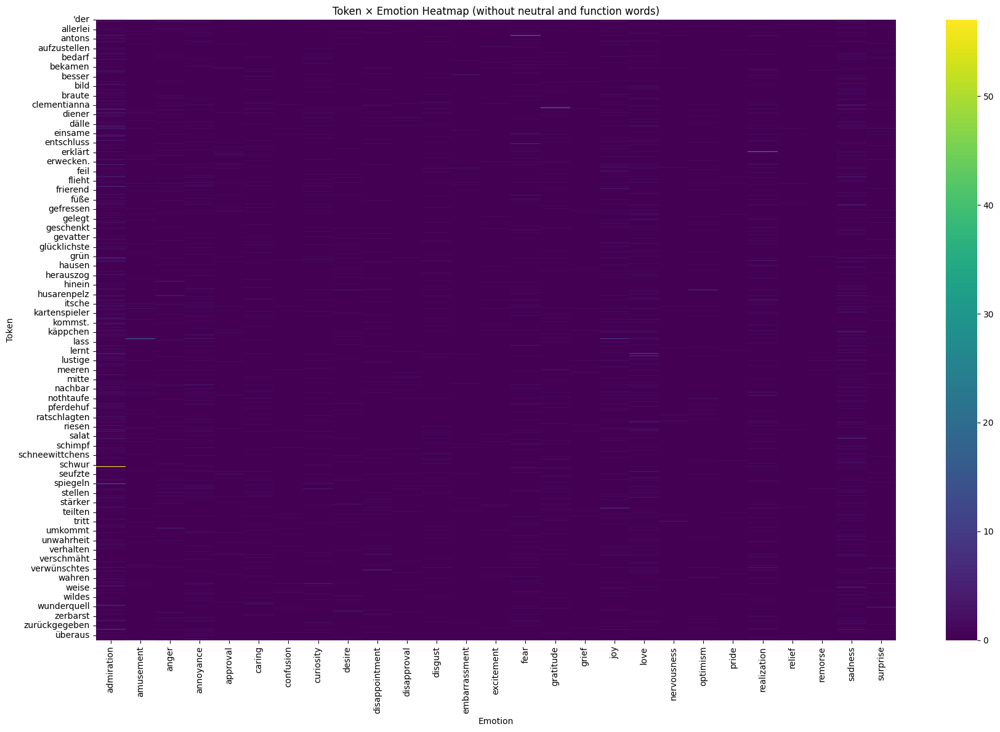

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

df_filtered = df_freq[~df_freq["Token"].isin(stop_candidates)]

heatmap_df = df_filtered.pivot_table(
    index="Token",
    columns="Emotion",
    values="Frequency",
    fill_value=0
)

fig, ax = plt.subplots(figsize=(18, 12))
sns.heatmap(heatmap_df, cmap="viridis", ax=ax)
ax.set_title("Token × Emotion Heatmap (without neutral and function words)")
plt.tight_layout()
fig.savefig("/content/drive/MyDrive/Märchen-Seminar/Sentiment Analyse   Emotion Detection/Images/figure_grimm_token_emotion_heatmap.jpg", dpi=300, bbox_inches='tight')
plt.show()

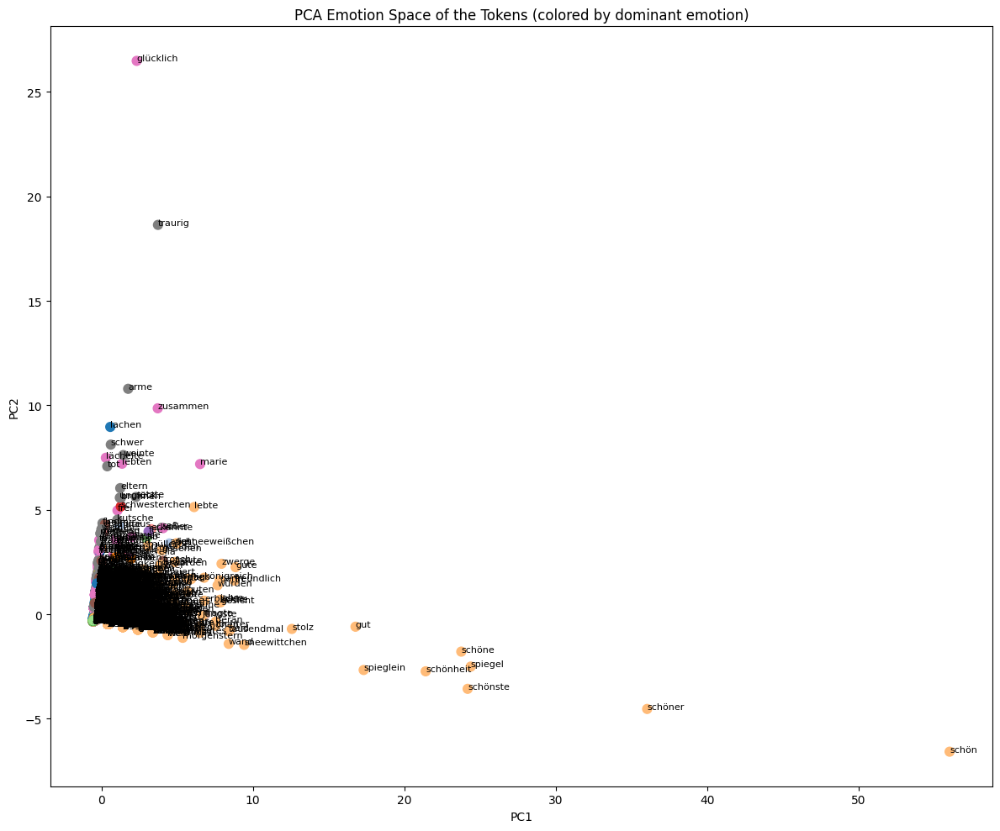

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# 1. Determine dominant emotion per token
dominant = (
    heatmap_df
    .idxmax(axis=1)
    .rename("DominantEmotion")
)

# 2. Compute PCA
pca = PCA(n_components=2)
coords = pca.fit_transform(heatmap_df)

# 3. Assign colors
emotions = dominant.unique()
palette = plt.cm.tab20
color_map = {emo: palette(i % 20) for i, emo in enumerate(emotions)}
colors = dominant.map(color_map)

# 4. Plot
fig, ax = plt.subplots(figsize=(12, 10))
ax.scatter(coords[:, 0], coords[:, 1], c=colors, s=60)

for i, token in enumerate(heatmap_df.index):
    ax.text(coords[i, 0], coords[i, 1], token, fontsize=8)

ax.set_title("PCA Emotion Space of the Tokens (colored by dominant emotion)")
ax.set_xlabel("PC1")
ax.set_ylabel("PC2")
plt.tight_layout()
fig.savefig("/content/drive/MyDrive/Märchen-Seminar/Sentiment Analyse   Emotion Detection/Images/figure_grimm_pca_emotion_space.jpg", dpi=300, bbox_inches='tight')
plt.show()